In [76]:
#since noteboke doesn't work in jupiterlabs    %matplotlib notebook 
%matplotlib notebook
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
import os
os.chdir('/home/dana_z/ssd_2TB/6OHDA')
#import mpld3
#mpld3.enable_notebook()
import numpy as np
import scipy as sci
from scipy import signal
from matplotlib import pyplot as plt
from matplotlib import gridspec
import matplotlib.colors as Mcolors
import matplotlib.cm as cmx
import sys
import h5py
from IO import *
from utils import *
from plotUtils import *
from ColorSchems import colorPallet as CP
import pptx
from pptx import Presentation 
from pptx.util import Inches
from io import BytesIO
import re
import warnings
import pandas as pd
import sqlalchemy as db
import gc
from tqdm import tqdm
import seaborn as sns
import pywt # wavelet package
import matplotlib.cm as cm

In [3]:
Files = ['FinalData_6OHDA.h5','FinalData_6OHDA_H.h5','FinalData_6OHDA_H_skip.h5','FinalData_6OHDA_skip.h5']
miceList = getMiceList(Files[0])
betaMice = ['8430','4539','7584','7909','1222']

In [4]:
#path to folder where figures should be saved
figFolder = '/home/dana_z/ssd_2TB/6OHDA/figs/paper1_edit3/'

<h2> Calculate session stats for results sction 1 </h2>

In [5]:
df = pd.DataFrame()
periods = {'Healthy': lambda day: day== 0,
           'Day 1-4': lambda day: (day >0)&(day<5),
           'Day 5-12': lambda day: (day >4)&(day<13),
           'Day 13-20':lambda day: (day >12)&(day<21),
           'One Month': lambda day: day > 20}

for per in periods.keys():
    data = getData(Files[1],['trace'],period ='Pre',day =periods[per])
    for sess in data.keys():
        m = sess[:4]
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])

        numRed = int(data[sess]['trace']['numred'])
        cre = getCreType(Files[1],m)
        numred = int(data[sess]['trace']['numred'])
        
        df= df.append({'mouse':m,'sess':sess,'day':day,
                       'period': periodCalc(day),'cre':cre,
                       'numred':numred,'numMsn':data[sess]['trace']['dff'].shape[0]},ignore_index=True)

/home/dana_z/ssd_2TB/6OHDA/IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value


cleaning up trace data
cleaning up trace data
cleaning up trace data
cleaning up trace data
cleaning up trace data


In [6]:
df[~df.mouse.isin(['2981','2980','2976'])].groupby(['period','cre']).agg([np.mean,sci.stats.sem])

/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


day                numMsn               numred          
                    mean       sem        mean        sem      mean       sem
period    cre                                                                
Day 1-4   CHI   2.727273  0.332782   63.090909  20.364164  0.727273  0.272727
          PV    2.444444  0.270828  164.000000  27.171809  1.666667  0.268133
Day 13-20 CHI  16.071429  0.666830   94.000000  16.896583  1.285714  0.285714
          PV   15.214286  0.585339  182.500000  38.492150  2.571429  0.796381
Day 5-12  CHI   8.800000  0.521132   93.000000  17.030004  1.250000  0.239242
          PV    8.351351  0.387911  196.054054  25.290859  2.837838  0.498517
Healthy   CHI   0.000000  0.000000  202.238095  38.996209  1.428571  0.320501
          PV    0.000000  0.000000  184.166667  29.495015  1.833333  0.345371
One Month CHI  32.600000  0.718022   89.500000  21.292278  0.800000  0.290593
          PV   31.555556  0.783708  161.666667  53.166144  1.000000  0.235702

<h2> Figures </h2>

<h3> Figure 1 </h3>

/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:48: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  lfp = hf[m][s]['ePhys']['lfp'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value


cleaning up trace data
cleaning up lfp data
cleaning up speed data


<IPython.core.display.Javascript object>


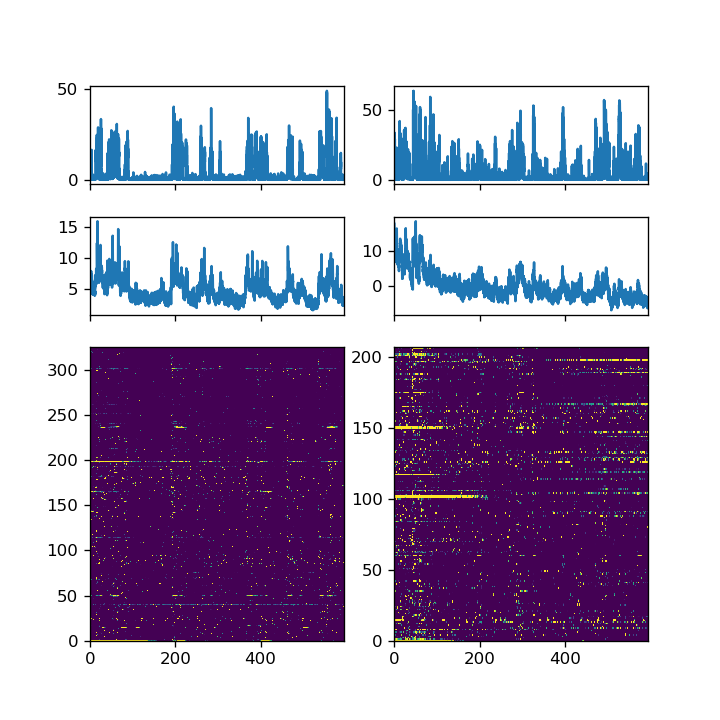

<IPython.core.display.Javascript object>


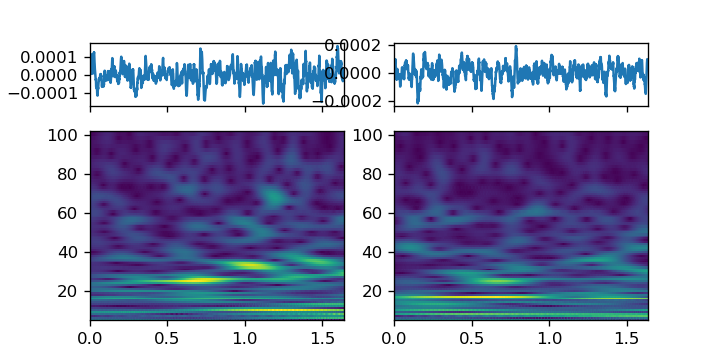

/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:28: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:28: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.


In [55]:
f = h5py.File('Spectograms.hdf5','r')

egSess = ['1208_BaselineL','1208_day14']
egMouse = '1208'
data = getData(Files[1],['lfp','speed','trace'],period ='Pre',day =lambda day: (day==14) or (day==0), mice = [egMouse])

# plot lfp example:
fig, ax = plt.subplots(3,2,figsize=(6,6),sharex='col',gridspec_kw={'height_ratios': [1,1,3]})
fig2, ax2 = plt.subplots(2,2,figsize=(6,3),sharex='col',gridspec_kw={'height_ratios': [1,3]})
for tPoint in range(0,2):
    sess = egSess[tPoint]
    dtS = 1/data[sess]['speed']['Fs']
    dtL = 1/data[sess]['lfp']['FS']
    ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
    tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL

    ax[0,tPoint].plot(ts,data[sess]['speed']['speed'][0,:])
    
    ts = np.arange(0, np.max(data[sess]['trace']['dff'].shape[1])) * dtS 
    dff = data[sess]['trace']['dff']
    ax[1,tPoint].plot(ts[:],np.sum(dff[:,:],axis=0))
    
    lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
    lfp = data[sess]['lfp']['lfp']
    lfp[(lfpOutliers[:,0]==1)] = np.nan
    ax2[0,tPoint].plot(tl[0:5000],lfp[0:5000])

    freq = f[egMouse]['freq'].value
    coeff = np.abs(f[egMouse][sess]['Pre']['coeff'].value)
    
    coeff[:,(lfpOutliers[:,0]==1)] = np.nan

    ax2[1,tPoint].pcolormesh(tl[0:5000],freq,coeff[:,0:5000], rasterized=True)
    ax[2,tPoint].pcolormesh(ts[:],np.arange(0,dff.shape[0]),dff[:,:],vmax=.2,vmin=0.1, rasterized=True)

# fig.savefig(figFolder+'figure1a_Ca_'+str(egSess[0])+"_"+str(egSess[1][5:])+'.png')
# fig.savefig(figFolder+'figure1a_Ca_'+str(egSess[0])+"_"+str(egSess[1][5:])+'.svg',transparent=True)
# fig2.savefig(figFolder+'figure1a_lfp_'+str(egSess[0])+"_"+str(egSess[1][5:])+'.png')
# fig2.savefig(figFolder+'figure1a_lfp_'+str(egSess[0])+"_"+str(egSess[1][5:])+'.svg',transparent=True)

cleaning up speed data


/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value


<IPython.core.display.Javascript object>


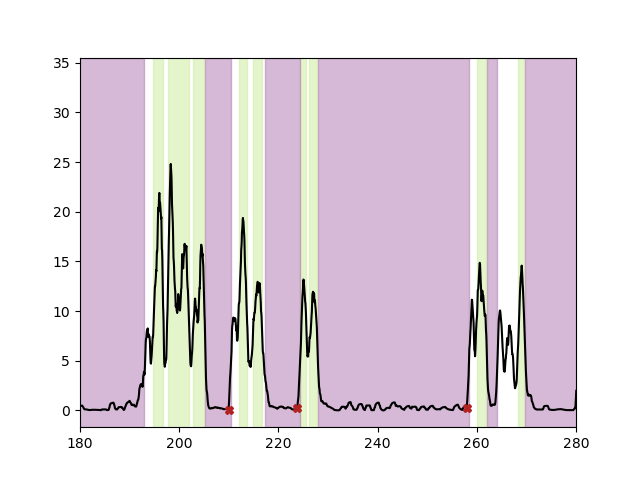

In [58]:
m = "1208"
sess = "1208_BaselineL"
data = getData(Files[1],['speed'],period ='Pre', mice=m, day = lambda x: x==0)
conds = ['high','low']
Color = CP('highLowSpeed')
segments = {'high':{'start':getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_StartSegments'),
                  'end':getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_EndSegments')},
            'low':{'start':getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_StartSegments'),
                  'end':getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_EndSegments')}}
sOnset =  getOnsetOrPeriod(m,sess,'Pre','mvmtOnset')
speed = data[sess]['speed']['speed'].T
fig, ax  = plt.subplots(1,1)
t = np.arange(0,len(speed))*0.05
ax.plot(t,smooth(speed,20),color='black')
for cond in conds:
    for l in range(0, len(segments[cond]['start'])):
        ax.axvspan(t[segments[cond]['start'][l]], t[segments[cond]['end'][l]], color= Color[cond], alpha=0.5)
ax.plot(t[sOnset],speed[sOnset],'X',color='firebrick')
ax.set_xlim(180,280)
fig.savefig(figFolder+'figure1_mvmtOnset.png')
fig.savefig(figFolder+'figure1_mvmtOnset.svg',transparent=True)

cleaning up trace data


<IPython.core.display.Javascript object>


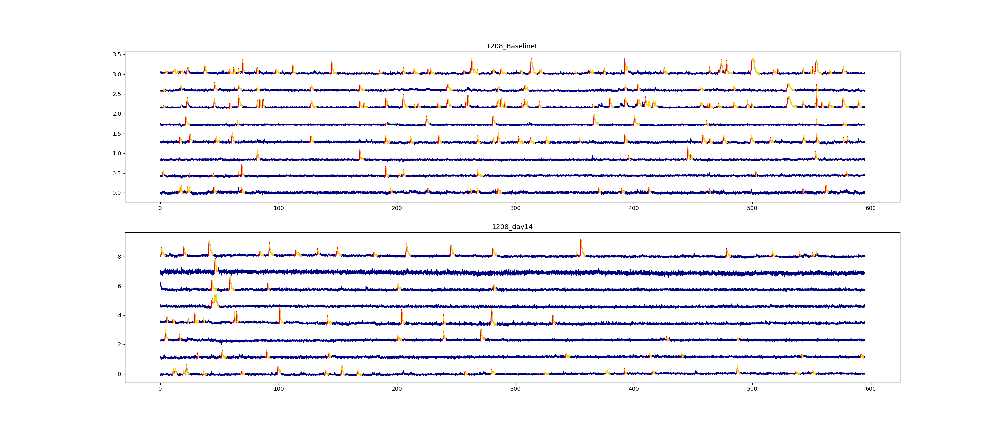

In [62]:
warnings.filterwarnings("ignore")

f = h5py.File('OnsetsAndPeriods.hdf5','r')
# align spectogram to spike onset -> for each mouse and in total,seperate by CRE:
sessList = {'1208_BaselineL':27,'1208_day14':8}
m = '1208'
data = getData(Files[1],['trace'],period ='Pre',day =lambda day: (day==14) or (day==0), mice = [m])

# constents for analysis:
tracePerSlide = 8
colors = {'TD':'black','TD_skip':'indianred','MSN':'navy','MSN_skip':'royalblue'}
lf = {'left':0.30, 'top':1.30, 'height':10.80, 'width':25.10}
fArgs = {'left':Inches(lf['left']),'top':Inches(lf['top']), 'height':Inches(lf['height']), 'width':Inches(lf['width'])}

fig, ax = plt.subplots(2,1,figsize=(lf['width'],lf['height']))
fig.set_size_inches(lf['width'],lf['height'],forward=True)

indX = 0
for sess in sessList.keys():
    # get traces:
    dff = data[sess]['trace']['dff']
    dt = 1/data[sess]['trace']['FS'][0]
    t = np.linspace(0,dt*dff.shape[1],dff.shape[1])
    Fs = data[sess]['trace']['FS'][0]
    # Vectors are saved as column vectors so.. transposed to raw vector
    if dff.shape[1] == 1:
        dff = dff.T
    # get CaOnset:
    caOnset = f[m][sess]['Pre']['caOnset_Hf'].value
    caFall =  f[m][sess]['Pre']['caFall_Hf'].value
    caOnset[caOnset==0] =np.nan
    caFall[caFall==0] =np.nan
    numred = int(data[sess]['trace']['numred'][0])

    tLim = int(600*Fs)
    N = sessList[sess]
    endN = np.min(((N+1)*tracePerSlide,dff.shape[0]))
    T=0;
    endT = np.min(((T+1)*tLim,dff.shape[1]))
    df = dff[N*tracePerSlide:endN,T*tLim:endT]
    ca = caOnset[N*tracePerSlide:endN,T*tLim:endT]
    ca = ca*df
    cf = caFall[N*tracePerSlide:endN,T*tLim:endT]
    cf = cf*df
    spacing = np.max(np.abs(df))
    Color = ['navy' for x in range(0,df.shape[0])]
    if tracePerSlide*N <numred:
        Nl = min(tracePerSlide,numred-N*tracePerSlide)
        Color[0:Nl] = [colors['TD'] for x in range(0,Nl)]
        Color[Nl:] = [colors['MSN'] for x in range(Nl,len(Color))]
    else:
        Color = [colors['MSN'] for x in range(0,len(Color))]
    for d in range(0,df.shape[0]):
        ax[indX].plot(t[T*tLim:endT],df[d,:]+d*spacing,color=Color[d]) 
        ax[indX].plot(t[T*tLim:endT],ca[d,:]+d*spacing,color='red')
        ax[indX].plot(t[T*tLim:endT],cf[d,:]+d*spacing,color='gold')
    ax[indX].set_title(sess)
    indX = indX+1
fig.savefig(figFolder+'figure1_binary'+'.png')
fig.savefig(figFolder+'figure1_binary'+'.svg',transparent=True)




<IPython.core.display.Javascript object>


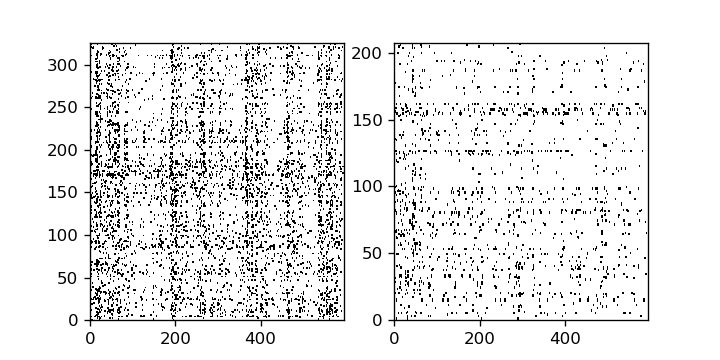

In [72]:
warnings.filterwarnings("ignore")

f = h5py.File('OnsetsAndPeriods.hdf5','r')
# align spectogram to spike onset -> for each mouse and in total,seperate by CRE:
sessList = {'1208_BaselineL':27,'1208_day14':8}
m = '1208'

fig, ax = plt.subplots(1,2,figsize=(6,3),sharex='col')
indX = 0
for sess in sessList.keys():
    # get traces:
    
    # get CaOnset:
    caOnset = f[m][sess]['Pre']['caOnset_Hf'].value
    caOnset[caOnset==0] = np.nan
    ts = np.arange(0, np.max(caOnset.shape[1])) * .05 
    ax[indX].pcolormesh(ts[:],np.arange(0,caOnset.shape[0]),caOnset[:,:],cmap=cm.gray,)
    indX =indX+1
    

fig.savefig(figFolder+'figure1_binaryRastor'+'.png')
fig.savefig(figFolder+'figure1_binaryRastor'+'.svg',transparent=True)




<h3> Figure 2 </h3>

<IPython.core.display.Javascript object>


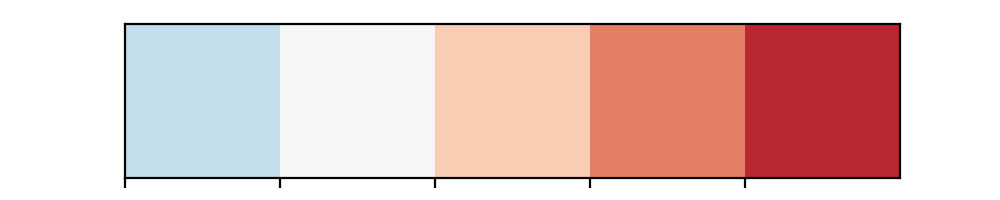

In [77]:
# set color pallet:
a3 = np.array(sns.color_palette("RdBu_r", n_colors=7))
colorPallet3 =(a3[2:,:])
sns.palplot(sns.color_palette(colorPallet3))

In [101]:
speedData = []

miceList = getMiceList(Files[1])
for m in miceList:
    data = getData(Files[1],['speed'],period ='Pre', mice=m)
    
    # calculte % high speed + % low speed
    for sess in data:
        # find the day of the session
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        
        row = {'Mouse':m,'Session':sess,'Day':day}
        Hp = getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')
        Lp = getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')
        comb = Hp*1+((Lp*1)-1)*-1
                
        row['percent_low'] = np.sum(Lp*1)/len(Lp)
        row['percent_high'] = np.sum(Hp*1)/len(Hp)
        row['percent_medium'] = np.sum(comb==1)/len(comb)
        
        trans = comb[1:]-comb[:-1]
        
        row['tran_all'] = np.sum(np.abs(trans!=0))
        row['tran_low2any'] = np.sum(np.abs(Lp[1:]*1-Lp[:-1]*1))
        row['tran_high2any'] = np.sum(np.abs(Hp[1:]*1-Hp[:-1]*1))
        
        row['MvmtOnset'] = np.sum(getOnsetOrPeriod(m,sess,'Pre','mvmtOnset'))        
        speedData.append(row)
          
df = pd.DataFrame(speedData)        
df['Period'] =  df.apply (lambda row: periodCalc(row.Day) , axis=1)

/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value


cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data


<IPython.core.display.Javascript object>


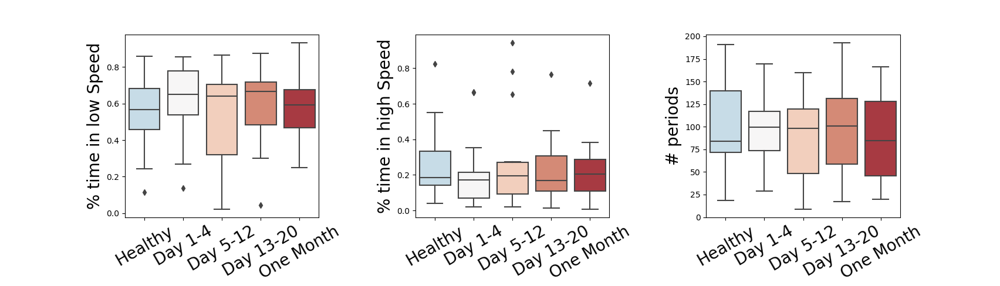

In [107]:
df2 = df.groupby(['Mouse','Period']).mean()
df2.reset_index(inplace=True)

fig, ax = plt.subplots(1,3,figsize=(17.04,4.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24})
pOrder = ['Healthy','Day 1-4','Day 5-12','Day 13-20','One Month']
with sns.color_palette(colorPallet3):#sns.color_palette("PuBuGn_d"):
    columns = ['percent_low','percent_high','tran_low2any'] 
    labels = ['% time in low Speed','% time in high Speed','# periods']
    for ind in range(len(columns)):
        sns.boxplot(x="Period", y=columns[ind], data=df2,ax =ax[ind],order = pOrder)
        #sns.scatterplot(x="Period", y=columns[ind], data=df2,ax =ax[ind])
        ax[ind].set_xticklabels(ax[ind].get_xticklabels(),rotation=30,fontsize=20)
        ax[ind].set_ylabel(labels[ind],fontsize=20)
        ax[ind].set_xlabel("")
        
        
fig.savefig(figFolder+'figure2_abc.png',transparent=False,format='png')
fig.savefig(figFolder+'figure2_abc.svg',transparent=True,format='svg')


<IPython.core.display.Javascript object>


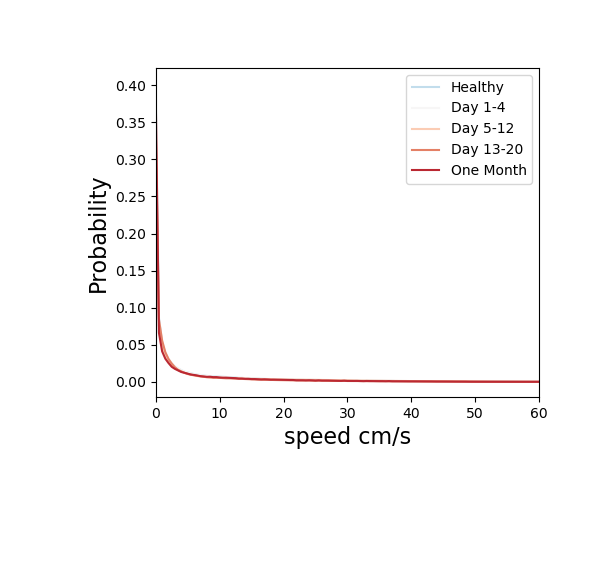

/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value


cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up

/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data


/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


In [41]:
periods = {'Healthy':lambda x: x==0,
           'Day 1-4':lambda x: x<5,
           'Day 5-12':lambda x: (x>4) & (x<13),
           'Day 13-20':lambda x: (x>12) & (x<21),
           'One Month':lambda x: x>21}

fig, ax = plt.subplots(1,1,figsize=(5.99,5.67),gridspec_kw = {'hspace':.1,'bottom':0.3,'left':.26})
for indP,p in enumerate(periods.keys()):
    #to make sure mice are equally represented in each period
    weightsH = np.zeros((199,))
    for m in miceList:
        dataH = getData(Files[1],['speed'],period ='Pre', day = periods[p],mice = m)
        speedM = np.empty((1,0))
        for sess in dataH:
            speedM = np.concatenate((speedM, dataH[sess]['speed']['speed']), axis=1)
        hist, bin_edges = np.histogram(speedM, bins=np.arange(0,200)*0.5)
        hist  = hist/np.nansum(hist) # normalize per mouse
        weightsH = np.nansum((weightsH, hist),axis=0)

    ax.plot(np.arange(0,199)*0.5,weightsH/16,label=p,color=a3[indP+2,:])    
ax.set_xlim(0,60)
ax.set_xlabel('speed cm/s',fontsize=16)
ax.set_ylabel('Probability',fontsize=16)
ax.legend(fontsize=10)
fig.savefig(figFolder+'figure2_d.png',transparent=False,format='png')
fig.savefig(figFolder+'figure2_d.svg',transparent=True,format='svg')

<IPython.core.display.Javascript object>


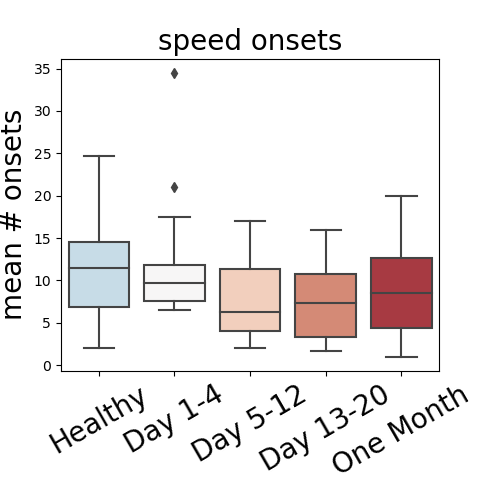

In [46]:
df2 = df.groupby(['Mouse','Period']).mean()
df2.reset_index(inplace=True)

fig, ax = plt.subplots(1,1,figsize=(4.88,4.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24})
pOrder = ['Healthy','Day 1-4','Day 5-12','Day 13-20','One Month']
with sns.color_palette(colorPallet3):#sns.color_palette("PuBuGn_d"):
    columns = ['MvmtOnset'] 
    labels = ['speed onsets']
    for ind in range(len(columns)):
        sns.boxplot(x="Period", y=columns[ind], data=df2,ax =ax,order = pOrder)
        #sns.scatterplot(x="Period", y=columns[ind], data=df2,ax =ax[ind])
        ax.set_xticklabels(ax.get_xticklabels(),rotation=30,fontsize=20)
        ax.set_ylabel("mean # onsets",fontsize=20)
        ax.set_xlabel("")
        ax.set_title(labels[ind],fontsize=20)
        
fig.savefig(figFolder+'figure2_e.png',transparent=False,format='png')
fig.savefig(figFolder+'figure2_e.svg',transparent=True,format='svg')


<h3> Figure 3 </h3>

In [ ]:
rotData = []

miceList = getMiceList(Files[1])
for m in miceList:
    data = getData(Files[1],['rot'],period ='Pre', mice=m)
    
    # calculte % high rot + % low rot
    for sess in data:
        # find the day of the session
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        
        row = {'Mouse':m,'Session':sess,'Day':day}
        hACp = getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')
        hCp = getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')
        Lp = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
        comb = hACp*8+Lp*5+hCp*7
                
        row['percent_low'] = np.sum(Lp*1)/len(Lp)
        row['percent_high_AC'] = np.sum(hACp*1)/len(hACp)
        row['percent_high_C'] = np.sum(hCp*1)/len(hCp)
        row['percent_non'] = np.sum(comb==0)/len(comb)
        
        trans = comb[1:]-comb[:-1]
        
        row['trans'] = np.sum(trans!=0)
        row['tran_low2high'] = np.sum(trans>0)
        row['tran_high2low'] = np.sum(trans<0)
        row['rotOnset'] = np.sum(getOnsetOrPeriod(m,sess,'Pre','rotOnset')) 
        row['cRotOnset'] = np.sum(getOnsetOrPeriod(m,sess,'Pre','clockWiseOnset'))
        row['acRotOnset'] = np.sum(getOnsetOrPeriod(m,sess,'Pre','antiClockWiseOnset'))
        
        rotData.append(row)
          
dfRot = pd.DataFrame(rotData)        
dfRot['Period'] =  dfRot.apply (lambda row: periodCalc(row.Day) , axis=1)

<IPython.core.display.Javascript object>


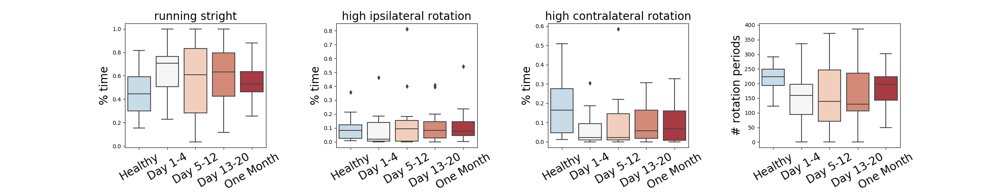

In [51]:
# repeat with paired t-test
# sns.set_style("white")
df2Rot = dfRot.groupby(['Mouse','Period']).mean()
df2Rot.reset_index(inplace=True)
df2Rot

fig, ax = plt.subplots(1,4,figsize=(25.04,4.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24})
pOrder = ['Healthy','Day 1-4','Day 5-12','Day 13-20','One Month']
with sns.color_palette(colorPallet3):#sns.color_palette("PuBuGn_d"):
    columns = ['percent_low','percent_high_AC','percent_high_C','trans'] 
    labels = ['running stright','high ipsilateral rotation',
              'high contralateral rotation','']
    Ylabels = ['% time','% time','% time','# rotation periods']
    for ind in range(len(columns)):
        sns.boxplot(x="Period", y=columns[ind], data=df2Rot,ax =ax[ind],order = pOrder)
        #sns.scatterplot(x="Period", y=columns[ind], data=df2Rot,ax =ax[ind])
        ax[ind].set_xticklabels(ax[ind].get_xticklabels(),rotation=30,fontsize=20)
        ax[ind].set_ylabel(Ylabels[ind],fontsize=20)
        ax[ind].set_xlabel("")  
        ax[ind].set_title(labels[ind],fontsize=20)      
        
fig.savefig(figFolder+'figure3_abcd.png',transparent=False,format='png')
fig.savefig(figFolder+'figure3_abcd.svg',transparent=True,format='svg')


<IPython.core.display.Javascript object>


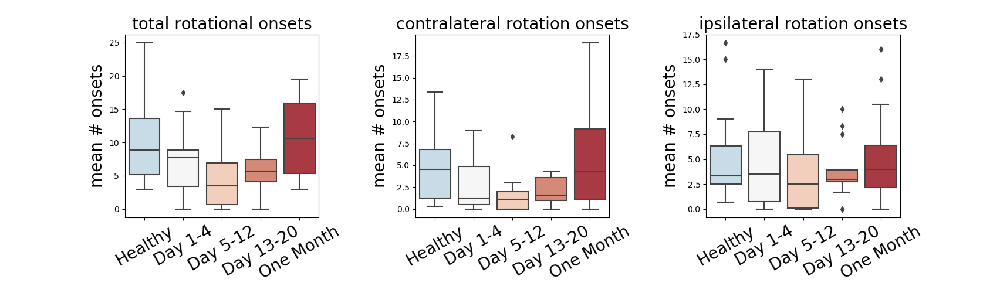

In [52]:
df2Rot = dfRot.groupby(['Mouse','Period']).mean()
df2Rot.reset_index(inplace=True)
df2Rot

fig, ax = plt.subplots(1,3,figsize=(17.04,4.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24})
pOrder = ['Healthy','Day 1-4','Day 5-12','Day 13-20','One Month']
with sns.color_palette(colorPallet3):#sns.color_palette("PuBuGn_d"):
    columns = ['rotOnset','cRotOnset','acRotOnset'] 
    labels = ['total rotational onsets','contralateral rotation onsets','ipsilateral rotation onsets']
    for ind in range(len(columns)):
        sns.boxplot(x="Period", y=columns[ind], data=df2Rot,ax =ax[ind],order = pOrder)
        #sns.scatterplot(x="Period", y=columns[ind], data=df2Rot,ax =ax[ind])
        ax[ind].set_xticklabels(ax[ind].get_xticklabels(),rotation=30,fontsize=20)
        ax[ind].set_ylabel("mean # onsets",fontsize=20)
        ax[ind].set_xlabel("")
        ax[ind].set_title(labels[ind],fontsize=20)

fig.savefig(figFolder+'figure3_efg.png',transparent=False,format='png')
fig.savefig(figFolder+'figure3_efg.svg',transparent=True,format='svg')


<h3> Figure 4 </h3>

In [ ]:
# data for all mice - homomorphic filter 
PVdata = getData(Files[1],['speed','trace'],period ='Pre', cre='PV',red = True)
MSNdata = getData(Files[1],['speed','trace'],period ='Pre',red = False)
CHIdata = getData(Files[1],['speed','trace'],period ='Pre', cre='CHI',red = True)


In [69]:
#f = h5py.File('OnsetsAndPeriods.hdf5','r')
col_names = ['Mouse','Sess','Day','highSpeed','medSpeed','lowSpeed','All_',
             'acc','dcc','rotAcc','rotDcc','highACrot','highCrot','lowRot']
dfC = pd.DataFrame(columns = col_names)
cond = ['PVdata','MSNdata','CHIdata']
transWindow = np.ones((10,1))
for c in cond:
    data = eval(c)
    for sess in data.keys():
#         try:
            if sess[5] == 'B':
                day = 0
            else:
                day = int(re.findall(r'\d+',sess[5:])[0])
            m = sess[0:4]

            Hp = getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')
            Lp = getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')
            Mp = ((Hp+Lp)==0)
            hACp = getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')
            hCp = getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')
            Lrp = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
            rotTrans = comb[1:]-comb[:-1]           
            
            Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')
            CaO = Ca[:,1:]-Ca[:,:-1]
            if CaO.shape[1]<Hp.shape[0]:
                 CaO = np.append(CaO,np.zeros((CaO.shape[0],1)),axis=1)
            C_start = (CaO==1)*1
            C_end = (CaO==-1)*1
            Acc = np.append(np.convolve(np.diff(Lp*1+Hp*2)>0, transWindow[:,0], mode='same')>0,False)
            Dcc = np.append(np.convolve(np.diff(Lp*1+Hp*2)<0, transWindow[:,0], mode='same')>0,False)
            rotAcc = np.append(np.convolve(rotTrans>0, transWindow[:,0], mode='same')>0,False)
            rotDcc = np.append(np.convolve(rotTrans<0, transWindow[:,0], mode='same')>0,False)
            if rotAcc.shape[0] >Acc.shape[0]:
                rotAcc = rotAcc[:Acc.shape[0]]
                rotDcc = rotDcc[:Acc.shape[0]]
                    

            
            a = np.asarray([np.sum(C_start[:,Hp],axis=1),np.sum(C_start[:,Mp],axis=1),
                            np.sum(C_start[:,Lp],axis=1),np.sum(C_start,axis=1),
                            np.sum(C_start[:,Acc],axis=1),np.sum(C_start[:,Dcc],axis=1),
                            np.sum(C_start[:,rotAcc],axis=1),np.sum(C_start[:,rotDcc],axis=1),
                            np.sum(C_start[:,hACp],axis=1),np.sum(C_start[:,hCp],axis=1),
                            np.sum(C_start[:,Lrp],axis=1)]).T
            
            df2C = pd.DataFrame(a, columns = col_names[3:])
            df2C['totalTime'] = (Hp.shape[0]/1200)
            df2C['lowTime'] = np.sum(Lp/1200)
            df2C['medTime'] = np.sum(Mp/1200)
            df2C['highTime'] = np.sum(Hp/1200)
            df2C['lowRotTime'] = np.sum(Lp/1200)
            df2C['highACRotTime'] = np.sum(hACp/1200)
            df2C['highCRotTime'] = np.sum(hCp/1200)
            df2C['totTrans'] = np.sum(rotTrans!=0)
            df2C['rotAccTrans'] = np.sum(rotTrans>0)
            df2C['rotDccTrans'] = np.sum(rotTrans<0)
            df2C['accTrans'] = np.sum(np.diff(Lp*1+Hp*2)>0)
            df2C['dccTrans'] = np.sum(np.diff(Lp*1+Hp*2)<0)
            df2C['Day'] = day
            df2C['Mouse'] = m
            df2C['Sess'] = sess
            df2C['CellType'] = c[:-4]
            df2C['Period'] = periodCalc(day)
            df2C['Beta']  = m in betaMice
            dfC = pd.concat([dfC,df2C],sort=True)
#         except:
#             print(sess)


dfC['high_speed'] =  dfC.apply (lambda row: row.highSpeed/row.highTime if row.highTime != 0 else 0, axis=1)
dfC['medium_speed'] = dfC.apply (lambda row: row.medSpeed/row.medTime, axis=1)
dfC['low_speed'] = dfC.apply (lambda row: row.lowSpeed/row.lowTime , axis=1)
dfC['high_ACrot'] =  dfC.apply (lambda row: row.highACrot/row.highACRotTime if row.highACRotTime != 0 else 0, axis=1)
dfC['high_Crot'] = dfC.apply (lambda row: row.highCrot/row.highCRotTime if row.highCRotTime != 0 else 0, axis=1)
dfC['low_rot'] = dfC.apply (lambda row: row.lowRot/row.lowRotTime if row.lowRotTime != 0 else 0, axis=1)
dfC['All'] = dfC.apply (lambda row: row.All_/row.totalTime , axis=1)
dfC['Acc'] = dfC.apply (lambda row: row.acc/row.accTrans , axis=1)
dfC['Dcc'] = dfC.apply (lambda row: row.dcc/row.dccTrans , axis=1)
dfC['Acc_'] = dfC.apply (lambda row: row.acc/row.All_ if row.All_ >0 else 0 , axis=1)
dfC['Dcc_'] = dfC.apply (lambda row: row.dcc/row.All_ if row.All_ >0 else 0 , axis=1)
dfC['rotAcc'] = dfC.apply (lambda row: row.rotAcc/row.rotAccTrans , axis=1)
dfC['rotDcc'] = dfC.apply (lambda row: row.rotDcc/row.rotDccTrans , axis=1)
dfC['rotAcc_'] = dfC.apply (lambda row: row.rotAcc/row.All_ if row.All_ >0 else 0 , axis=1)
dfC['rotDcc_'] = dfC.apply (lambda row: row.rotDcc/row.All_ if row.All_ >0 else 0 , axis=1)


dfC['totAcc_'] = dfC.apply (lambda row: (row.dcc+row.acc)/row.All_ if row.All_ >0 else 0 , axis=1)
dfC['totRotAcc_'] = dfC.apply (lambda row: (row.rotDcc+row.rotAcc)/row.All_ if row.All_ >0 else 0 , axis=1)


dfC.head()


dfC.to_csv('firingRateDf.csv')

/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value


<IPython.core.display.Javascript object>


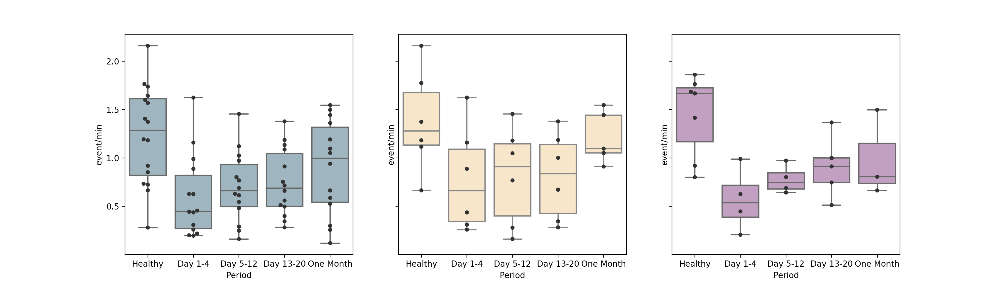

In [92]:
dfC = pd.read_csv('firingRateDf.csv')
#print(dfC.columns)
dfM = dfC[(dfC.All>0)][['Mouse','Period','CellType','All']]
#dfM = dfM.merge(dfM.Dcc_.apply(lambda s: pd.Series({'All':s<0.05, 'Dcc_1':(s>=0.05)&(s<0.4),'Dcc_3':s>=0.9, 'Dcc_2':(s>=0.4)&(s<0.9)})), 
#    left_index=True, right_index=True)
dfM2 = dfM.groupby(['Mouse','Period','CellType'],as_index=False).mean()
df_long = pd.melt(dfM2,id_vars=['CellType','Period'], value_vars=['All'],value_name='event/min')
fig, ax = plt.subplots(1,3,figsize=(17.04,4.88),sharey=True)
ind = 0
colors = ['#99B7C5','#FFE7C4','#C69AC8']
cells = ['MSN','PV','CHI']
for cell in cells:
    g = sns.swarmplot(x="Period", y="event/min",data=df_long[(df_long.CellType == cell)],color = [.2,.2,.2],dodge = True,
                      order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'],
                      ax=ax[ind],**{'label':'_nolegend_'})
    g = sns.boxplot(x="Period", y="event/min",data=df_long[(df_long.CellType == cell)], dodge = True,
                    order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'],
                    color=colors[ind],ax=ax[ind])
    ind = ind +1
fig.savefig(figFolder+'figure4_a.png',transparent=False,format='png')
fig.savefig(figFolder+'figure4_a.svg',transparent=True,format='svg')


In [100]:
dfC[(dfC.All>0)][['Mouse','Period','CellType','All']].groupby(['Mouse','Period','CellType']).mean().groupby(['Period','CellType']).mean()

All
Period    CellType          
Day 1-4   CHI       0.568144
          MSN       0.603278
          PV        0.780156
Day 13-20 CHI       0.908046
          MSN       0.745253
          PV        0.811375
Day 5-12  CHI       0.777432
          MSN       0.701009
          PV        0.815989
Healthy   CHI       1.444882
          MSN       1.238230
          PV        1.378922
One Month CHI       0.989885
          MSN       0.899371
          PV        1.210280

<IPython.core.display.Javascript object>


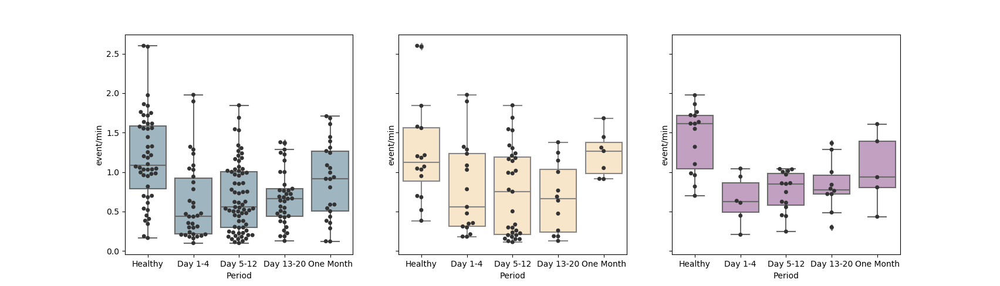

In [71]:
# same plot, but by session... (Sense check)
dfM = dfC[(dfC.All>0)][['Sess','Period','CellType','All']]
#dfM = dfM.merge(dfM.Dcc_.apply(lambda s: pd.Series({'All':s<0.05, 'Dcc_1':(s>=0.05)&(s<0.4),'Dcc_3':s>=0.9, 'Dcc_2':(s>=0.4)&(s<0.9)})), 
#    left_index=True, right_index=True)
dfM2 = dfM.groupby(['Sess','Period','CellType'],as_index=False).mean()
df_long = pd.melt(dfM2,id_vars=['CellType','Period'], value_vars=['All'],value_name='event/min')
fig, ax = plt.subplots(1,3,figsize=(17.04,4.88),sharey=True)
ind = 0
colors = ['#99B7C5','#FFE7C4','#C69AC8']
cells = ['MSN','PV','CHI']
for cell in cells:
    g = sns.swarmplot(x="Period", y="event/min",data=df_long[(df_long.CellType == cell)],color = [.2,.2,.2],dodge = True,
                      order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'],
                      ax=ax[ind],**{'label':'_nolegend_'})
    g = sns.boxplot(x="Period", y="event/min",data=df_long[(df_long.CellType == cell)], dodge = True,
                    order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'],
                    color=colors[ind],ax=ax[ind])
    ind = ind +1

<IPython.core.display.Javascript object>


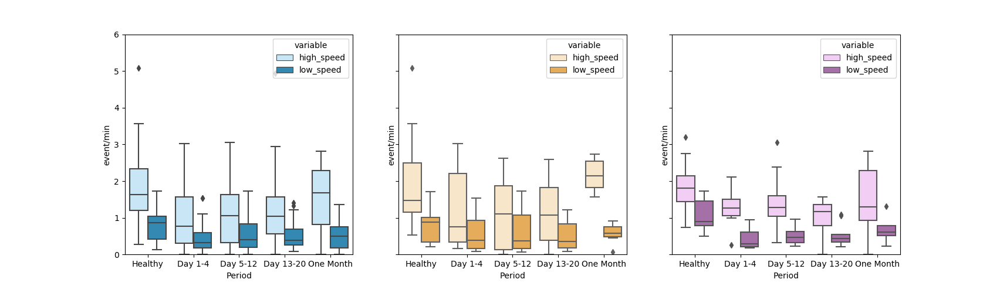

In [79]:
#print(dfC.columns)
# for each cell, high and low speed on same plot - Average per session

dfM = dfC[(dfC.All>0)][['Sess','Period','CellType','high_speed',
                        'low_speed', 'high_ACrot', 'high_Crot','low_rot']]
dfM2 = dfM.groupby(['Sess','Period','CellType'],as_index=False).mean()

columns = ['high_speed', 'low_speed']#, 'high_ACrot', 'high_Crot','low_rot'] 
df_long = pd.melt(dfM2,id_vars=['CellType','Period','Sess'], value_vars=columns,value_name='event/min')
fig, ax = plt.subplots(1,3,figsize=(17.04,4.88),sharey=True)
indC = 0
colors = {'MSN':['#c0e9fc','#1e91c7'], 'PV':['#FFE7C4','#fcb144'],'CHI':['#f8c8fa','#ad66b0']} #'#99B7C5','#FFE7C4','#C69AC8']
cells = ['MSN','PV','CHI']
for cell in cells:
#     g = sns.swarmplot(x="Period", y="event/min",hue ='variable' ,data=df_long[(df_long.CellType == cell)],color = [.2,.2,.2],dodge = True,
#                       order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'], 
#                       ax=ax[indC],**{'label':'_nolegend_','alpha':0.5,'s':3})
    g = sns.boxplot(x="Period",hue ='variable', y="event/min",data=df_long[(df_long.CellType == cell)], dodge = True,
                   order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'],
                   palette=colors[cell],ax=ax[indC])

    ax[indC].set_ylim(0,6)
    indC = indC +1
fig.savefig(figFolder+'figure4_b.png',transparent=False,format='png')
fig.savefig(figFolder+'figure4_b.svg',transparent=True,format='svg')


<IPython.core.display.Javascript object>


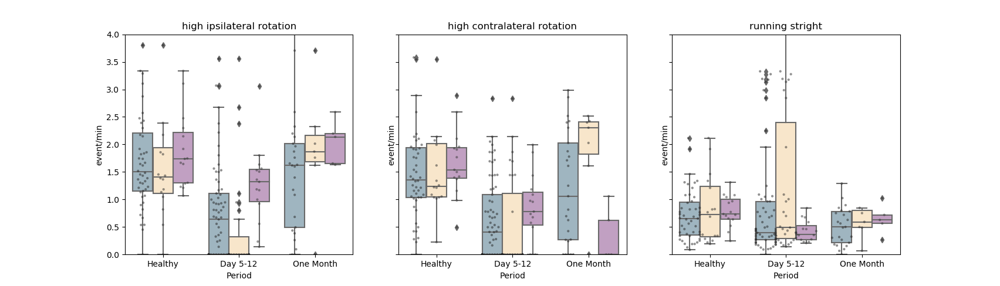

In [85]:
#contralateral '
# for each cell, high and low Rot on same plot - Average per sess

dfM = dfC[(dfC.All>0)][['Sess','Period','CellType','high_ACrot', 'high_Crot','low_rot']]
dfM2 = dfM.groupby(['Sess','Period','CellType'],as_index=False).mean()

columns = ['high_ACrot', 'high_Crot','low_rot']#, 'high_ACrot', 'high_Crot','low_rot'] 
labels = ['high ipsilateral rotation', 'high contralateral rotation','running stright']
df_long = pd.melt(dfM2,id_vars=['CellType','Period','Sess'], value_vars=columns,value_name='event/min')
fig, ax = plt.subplots(1,3,figsize=(17.04,4.88),sharey=True)

colors = ['#99B7C5','#FFE7C4','#C69AC8']
cells = ['MSN','PV','CHI']
for col in range(0,len(columns)):
    colors = ['#99B7C5','#FFE7C4','#C69AC8']
    df_long = pd.melt(dfM2,id_vars=['CellType','Period','Sess'], value_vars=columns[col],value_name='event/min')
    g = sns.swarmplot(x="Period",hue = 'CellType', y="event/min",data=df_long,color = [.2,.2,.2],dodge = True,
                      order = ['Healthy',  'Day 5-12',  'One Month'], hue_order = cells,
                      ax=ax[col],**{'label':'_nolegend_','alpha':0.5,'s':3})
    g = sns.boxplot(x="Period", hue = 'CellType',y="event/min",data=df_long, dodge = True,
                    order = ['Healthy',  'Day 5-12',  'One Month'],hue_order = cells,
                    palette=colors,ax=ax[col])
    if col==2:
        ax[col].set_ylim([0,4])
    ax[col].set_title(labels[col])
    g.legend_.remove()

fig.savefig(figFolder+'figure4_c.png',transparent=False,format='png')
fig.savefig(figFolder+'figure4_c.svg',transparent=True,format='svg')
    
    

<IPython.core.display.Javascript object>


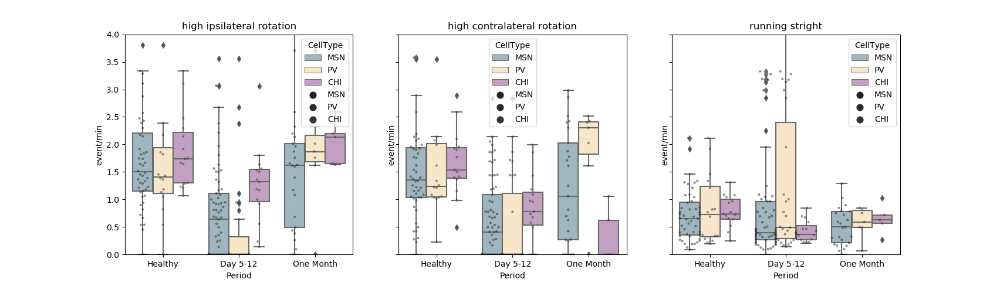

In [86]:
# Same exact plot as a bove with legend -> so can kkep one copy for menuscript
# for each cell, high and low Rot on same plot - Average per sess

dfM = dfC[(dfC.All>0)][['Sess','Period','CellType','high_ACrot', 'high_Crot','low_rot']]
dfM2 = dfM.groupby(['Sess','Period','CellType'],as_index=False).mean()

columns = ['high_ACrot', 'high_Crot','low_rot']#, 'high_ACrot', 'high_Crot','low_rot'] 
labels = ['high ipsilateral rotation', 'high contralateral rotation','running stright']
df_long = pd.melt(dfM2,id_vars=['CellType','Period','Sess'], value_vars=columns,value_name='event/min')
fig, ax = plt.subplots(1,3,figsize=(17.04,4.88),sharey=True)

colors = ['#99B7C5','#FFE7C4','#C69AC8']
cells = ['MSN','PV','CHI']
for col in range(0,len(columns)):
    colors = ['#99B7C5','#FFE7C4','#C69AC8']
    df_long = pd.melt(dfM2,id_vars=['CellType','Period','Sess'], value_vars=columns[col],value_name='event/min')
    g = sns.swarmplot(x="Period",hue = 'CellType', y="event/min",data=df_long,color = [.2,.2,.2],dodge = True,
                      order = ['Healthy',  'Day 5-12',  'One Month'], hue_order = cells,
                      ax=ax[col],**{'label':'_nolegend_','alpha':0.5,'s':3})
    g = sns.boxplot(x="Period", hue = 'CellType',y="event/min",data=df_long, dodge = True,
                    order = ['Healthy',  'Day 5-12',  'One Month'],hue_order = cells,
                    palette=colors,ax=ax[col])
    if col==2:
        ax[col].set_ylim([0,4])
    ax[col].set_title(labels[col])
fig.savefig(figFolder+'figure4_cLegend.png',transparent=False,format='png')
fig.savefig(figFolder+'figure4_cLegend.svg',transparent=True,format='svg')
    
    

<h3> Figure 5 </h3>

In [140]:
df =  pd.read_hdf('corrsAndShuffles.h5','df')
df_creOn = pd.read_hdf('corrsAndShuffles','df_creOn')
df_creOff = pd.read_hdf('corrsAndShuffles','df_creOff')

df['Period'] = df.apply(lambda row: periodCalc(row.Day), axis=1)
df['cre'] = df.apply(lambda row: getCreType(Files[1],row.Mouse), axis=1)
df_creOn['cre'] = df_creOn.apply(lambda row: getCreType(Files[1],row.Mouse), axis=1)
df_creOn['Period'] = df_creOn.apply(lambda row: periodCalc(row.Day), axis=1)

# intialize the data sets
df_MSN_MSN = df[['Mouse','Sess','Day','Period','numred','cre']]
df_MSN_CRE = df[['Mouse','Sess','Day','Period','numred','cre']]
df_CRE_CRE = df[['Mouse','Sess','Day','Period','numred','cre']]


In [141]:
# calc mean and std for each shuffle:
df_MSN_MSN = df_MSN_MSN.merge(df.apply(lambda row: pd.Series({'sAll':np.nanmean(row['s_MSN-MSN']),
                                                              'sAll_std':np.nanstd(row['s_MSN-MSN']),
                                                              'All':row['MSN-MSN'],
                                                              'Sess':row.Sess}),axis=1),
                              left_on='Sess', right_on='Sess')
df_MSN_CRE = df_MSN_CRE.merge(df[(df.cre!='NA')].apply(lambda row: pd.Series({'sAll':np.nanmean(row['s_'+'MSN-'+row.cre]),
                                                              'sAll_std':np.nanstd(row['s_'+'MSN-'+row.cre]),
                                                              'All':row['MSN-'+row.cre],
                                                              'Sess':row.Sess}),axis=1),
                              left_on='Sess', right_on='Sess')

df_CRE_CRE = df_CRE_CRE.merge(df[(df.cre!='NA')].apply(lambda row: pd.Series({'sAll':np.nanmean(row['s_'+row.cre+'-'+row.cre]),
                                                              'sAll_std':np.nanstd(row['s_'+row.cre+'-'+row.cre]),
                                                              'All':row[row.cre+'-'+row.cre],
                                                              'Sess':row.Sess}) ,axis=1),
                              left_on='Sess', right_on='Sess')

df_MSN_MSN = df_MSN_MSN.merge(df_creOn.apply(lambda row: pd.Series({'sOn':np.nanmean(row['s_MSN-MSN']),
                                                              'sOn_std':np.nanstd(row['s_MSN-MSN']),
                                                              'On':row['MSN-MSN'],
                                                              'Sess':row.Sess}),axis=1),
                              left_on='Sess', right_on='Sess')
df_MSN_CRE = df_MSN_CRE.merge(df_creOn[(df_creOn.cre!='NA')].apply(lambda row: pd.Series({'sOn':np.nanmean(row['s_'+'MSN-'+row.cre]),
                                                              'sOn_std':np.nanstd(row['s_'+'MSN-'+row.cre]),
                                                              'On':row['MSN-'+row.cre],
                                                              'Sess':row.Sess}),axis=1),
                              left_on='Sess', right_on='Sess')

df_CRE_CRE = df_CRE_CRE.merge(df_creOn[(df_creOn.cre!='NA')].apply(lambda row: pd.Series({'sOn':np.nanmean(row['s_'+row.cre+'-'+row.cre]),
                                                              'sOn_std':np.nanstd(row['s_'+row.cre+'-'+row.cre]),
                                                              'On':row[row.cre+'-'+row.cre],
                                                              'Sess':row.Sess}) ,axis=1),
                              left_on='Sess', right_on='Sess')

df_MSN_MSN = df_MSN_MSN.merge(df_creOff.apply(lambda row: pd.Series({'sOff':np.nanmean(row['s_MSN-MSN']),
                                                              'sOff_std':np.nanstd(row['s_MSN-MSN']),
                                                              'Off':row['MSN-MSN'],
                                                              'Sess':row.Sess}),axis=1),
                              left_on='Sess', right_on='Sess')


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: Mean of empty slice
  del sys.path[0]
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: RuntimeWarning: Mean of empty slice


In [142]:
MSN_melt = df_MSN_MSN.melt(id_vars=['Period','Mouse','cre'], value_vars=['All','sAll'],#,'On','sOn','Off','sOff'],
                           var_name='varType', value_name='Corr')
MSN_melt['Population'] = 'MSN-MSN'
MSNc_melt = df_MSN_CRE.melt(id_vars=['Period','Mouse','cre'], value_vars=['All','sAll'],#,'On','sOn'],
                           var_name='varType', value_name='Corr')
MSNc_melt['Population'] = 'MSN-CRE'
Cre_melt = df_CRE_CRE.melt(id_vars=['Period','Mouse','cre'], value_vars=['All','sAll'],#,'On','sOn'],
                           var_name='varType', value_name='Corr')
Cre_melt ['Population'] = 'CRE-CRE'

df_melt = MSN_melt.append([MSNc_melt,Cre_melt])
df2 = df_melt.groupby(['Period','Mouse','cre','Population','varType']).mean()
df2.reset_index(inplace=True)

g = sns.boxplot(x="Period", y="Corr", hue="varType", data=df2[(df2.Population=='MSN-MSN')], order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])

#plt.savefig(figFolder+'figure5_a.png',transparent=False,format='png')
#plt.savefig(figFolder+'figure5_a.svg',transparent=True,format='svg')


In [17]:
# Recalculate the LFP align to MSN onset - take a few days to run. 
#     Only run if didn't do that before already (+ one extra time before publishing paper)
#     Comment line 27-29 to recalculate sessions that were already done
warnings.filterwarnings("ignore")

# open all necassary files 
f = h5py.File('Spectograms.hdf5','r') #LFP coeffs
savePath = '/home/dana_z/HD1/lfp2ca_notNormalize/'

df = pd.DataFrame(columns=['mouse','sess','day','period','cre','numred'])
# constents for analysis:
WinPre = 2 #s
WinPost = 2 #s

# for each mouse: 
for m in miceList:
    data =  getData(Files[1],['lfp','trace'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])

        numRed = int(data[sess]['trace']['numred'])


        if os.path.exists(savePath+'MSN/'+sess):
            df.append({'mouse':m,'sess':sess,'day':day,'period': periodCalc(day),'cre':cre,'numred':numRed},ignore_index=True)
            continue

        # get data
        Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')
        dCa = np.append(Ca[:,1:]-Ca[:,:-1],np.zeros((Ca.shape[0],1)),axis=1)
        dCa[dCa==-1] = 0
        
        coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        try:
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff= coeff.T
            #coeff = coeff.T/np.nansum(coeff,axis=1) # So that axis[0] is the time axis + normalize power in frequency per sesion
        except:
            print(sess)
            continue
        
        # add session to df, so can be retrived
        df= df.append({'mouse':m,'sess':sess,'day':day,'period': periodCalc(day),'cre':cre,'numred':numRed,'numMsn':Ca.shape[0]},ignore_index=True)

        dtS = float(1/data[sess]['trace']['FS'])
        dtL = float(1/data[sess]['lfp']['FS'])
        ts = np.arange(0, np.max(data[sess]['trace']['dff'].shape)) * dtS 
        tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL

        tPlot = np.linspace(-WinPre,WinPost,int((WinPre+WinPost)/dtL))     
        

        # for every Cre neuron:
        dca = dCa[0:numRed,:]
        dca = dca[np.sum(dca,axis=1)!=0,:]
        
        for creN in range(0,np.min(dca.shape)):
            onsetL = np.full_like(tl,False)
            cN = dca[creN,:]
            for si in ts[cN.astype(bool)]:
                ti = np.argmin(np.abs(tl-si))
                onsetL[ti] = True
            al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

            if al.ndim <3:
                try:
                    al = np.reshape(al,(al.shape[0],al.shape[1],1))
                except:
                    print('no onset, when there should be. CRE#',creN,' in sess= ',sess)
                    continue
            al = np.nanmean(al,axis=2,keepdims=True)
            al = np.nan_to_num(al,nan=-9999)
            
            if 'aligned' in locals():
                aligned = np.concatenate((aligned,al), axis = 2)
            else:
                aligned = al
        
        if np.min(dca.shape)>0:
            pickle.dump( aligned, open( savePath+"CRE/"+sess, "wb" ), protocol=4 )
            del aligned
        
        # for every MSN neuron:
        dca = dCa[numRed:,:]
        dca = dca[np.sum(dca,axis=1)!=0,:]
        
        for msnN in range(0,np.min(dca.shape)):
            onsetL = np.full_like(tl,False)
            mN = dca[msnN,:]
            for si in ts[mN.astype(bool)]:
                ti = np.argmin(np.abs(tl-si))
                onsetL[ti] = True
            al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

            if al.ndim <3:
                try:
                    al = np.reshape(al,(al.shape[0],al.shape[1],1))
                except:
                    print('no onset, when there should be. MSN#',msnN,' in sess= ',sess)
                    continue
            
            al = np.nanmean(al,axis=2,keepdims=True)
            al = np.nan_to_num(al,nan=-9999)
            if 'aligned' in locals():
                aligned = np.concatenate((aligned,al), axis = 2)
            else:
                aligned = al
        
        if np.min(dca.shape)>0:
            pickle.dump( aligned, open( savePath+"MSN/"+sess, "wb" ) , protocol=4)
            del aligned

df.to_csv(savePath+'sessions')


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
I deleted session: 1208_day12


 46%|████▌     | 6/13 [11:25<11:08, 95.56s/it] 

found  17.0  outlier points


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
found  1.0  outlier points


 64%|██████▍   | 9/14 [04:47<02:28, 29.63s/it]

found  888231.0  outlier points


 71%|███████▏  | 10/14 [06:29<03:26, 51.54s/it]

found  481139.0  outlier points


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
I deleted session: 2976_day4
found  1.0  outlier points


 92%|█████████▏| 12/13 [03:03<00:13, 13.60s/it]

found  3.0  outlier points


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


 43%|████▎     | 6/14 [04:24<05:27, 40.91s/it]

found  50.0  outlier points


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


 21%|██        | 4/19 [09:47<30:39, 122.62s/it]

found  29.0  outlier points


  0%|          | 0/17 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


 93%|█████████▎| 13/14 [11:26<00:32, 32.02s/it]

8803_day6


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


 93%|█████████▎| 13/14 [04:16<00:14, 14.23s/it]

8815_day6


100%|██████████| 14/14 [04:49<00:00, 20.69s/it]


In [25]:
# Recalculate the LFP align to MSN onset - take a few days to run. 
#     Only run if didn't do that before already (+ one extra time before publishing paper)
#     Comment line 27-29 to recalculate sessions that were already done
warnings.filterwarnings("ignore")

# open all necassary files 
f = h5py.File('Spectograms.hdf5','r') #LFP coeffs
savePath = '/home/dana_z/HD1/lfp2speed2/'

df = pd.DataFrame(columns=['mouse','sess','day','period','cre','numred'])
# constents for analysis:
WinPre = 2 #s
WinPost = 2 #s

# for each mouse: 
for m in miceList:
    data =  getData(Files[1],['lfp','speed'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])


        # get data
        sOnset = getOnsetOrPeriod(m,sess,'Pre','mvmtOnset2')
        
        if np.sum(sOnset)==0:
            continue

        coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        try:
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff= coeff.T
            #coeff = coeff.T/np.nansum(coeff,axis=1) # So that axis[0] is the time axis + normalize power in frequency per sesion
        except:
            print(sess)
            continue
        

        dtS = float(1/data[sess]['speed']['Fs'])
        dtL = float(1/data[sess]['lfp']['FS'])
        ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
        tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL

        tPlot = np.linspace(-WinPre,WinPost,int((WinPre+WinPost)/dtL))     
        
        # for every speed onset:
        
        onsetL = np.full_like(tl,False)
        for si in ts[sOnset.astype(bool)]:
            ti = np.argmin(np.abs(tl-si))
            onsetL[ti] = True
        al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

        if al.ndim <3:
            try:
                al = np.reshape(al,(al.shape[0],al.shape[1],1))
            except:
                print('no onset, when there should be. in sess= ',sess)
                continue

        #al = np.nanmean(al,axis=2,keepdims=True)
        al = np.nan_to_num(al,nan=-9999)
        if 'aligned' in locals():
            aligned = np.concatenate((aligned,al), axis = 2)
        else:
            aligned = al

        if np.sum(sOnset)>0:
            pickle.dump( aligned, open( savePath+sess, "wb" ) , protocol=4)
            del aligned
         
        # add session to df, so can be retrived
        df= df.append({'mouse':m,'sess':sess,'day':day,'period': periodCalc(day),'cre':cre},ignore_index=True)

df.to_csv(savePath+'sessions')


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
I deleted session: 1208_day12
cleaning up speed data


 46%|████▌     | 6/13 [00:17<00:24,  3.47s/it]

found  17.0  outlier points


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data
found  1.0  outlier points


 64%|██████▍   | 9/14 [00:55<00:31,  6.31s/it]

found  888231.0  outlier points


 71%|███████▏  | 10/14 [01:01<00:24,  6.25s/it]

found  481139.0  outlier points


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
I deleted session: 2976_day4
cleaning up speed data
found  1.0  outlier points


 92%|█████████▏| 12/13 [01:09<00:05,  5.93s/it]

found  3.0  outlier points


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 43%|████▎     | 6/14 [00:33<00:45,  5.64s/it]

found  50.0  outlier points


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 26%|██▋       | 5/19 [00:27<01:18,  5.59s/it]

found  29.0  outlier points


  0%|          | 0/17 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 93%|█████████▎| 13/14 [01:08<00:05,  5.70s/it]

8803_day6


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 93%|█████████▎| 13/14 [01:13<00:05,  5.53s/it]

8815_day6


100%|██████████| 14/14 [01:19<00:00,  5.66s/it]


In [71]:
# Recalculate the LFP align to MSN onset - take a few days to run. 
#     Only run if didn't do that before already (+ one extra time before publishing paper)
#     Comment line 27-29 to recalculate sessions that were already done
warnings.filterwarnings("ignore")

# open all necassary files 
f = h5py.File('Spectograms.hdf5','r') #LFP coeffs
savePath = '/home/dana_z/HD1/lfp2ACrot/'

df = pd.DataFrame(columns=['mouse','sess','day','period','cre','numred'])
# constents for analysis:
WinPre = 2 #s
WinPost = 2 #s

# for each mouse: 
for m in miceList:
    data =  getData(Files[1],['lfp','speed'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])


        # get data
        sOnset = getOnsetOrPeriod(m,sess,'Pre','antiClockWiseOnset')
        
        if np.sum(sOnset)==0:
            continue

        coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        try:
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff= coeff.T
            #coeff = coeff.T/np.nansum(coeff,axis=1) # So that axis[0] is the time axis + normalize power in frequency per sesion
        except:
            print(sess)
            continue
        

        dtS = float(1/data[sess]['speed']['Fs'])
        dtL = float(1/data[sess]['lfp']['FS'])
        ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
        tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL

        tPlot = np.linspace(-WinPre,WinPost,int((WinPre+WinPost)/dtL))     
        
        # for every speed onset:
        
        onsetL = np.full_like(tl,False)
        for si in ts[sOnset.astype(bool)]:
            ti = np.argmin(np.abs(tl-si))
            onsetL[ti] = True
        al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

        if al.ndim <3:
            try:
                al = np.reshape(al,(al.shape[0],al.shape[1],1))
            except:
                print('no onset, when there should be. in sess= ',sess)
                continue

        #al = np.nanmean(al,axis=2,keepdims=True)
        al = np.nan_to_num(al,nan=-9999)
        if 'aligned' in locals():
            aligned = np.concatenate((aligned,al), axis = 2)
        else:
            aligned = al

        if np.sum(sOnset)>0:
            pickle.dump( aligned, open( savePath+sess, "wb" ) , protocol=4)
            del aligned
         
        # add session to df, so can be retrived
        df= df.append({'mouse':m,'sess':sess,'day':day,'period': periodCalc(day),'cre':cre},ignore_index=True)

df.to_csv(savePath+'sessions')


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
I deleted session: 1208_day12
cleaning up speed data


 46%|████▌     | 6/13 [00:35<00:41,  5.97s/it]

found  17.0  outlier points


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data
found  1.0  outlier points


 64%|██████▍   | 9/14 [00:54<00:30,  6.07s/it]

found  888231.0  outlier points


 71%|███████▏  | 10/14 [01:00<00:24,  6.15s/it]

found  481139.0  outlier points


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
I deleted session: 2976_day4
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 50%|█████     | 7/14 [00:28<00:34,  4.86s/it]

found  50.0  outlier points


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/17 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 93%|█████████▎| 13/14 [01:14<00:05,  5.62s/it]

8815_day6


100%|██████████| 14/14 [01:20<00:00,  5.77s/it]


In [72]:
# Recalculate the LFP align to MSN onset - take a few days to run. 
#     Only run if didn't do that before already (+ one extra time before publishing paper)
#     Comment line 27-29 to recalculate sessions that were already done
warnings.filterwarnings("ignore")

# open all necassary files 
f = h5py.File('Spectograms.hdf5','r') #LFP coeffs
savePath = '/home/dana_z/HD1/lfp2Crot/'

df = pd.DataFrame(columns=['mouse','sess','day','period','cre','numred'])
# constents for analysis:
WinPre = 2 #s
WinPost = 2 #s

# for each mouse: 
for m in miceList:
    data =  getData(Files[1],['lfp','speed'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])


        # get data
        sOnset = getOnsetOrPeriod(m,sess,'Pre','clockWiseOnset')
        
        if np.sum(sOnset)==0:
            continue

        coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        try:
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff= coeff.T
            #coeff = coeff.T/np.nansum(coeff,axis=1) # So that axis[0] is the time axis + normalize power in frequency per sesion
        except:
            print(sess)
            continue
        

        dtS = float(1/data[sess]['speed']['Fs'])
        dtL = float(1/data[sess]['lfp']['FS'])
        ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
        tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL

        tPlot = np.linspace(-WinPre,WinPost,int((WinPre+WinPost)/dtL))     
        
        # for every speed onset:
        
        onsetL = np.full_like(tl,False)
        for si in ts[sOnset.astype(bool)]:
            ti = np.argmin(np.abs(tl-si))
            onsetL[ti] = True
        al = alignToOnset(coeff,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

        if al.ndim <3:
            try:
                al = np.reshape(al,(al.shape[0],al.shape[1],1))
            except:
                print('no onset, when there should be. in sess= ',sess)
                continue

        #al = np.nanmean(al,axis=2,keepdims=True)
        al = np.nan_to_num(al,nan=-9999)
        if 'aligned' in locals():
            aligned = np.concatenate((aligned,al), axis = 2)
        else:
            aligned = al

        if np.sum(sOnset)>0:
            pickle.dump( aligned, open( savePath+sess, "wb" ) , protocol=4)
            del aligned
         
        # add session to df, so can be retrived
        df= df.append({'mouse':m,'sess':sess,'day':day,'period': periodCalc(day),'cre':cre},ignore_index=True)

df.to_csv(savePath+'sessions')


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
I deleted session: 1208_day12
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data
found  1.0  outlier points


 64%|██████▍   | 9/14 [00:45<00:26,  5.31s/it]

found  888231.0  outlier points


 71%|███████▏  | 10/14 [00:52<00:22,  5.54s/it]

found  481139.0  outlier points


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
I deleted session: 2976_day4
cleaning up speed data
found  1.0  outlier points


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/17 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


100%|██████████| 14/14 [00:57<00:00,  4.13s/it]

8803_day6



  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


 93%|█████████▎| 13/14 [01:01<00:04,  4.95s/it]

8815_day6


100%|██████████| 14/14 [01:07<00:00,  4.81s/it]


In [ ]:
df = pd.read_csv('/home/dana_z/HD1/lfp2ca_notNormalize/sessions')
cells = ['MSN']
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    cellType = 'MSN'
    cre = None
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per,mice=l)
    else:
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per)
    if A.shape[2] > 1000:
        b = np.nansum(A[:,:,0:1000],axis=2)
        for ind in range(0,A.shape[2]//1000):
            b = b+np.nansum(A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])],axis=2)
        b= b/A.shape[2]
    else:
        b = np.nanmean(A,axis=2)
    pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
    del A,b
    b = pickle.load(open(figFolder+per+'.p',"rb"))

#     fig, ax = plt.subplots()
#     CS=ax.pcolormesh(tPlot,freq,b.T)
#     fig.colorbar(CS)
#     ax.set_title(per,fontsize=20)
#     fig.savefig(figFolder+'figure5_'+per+'.png',format='png')
#     fig.savefig(figFolder+'figure5_'+per+'.svg',format='svg')
#     fig.clf()
#     plt.close(fig)

    mu = np.mean(b[:int(b.shape[0]/2),:],axis=0)
    Std = np.std(b[:int(b.shape[0]/2),:],axis=0)
    b =(b-mu)/Std

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T,vmax=5,vmin=-5)
    fig.colorbar(CS)
    ax.set_title('Z-score'+' '+per)
    fig.savefig(figFolder+'figure5_'+per+'_unNormalized.png',format='png')
#     fig.savefig(figFolder+'figure5_'+per+'_unNormalized.svg',format='svg')
    fig.clf()
    plt.close(fig)

In [ ]:
df = pd.read_csv('/home/dana_z/HD1/lfp2ca_notNormalize/sessions')
cells = ['MSN']
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    cellType = 'MSN'
    cre = None
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per,mice=l)
    else:
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
    pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
    del A,b
    b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
    fig.savefig(figFolder+'figure5_'+per+'normalizedByNeuron.png',format='png')
#     fig.savefig(figFolder+'figure5_'+per+'normalizedByNeuron.svg',format='svg')
    fig.clf()
    plt.close(fig)

#     mu = np.mean(b[:int(b.shape[0]/2),:],axis=0)
#     Std = np.std(b[:int(b.shape[0]/2),:],axis=0)
#     b =(b-mu)/Std

#     fig, ax = plt.subplots()
#     CS=ax.pcolormesh(tPlot,freq,b.T,vmax=5,vmin=-5)
#     fig.colorbar(CS)
#     ax.set_title('Z-score'+' '+per)
#     fig.savefig(figFolder+'figure5_'+per+'_unNormalized.png',format='png')
# #     fig.savefig(figFolder+'figure5_'+per+'_unNormalized.svg',format='svg')
#     fig.clf()
#     plt.close(fig)

<IPython.core.display.Javascript object>


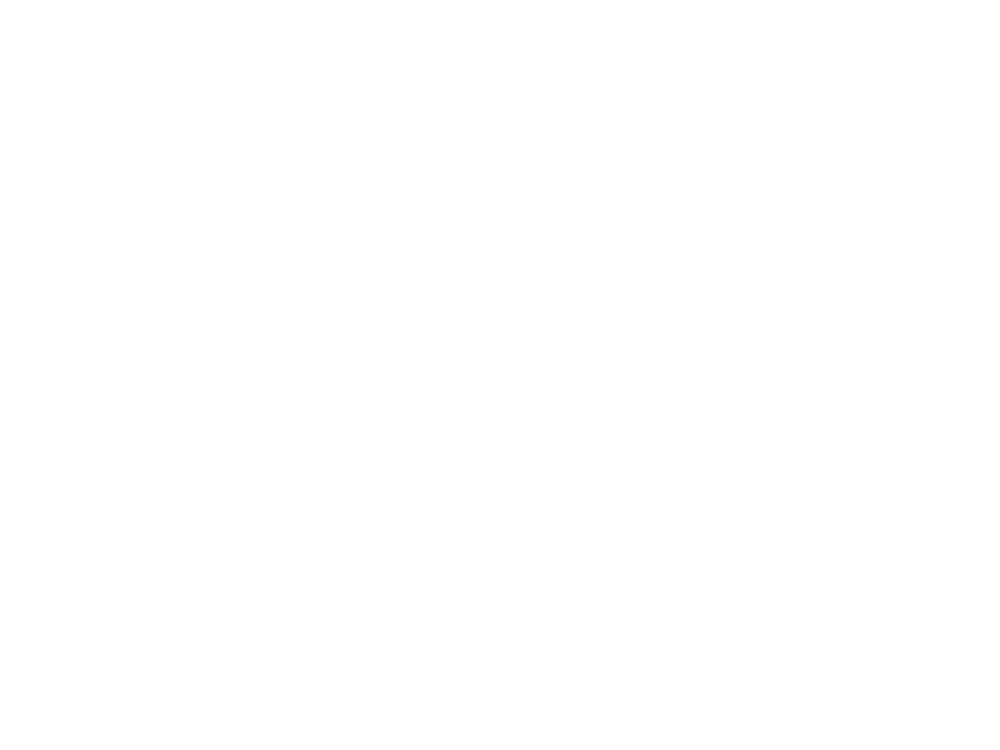

<IPython.core.display.Javascript object>


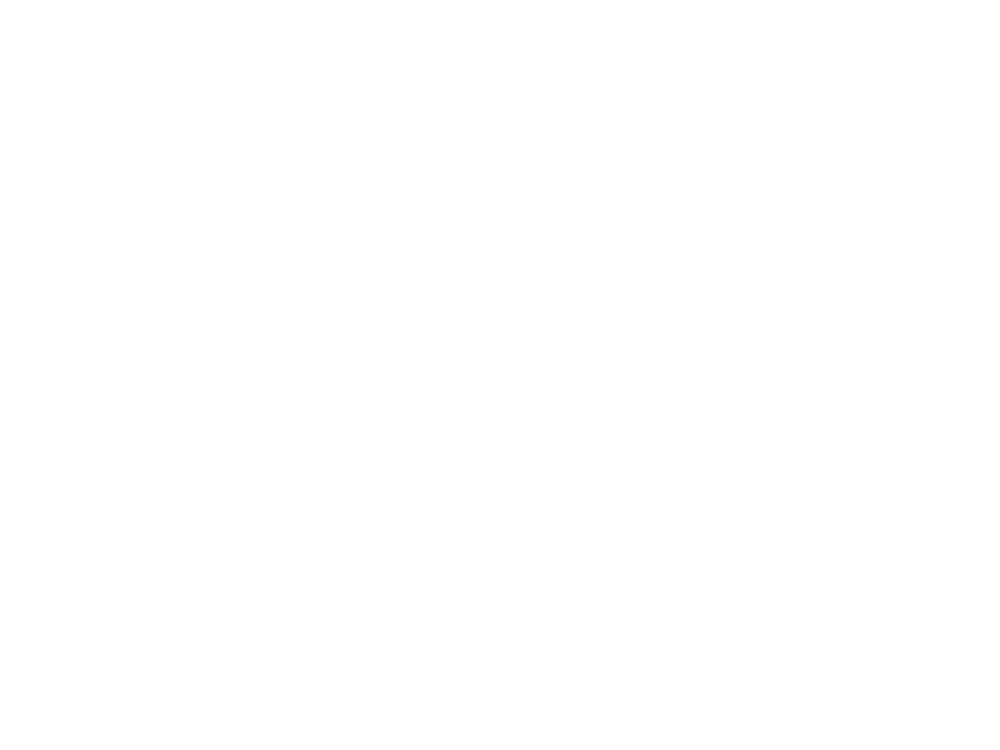

<IPython.core.display.Javascript object>


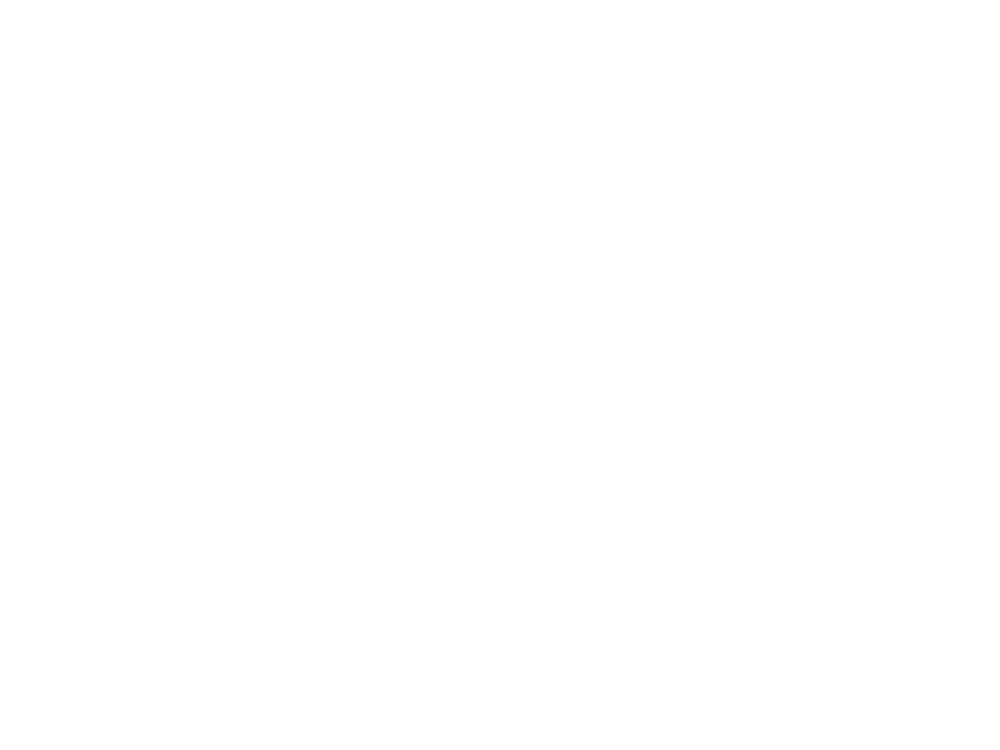

<IPython.core.display.Javascript object>


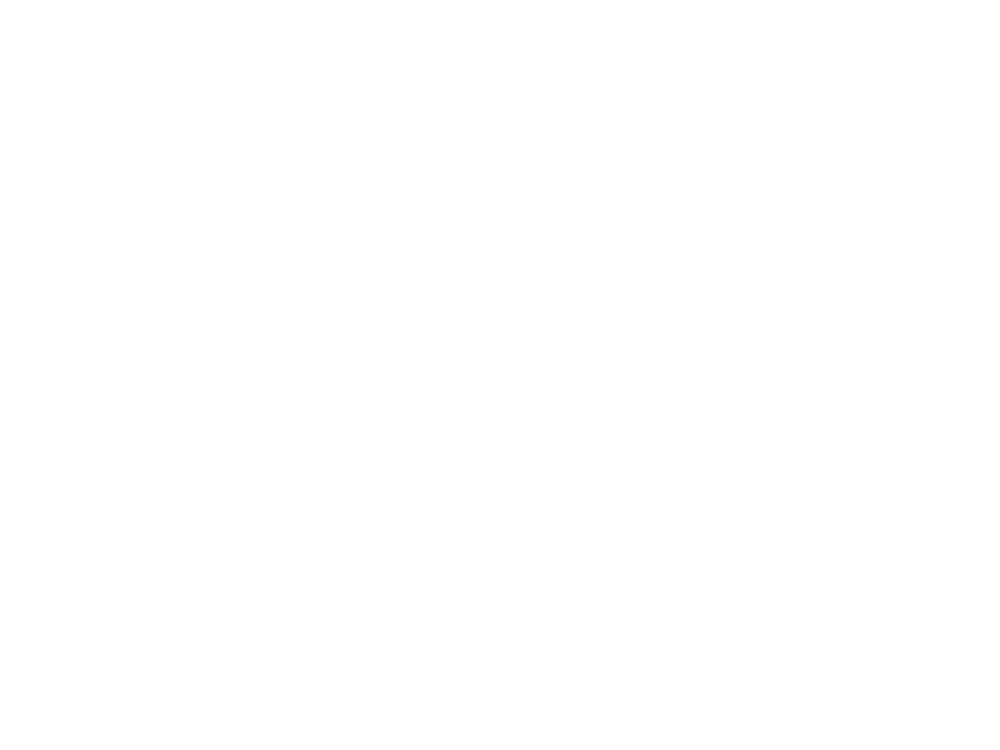

<IPython.core.display.Javascript object>


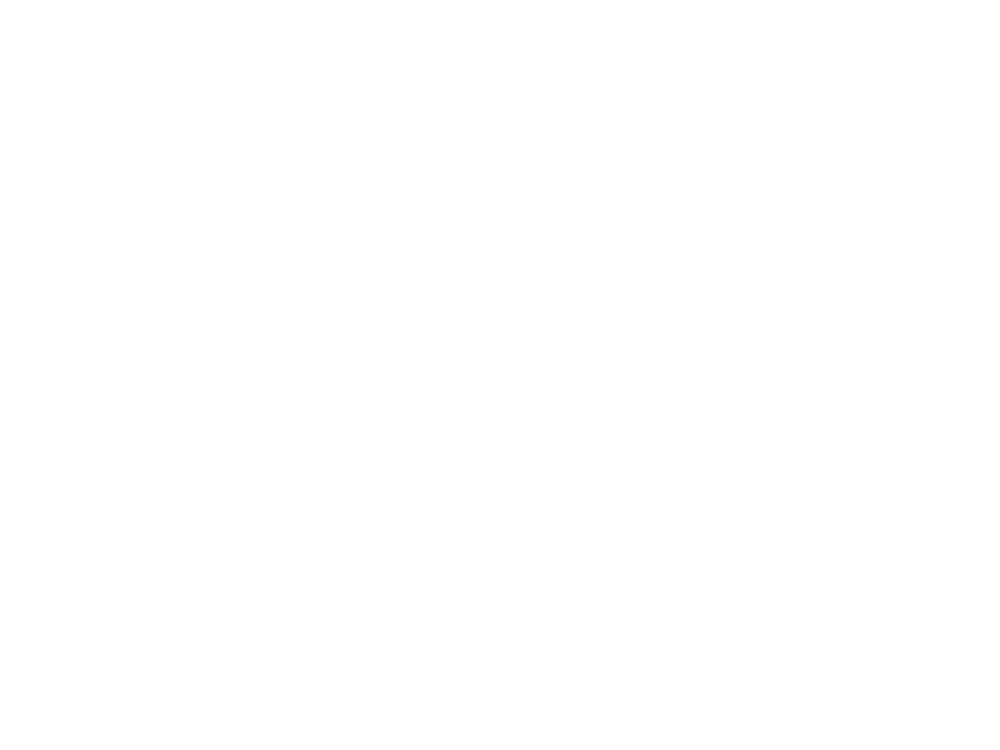

In [76]:
df = pd.read_csv('/home/dana_z/HD1/lfp2ca_notNormalize/sessions')
cells = ['MSN']
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    cellType = 'CRE'
    cre = 'CHI'
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per,mice=l)
    else:
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
    pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
    del A,b
    b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
    fig.savefig(figFolder+'figure5_CHI'+per+'normalizedByNeuron.png',format='png')
#     fig.savefig(figFolder+'figure5_'+per+'normalizedByNeuron.svg',format='svg')
    fig.clf()
    plt.close(fig)

#     mu = np.mean(b[:int(b.shape[0]/2),:],axis=0)
#     Std = np.std(b[:int(b.shape[0]/2),:],axis=0)
#     b =(b-mu)/Std

#     fig, ax = plt.subplots()
#     CS=ax.pcolormesh(tPlot,freq,b.T,vmax=5,vmin=-5)
#     fig.colorbar(CS)
#     ax.set_title('Z-score'+' '+per)
#     fig.savefig(figFolder+'figure5_'+per+'_unNormalized.png',format='png')
# #     fig.savefig(figFolder+'figure5_'+per+'_unNormalized.svg',format='svg')
#     fig.clf()
#     plt.close(fig)

In [ ]:
df = pd.read_csv('/home/dana_z/HD1/lfp2speed2/sessions')
savePath = '/home/dana_z/HD1/lfp2speed2/'
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 =getAlignedLFP_mvmt(savePath, mice = l, period = per)
    else:
        A,df2 = getAlignedLFP_mvmt(savePath, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
    pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
    del A,b
    b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
    fig.savefig(figFolder+'figure5_'+per+'Speed_normalizedByonset.png',format='png')
#     fig.savefig(figFolder+'figure5_'+per+'normalizedByNeuron.svg',format='svg')
    fig.clf()
    plt.close(fig)

#     mu = np.mean(b[:int(b.shape[0]/2),:],axis=0)
#     Std = np.std(b[:int(b.shape[0]/2),:],axis=0)
#     b =(b-mu)/Std

#     fig, ax = plt.subplots()
#     CS=ax.pcolormesh(tPlot,freq,b.T,vmax=5,vmin=-5)
#     fig.colorbar(CS)
#     ax.set_title('Z-score'+' '+per)
#     fig.savefig(figFolder+'figure5_'+per+'_unNormalized.png',format='png')
# #     fig.savefig(figFolder+'figure5_'+per+'_unNormalized.svg',format='svg')
#     fig.clf()
#     plt.close(fig)

<IPython.core.display.Javascript object>


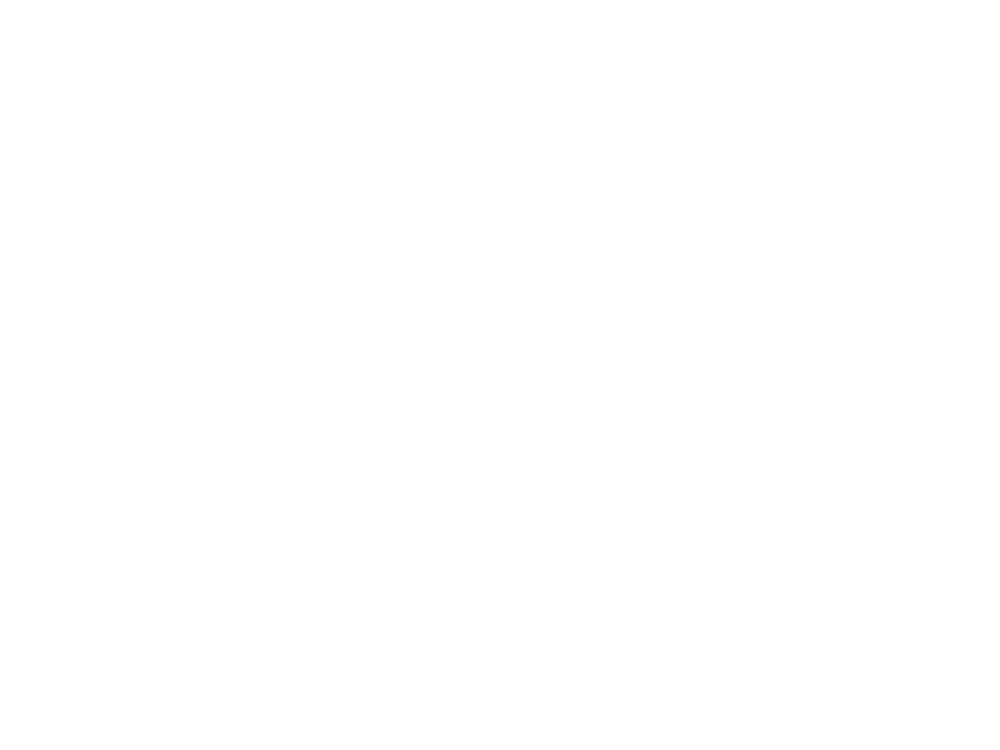

<IPython.core.display.Javascript object>


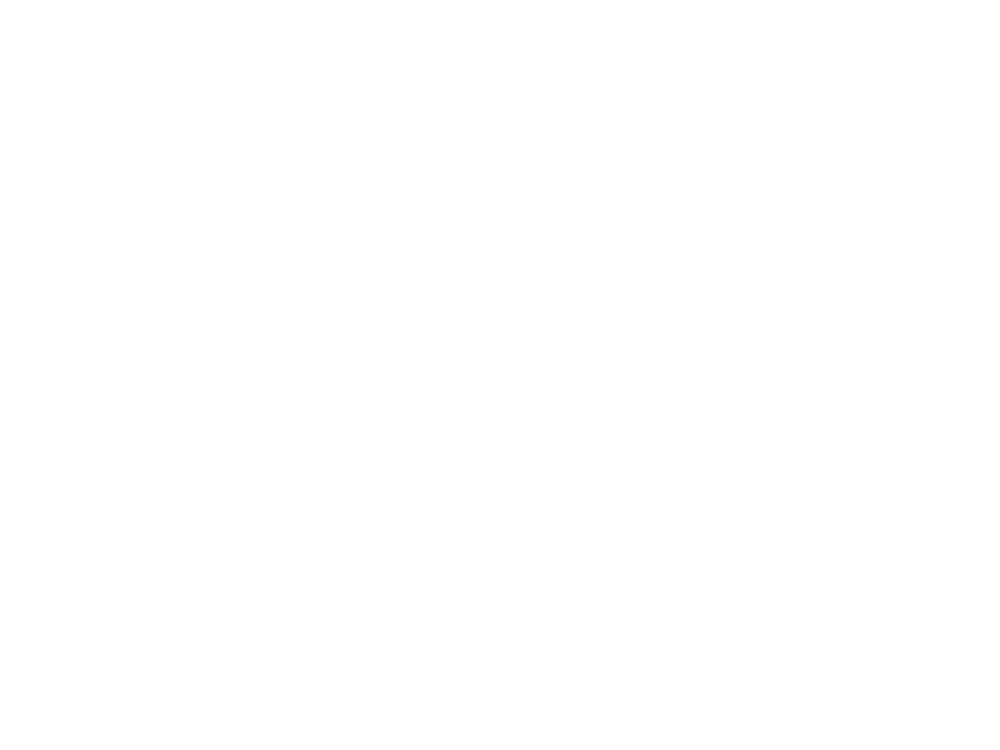

<IPython.core.display.Javascript object>


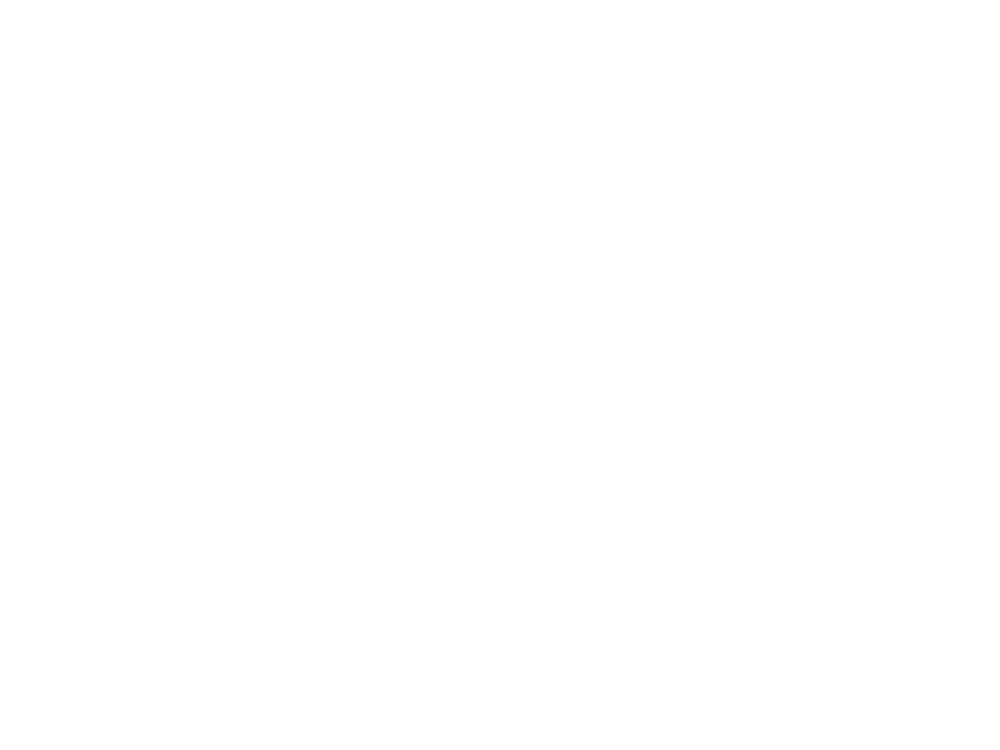

<IPython.core.display.Javascript object>


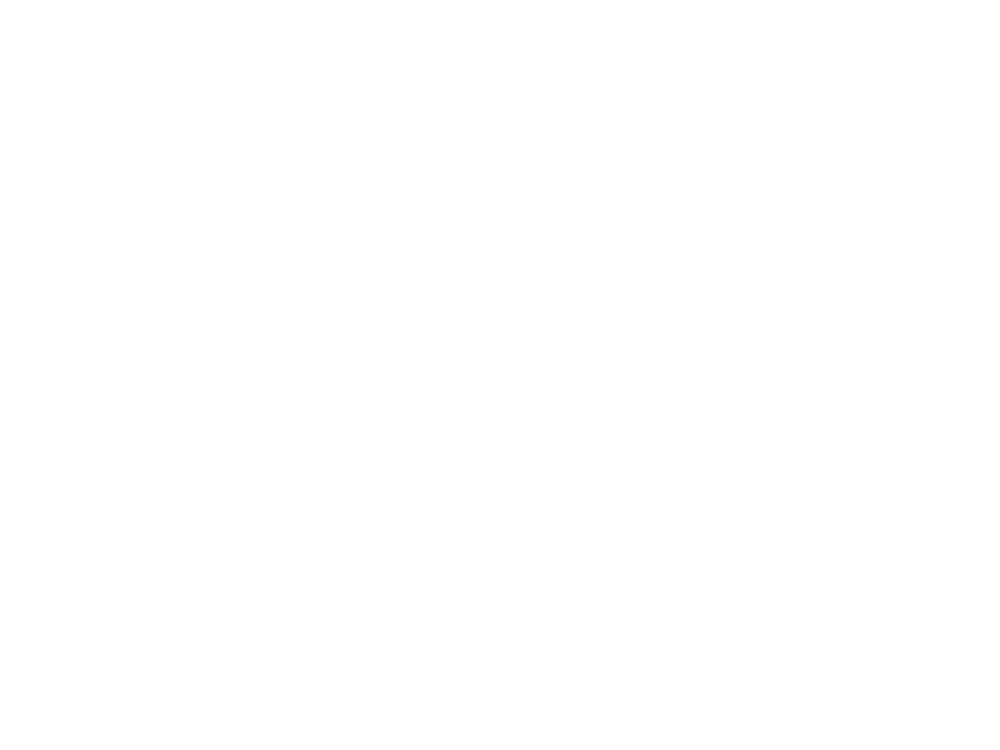

<IPython.core.display.Javascript object>


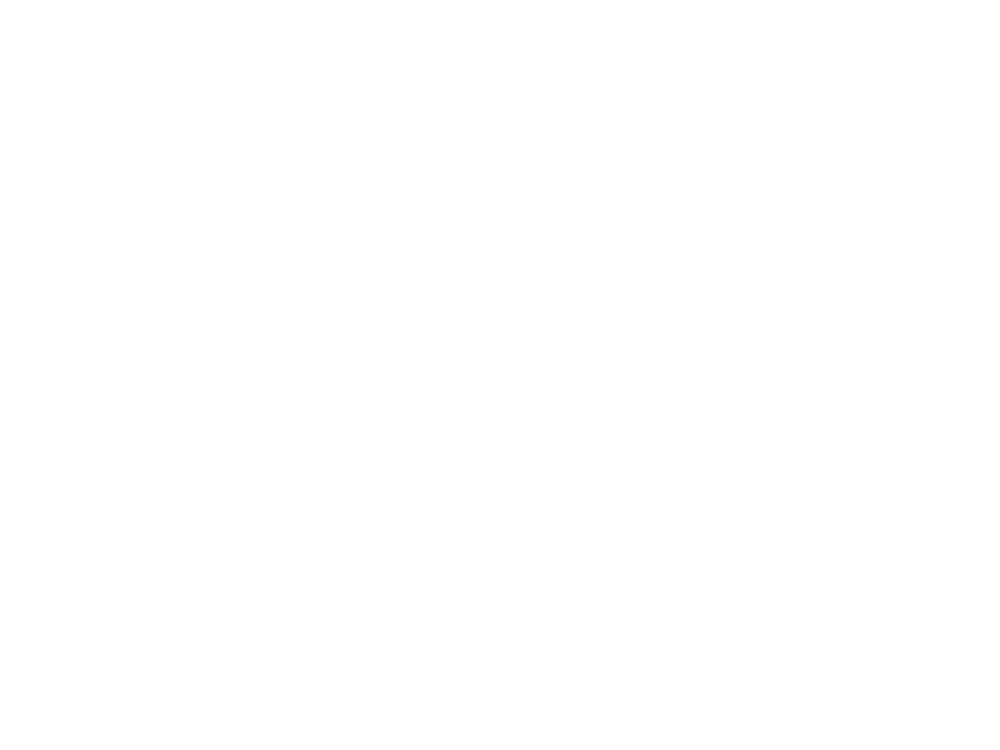

In [75]:
df = pd.read_csv('/home/dana_z/HD1/lfp2Crot/sessions')
savePath = '/home/dana_z/HD1/lfp2Crot/'
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 =getAlignedLFP_mvmt(savePath, mice = l, period = per)
    else:
        A,df2 = getAlignedLFP_mvmt(savePath, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
    pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
    del A,b
    b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
    fig.savefig(figFolder+'figure5_'+per+'Crot_normalizedByonset.png',format='png')
#     fig.savefig(figFolder+'figure5_'+per+'normalizedByNeuron.svg',format='svg')
    fig.clf()
    plt.close(fig)

#     mu = np.mean(b[:int(b.shape[0]/2),:],axis=0)
#     Std = np.std(b[:int(b.shape[0]/2),:],axis=0)
#     b =(b-mu)/Std

#     fig, ax = plt.subplots()
#     CS=ax.pcolormesh(tPlot,freq,b.T,vmax=5,vmin=-5)
#     fig.colorbar(CS)
#     ax.set_title('Z-score'+' '+per)
#     fig.savefig(figFolder+'figure5_'+per+'_unNormalized.png',format='png')
# #     fig.savefig(figFolder+'figure5_'+per+'_unNormalized.svg',format='svg')
#     fig.clf()
#     plt.close(fig)

<IPython.core.display.Javascript object>


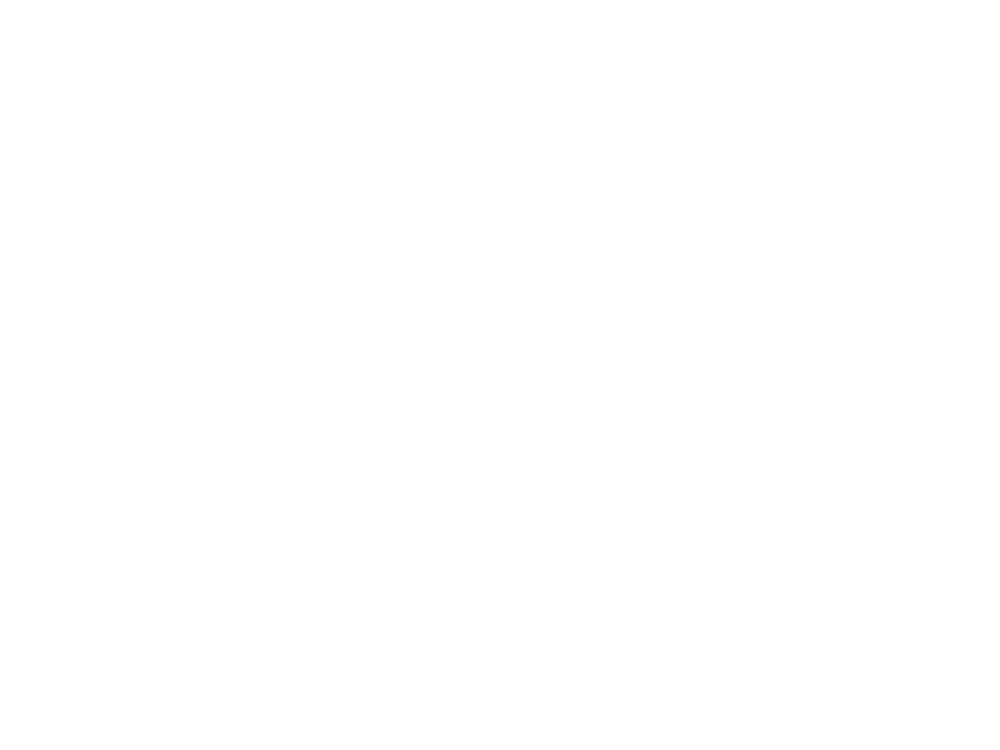

<IPython.core.display.Javascript object>


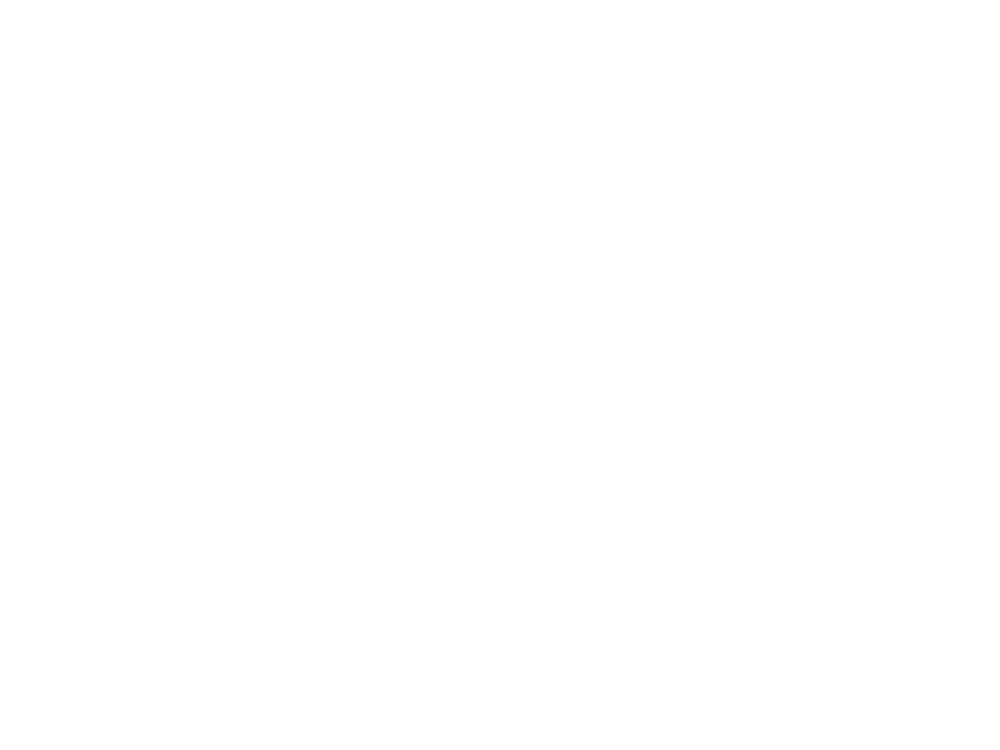

<IPython.core.display.Javascript object>


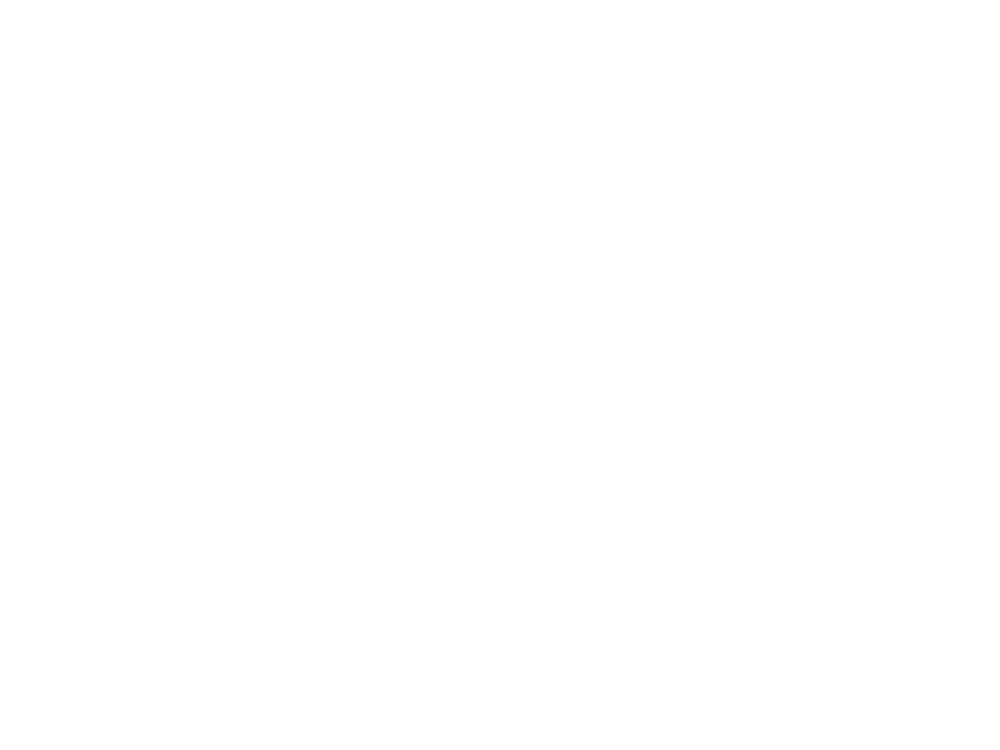

<IPython.core.display.Javascript object>


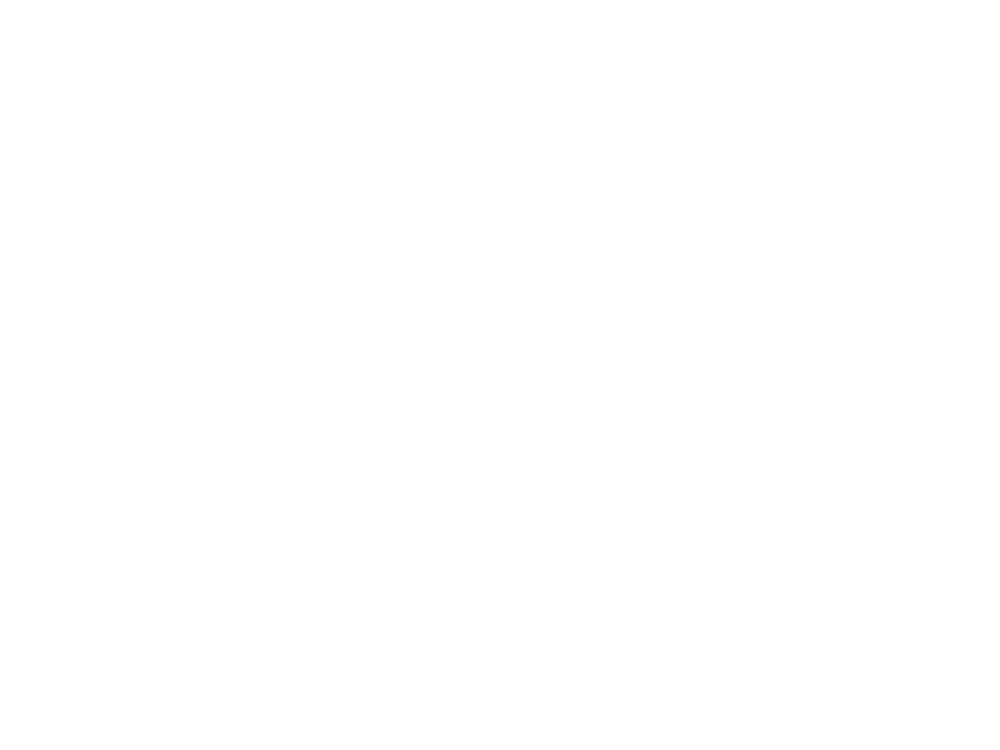

<IPython.core.display.Javascript object>


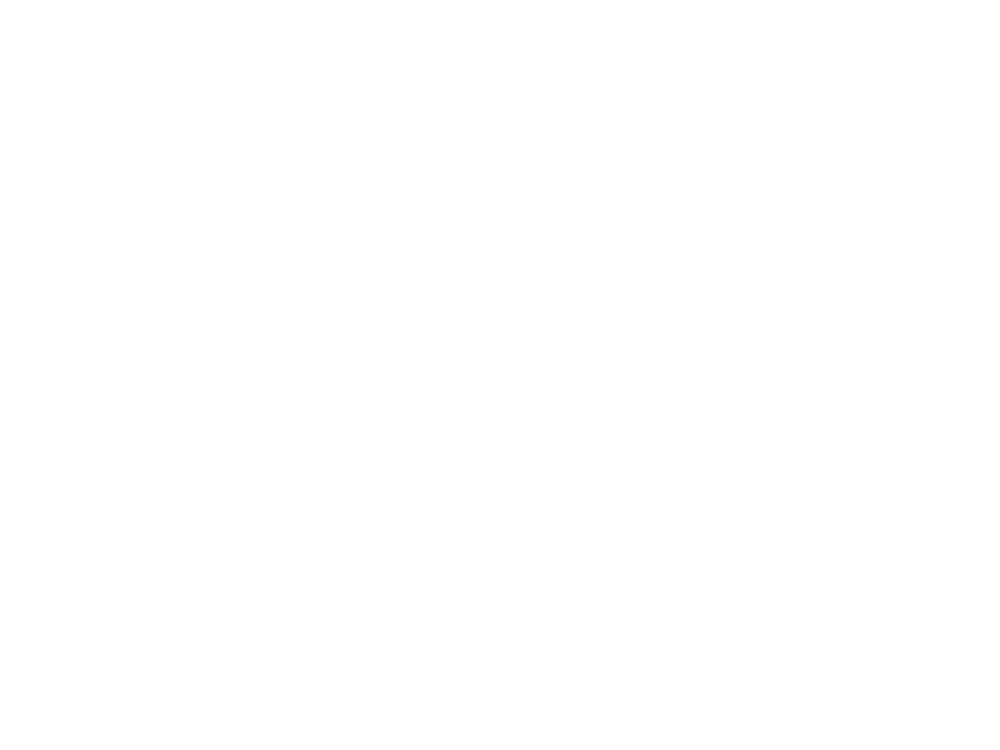

In [74]:
df = pd.read_csv('/home/dana_z/HD1/lfp2ACrot/sessions')
savePath = '/home/dana_z/HD1/lfp2ACrot/'
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 =getAlignedLFP_mvmt(savePath, mice = l, period = per)
    else:
        A,df2 = getAlignedLFP_mvmt(savePath, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
    pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
    del A,b
    b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
    fig.savefig(figFolder+'figure5_'+per+'ACrot_normalizedByonset.png',format='png')
#     fig.savefig(figFolder+'figure5_'+per+'normalizedByNeuron.svg',format='svg')
    fig.clf()
    plt.close(fig)

#     mu = np.mean(b[:int(b.shape[0]/2),:],axis=0)
#     Std = np.std(b[:int(b.shape[0]/2),:],axis=0)
#     b =(b-mu)/Std

#     fig, ax = plt.subplots()
#     CS=ax.pcolormesh(tPlot,freq,b.T,vmax=5,vmin=-5)
#     fig.colorbar(CS)
#     ax.set_title('Z-score'+' '+per)
#     fig.savefig(figFolder+'figure5_'+per+'_unNormalized.png',format='png')
# #     fig.savefig(figFolder+'figure5_'+per+'_unNormalized.svg',format='svg')
#     fig.clf()
#     plt.close(fig)

/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  """


<IPython.core.display.Javascript object>


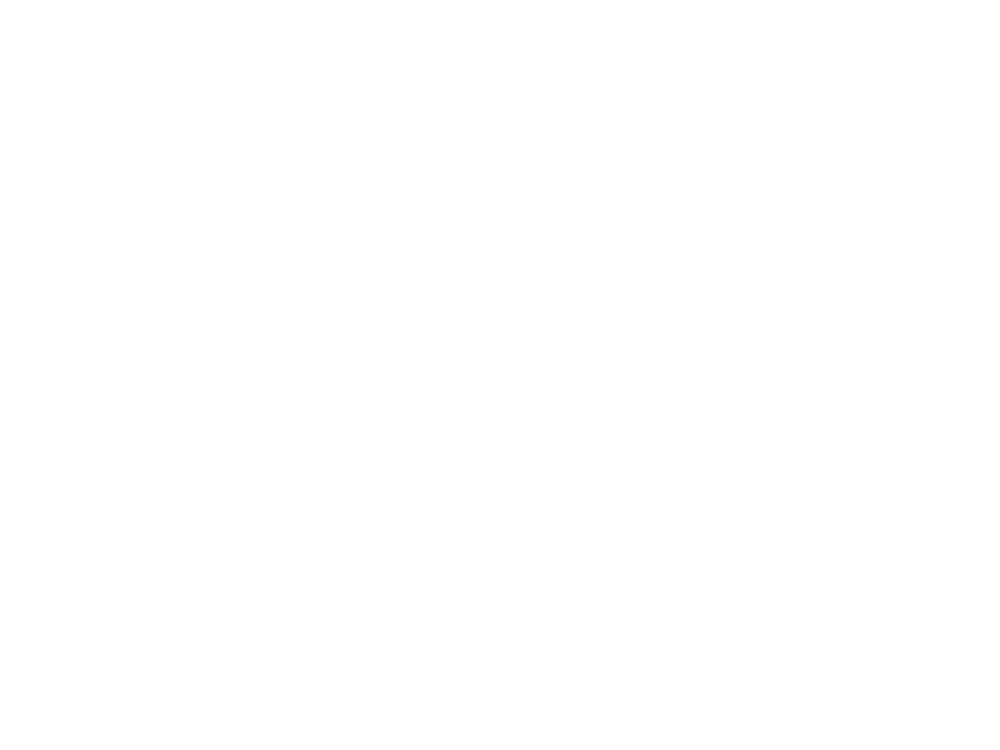

<IPython.core.display.Javascript object>


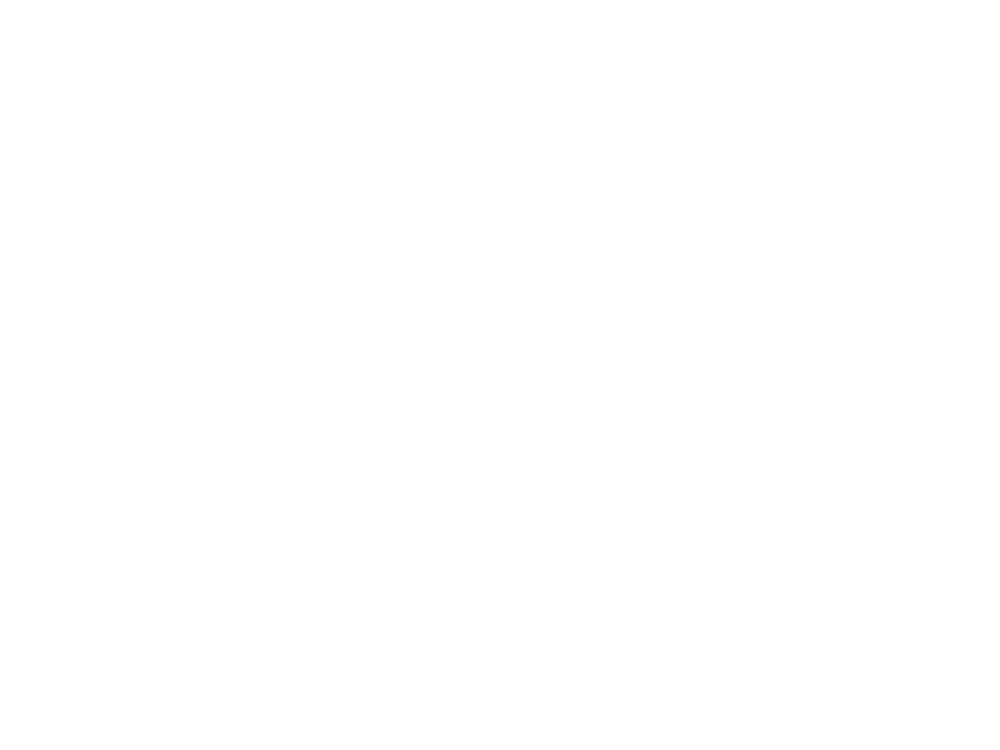

<IPython.core.display.Javascript object>


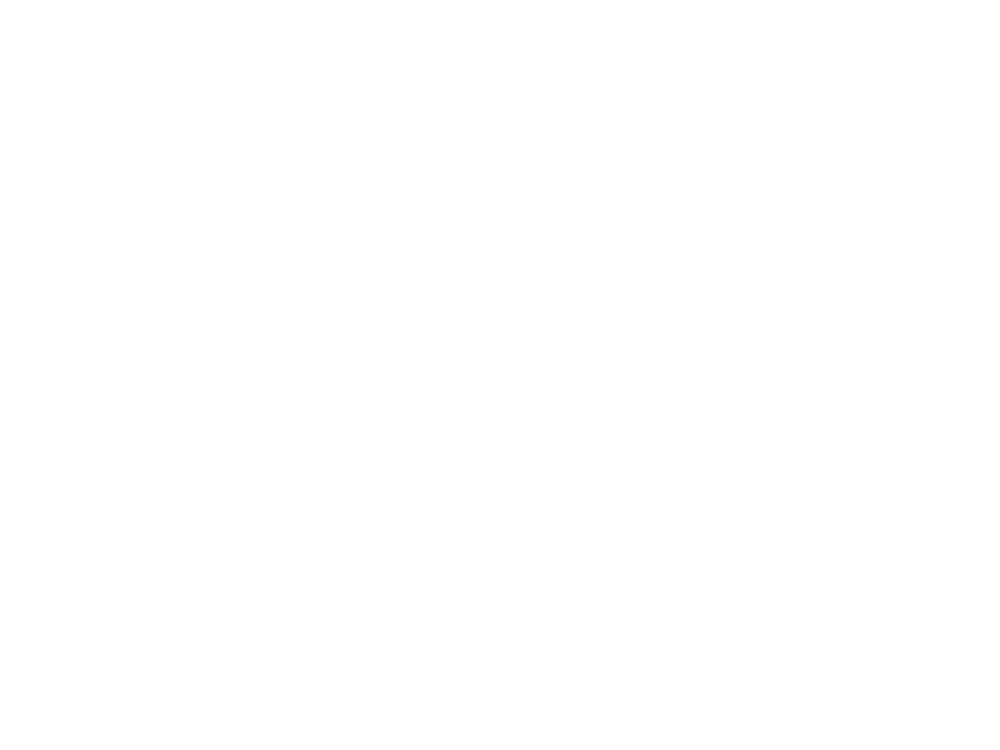

<IPython.core.display.Javascript object>


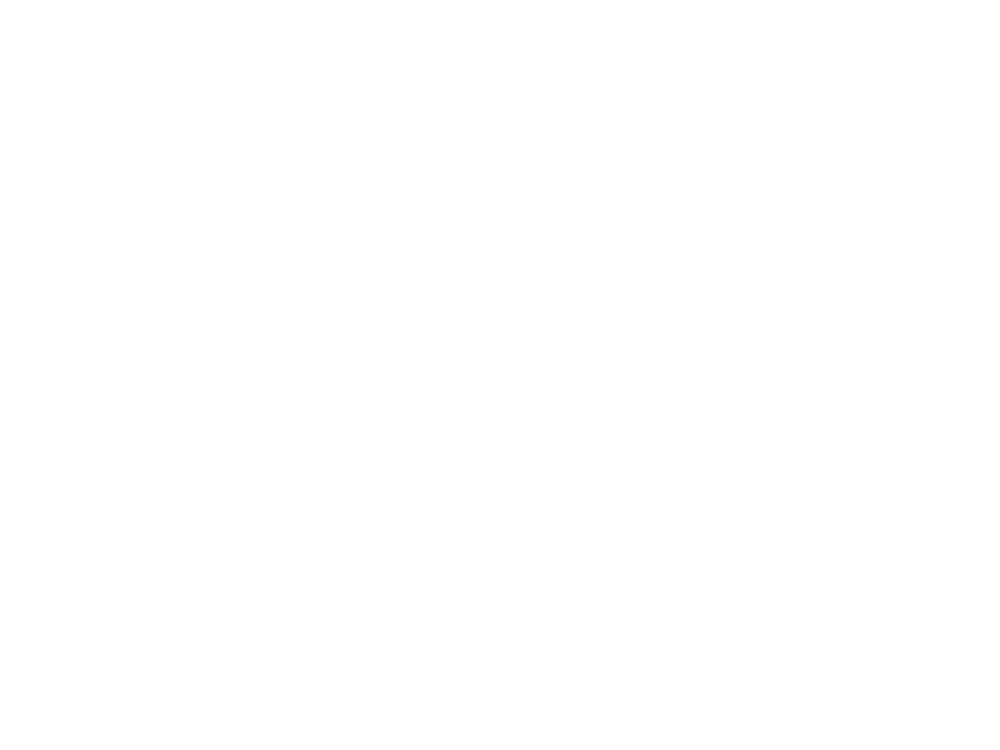

<IPython.core.display.Javascript object>


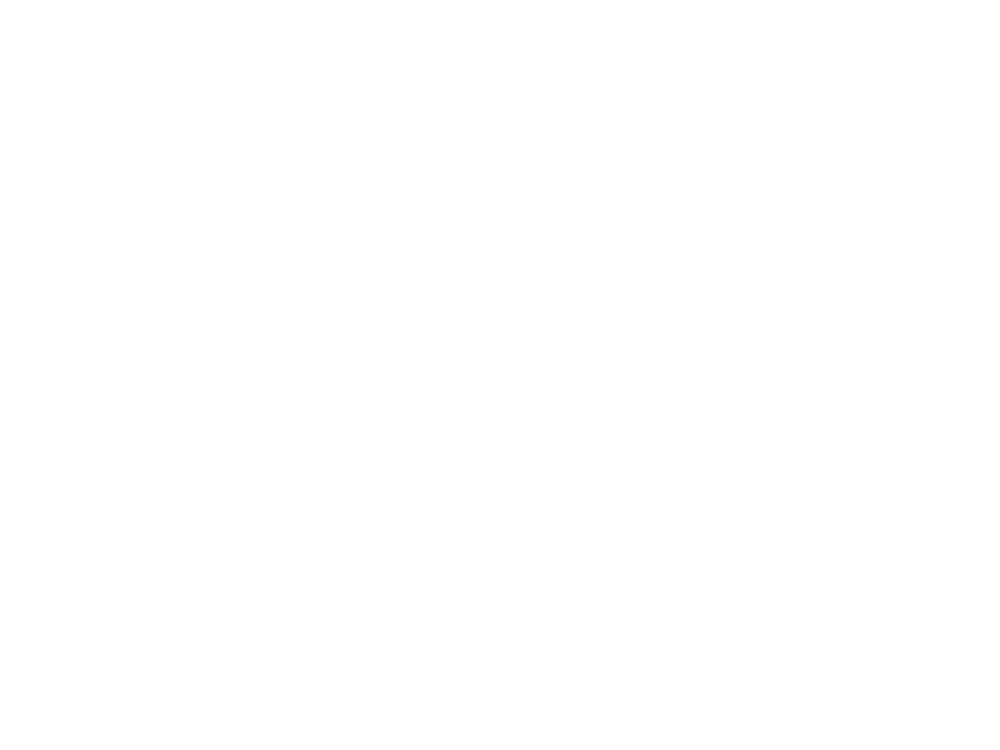

In [70]:
# per mouse - just to double check
df = pd.read_csv('/home/dana_z/HD1/lfp2speed2/sessions')
savePath = '/home/dana_z/HD1/lfp2speed2/'
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))

for per in df.period.unique():
    A,df2 = getAlignedLFP_mvmt(savePath, period = per)
    if A.shape[2] > 1000:
        b = A[:,:,0:1000]
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nansum(b,axis=2)
        for ind in range(0,A.shape[2]//1000):
            c = A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])]
            mu = np.mean(c[:int(c.shape[0]/2),:,:],axis=0)
            Std = np.std(c[:int(c.shape[0]/2),:,:],axis=0)
            c =(c-mu)/Std
            c = np.nansum(c,axis=2)
            b = b+c
        b= b/A.shape[2]
    else:
        b = A
        mu = np.mean(b[:int(b.shape[0]/2),:,:],axis=0)
        Std = np.std(b[:int(b.shape[0]/2),:,:],axis=0)
        b =(b-mu)/Std
        b = np.nanmean(b,axis=2)
#         pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
#         del A,b
#         b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T,vmax=1.2,vmin=-0.3)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
    fig.savefig(figFolder+'figure5_'+per+'_Speed_normalizedByonset.png',format='png')
#     fig.savefig(figFolder+'figure5_'+per+'normalizedByNeuron.svg',format='svg')
    fig.clf()
    plt.close(fig)

#     mu = np.mean(b[:int(b.shape[0]/2),:],axis=0)
#     Std = np.std(b[:int(b.shape[0]/2),:],axis=0)
#     b =(b-mu)/Std

#     fig, ax = plt.subplots()
#     CS=ax.pcolormesh(tPlot,freq,b.T,vmax=5,vmin=-5)
#     fig.colorbar(CS)
#     ax.set_title('Z-score'+' '+per)
#     fig.savefig(figFolder+'figure5_'+per+'_unNormalized.png',format='png')
# #     fig.savefig(figFolder+'figure5_'+per+'_unNormalized.svg',format='svg')
#     fig.clf()
#     plt.close(fig)

In [6]:
figFolder+'figure5_'+per+'_'+m+'Speed_normalizedByonset.png'

'/home/dana_z/ssd_2TB/6OHDA/figs/paper1_edit2/figure5_One Month_8815Speed_normalizedByonset.png'

In [ ]:
df = pd.read_csv('/home/dana_z/HD1/lfpAligned2Ca/Pre/sessions')
cells = ['MSN']
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
for per in df.period.unique():
    cellType = 'MSN'
    cre = None
    if per == 'One Month': 
        # remove from figure only because too many outliers (Nan) makes the figure granular
        # data was still used for analysis
        l = getMiceList(Files[1])
        l.remove('1236')
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per,mice=l)
    else:
        A,df2 = getAlignedLFP(cellType,cre = cre, period = per)
    if A.shape[2] > 1000:
        b = np.nansum(A[:,:,0:1000],axis=2)
        for ind in range(0,A.shape[2]//1000):
            b = b+np.nansum(A[:,:,1000*(ind+1):np.min([A.shape[2],1000*(ind+2)])],axis=2)
        b= b/A.shape[2]
    else:
        b = np.nanmean(A,axis=2)
    pickle.dump(b, open(figFolder+per+'.p',"wb"),protocol=4)
    del A,b
    b = pickle.load(open(figFolder+per+'.p',"rb"))

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
    fig.savefig(figFolder+'figure5_'+per+'.png',format='png')
    fig.savefig(figFolder+'figure5_'+per+'.svg',format='svg')
    fig.clf()
    plt.close(fig)

    mu = np.mean(b[:int(b.shape[0]/2),:],axis=0)
    Std = np.std(b[:int(b.shape[0]/2),:],axis=0)
    b =(b-mu)/Std

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T,vmax=5,vmin=-5)
    fig.colorbar(CS)
    ax.set_title('Z-score'+' '+per)
    fig.savefig(figFolder+'figure5_'+per+'_Zscore.png',format='png')
    fig.savefig(figFolder+'figure5_'+per+'_Zscore.svg',format='svg')
    fig.clf()
    plt.close(fig)

  0%|          | 0/82 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
I deleted session: 2976_day4


 23%|██▎       | 19/82 [13:56<1:30:10, 85.88s/it]

found  1.0  outlier points


 39%|███▉      | 32/82 [55:31<3:13:13, 231.87s/it]

found  1.0  outlier points


100%|██████████| 82/82 [3:37:25<00:00, 159.09s/it]  
/home/dana_z/ssd_2TB/6OHDA/IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:48: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  lfp = hf[m][s]['ePhys']['lfp'].value
  0%|          | 0/68 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data
I deleted session: 1208_day12


/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
 32%|███▏      | 22/68 [05:21<14:24, 18.79s/it]

found  3.0  outlier points


 46%|████▌     | 31/68 [07:52<13:21, 21.67s/it]

found  29.0  outlier points


100%|██████████| 68/68 [1:19:03<00:00, 69.76s/it] 
/home/dana_z/ssd_2TB/6OHDA/IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:48: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  lfp = hf[m][s]['ePhys']['lfp'].value
  0%|          | 0/37 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
 11%|█         | 4/37 [00:45<06:16, 11.42s/it]

found  17.0  outlier points


 57%|█████▋    | 21/37 [06:22<06:45, 25.37s/it]

found  50.0  outlier points


100%|██████████| 37/37 [19:34<00:00, 31.73s/it]
/home/dana_z/ssd_2TB/6OHDA/IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:48: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  lfp = hf[m][s]['ePhys']['lfp'].value
  0%|          | 0/25 [00:00<?, ?it/s]

cleaning up trace data
cleaning up lfp data


/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
 24%|██▍       | 6/25 [01:14<03:21, 10.61s/it]

found  888231.0  outlier points


 28%|██▊       | 7/25 [02:01<06:29, 21.66s/it]

found  481139.0  outlier points


100%|██████████| 25/25 [19:05<00:00, 45.84s/it] 


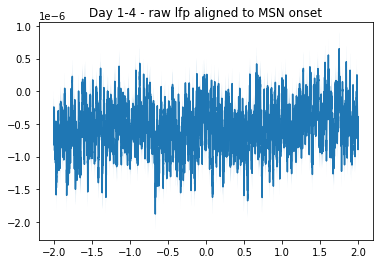

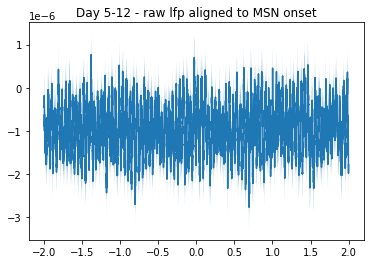

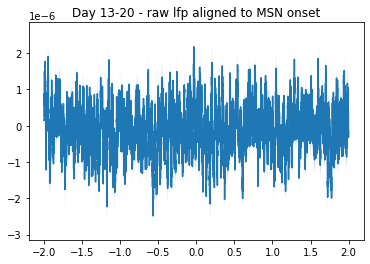

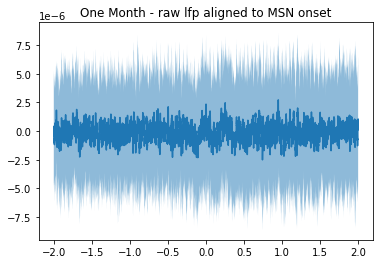

In [199]:
# constents for analysis:
WinPre = 2 #s
WinPost = 2 #s

periods = {'Healthy':lambda x: x==0,
           'Day 1-4':lambda x: x<5,
           'Day 5-12':lambda x: (x>4) & (x<13),
           'Day 13-20':lambda x: (x>12) & (x<21),
           'One Month':lambda x: x>21}

# for each period 
for p in periods.keys(): 
    data =  getData(Files[0],['lfp','trace'],period ='Pre', day=periods[p])
    for sess in tqdm(data.keys()): 
         # get data
        Ca = getOnsetOrPeriod(sess[0:4],sess,'Pre','caOnset_Hf')
        dCa = np.append(Ca[:,1:]-Ca[:,:-1],np.zeros((Ca.shape[0],1)),axis=1)
        dCa[dCa==-1] = 0
        
        lfp = data[sess]['lfp']['lfp']
        lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
        try:
            lfp[(lfpOutliers[:,0]==1)] = np.nan
        except:
            print(sess)
            continue
        
        dtS = float(1/data[sess]['trace']['FS'])
        dtL = float(1/data[sess]['lfp']['FS'])
        ts = np.arange(0, np.max(data[sess]['trace']['dff'].shape)) * dtS 
        tl = np.arange(0, np.max(lfp.shape)) * dtL

        tPlot = np.linspace(-WinPre,WinPost,int((WinPre+WinPost)/dtL))     
                
        # for every MSN neuron:
        numRed = int(data[sess]['trace']['numred'])
        dca = dCa[numRed:,:]
        dca = dca[np.sum(dca,axis=1)!=0,:]
        
        for msnN in range(0,np.min(dca.shape)):
            onsetL = np.full_like(tl,False)
            mN = dca[msnN,:]
            for si in ts[mN.astype(bool)]:
                ti = np.argmin(np.abs(tl-si))
                onsetL[ti] = True
            al = alignToOnset(lfp,(onsetL==1), winPost =WinPre/dtL, winPre = WinPost/dtL)

            if al.ndim <2:
                try:
                    al = np.reshape(al,(al.shape[0],1))
                except:
                    print('no onset, when there should be. MSN#',msnN,' in sess= ',sess)
                    continue
            
            if 'aligned' in locals():
                aligned = np.concatenate((aligned,al), axis = 1)
            else:
                aligned = al
    y =  np.nanmedian(aligned,axis=1)
    error = np.nanstd(aligned,axis=1)/np.sqrt(aligned.shape[1])
    fig, ax = plt.subplots()
    ax.plot(tPlot[:-1],y)
    ax.fill_between(tPlot[:-1],y-error, y+error,alpha=.5)
    ax.set_title(p + ' - raw lfp aligned to MSN onset')
    fig.savefig(figFolder+'figure5_'+p+'_raw_median.png',format='png')
    fig.savefig(figFolder+'figure5_'+p+'_raw_median.svg',format='svg')
    del aligned, y, error
  


Figure 6

Suplemental figures

<h1> Extra Analysis - might be added to paper later

In [16]:
figFolder = '/home/dana_z/ssd_2TB/6OHDA/figs/housekeeping/'

In [166]:
# look at individual CHI/PV
f = h5py.File('/home/dana_z/HD1/connactivityAnalysis/connMaps2.hdf5','a')
numshifts = 1000
for m in tqdm(miceList):
    grp = f.create_group(m)
    data =  getData(Files[1],['trace'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        if sess in grp.keys():
            continue
        subgrp = grp.create_group(sess)
        
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])

        numRed = int(data[sess]['trace']['numred']) 
        
        subgrp.attrs['numRed'] = numRed
        subgrp.attrs['day'] = day
        subgrp.attrs['period'] = periodCalc(day)

        try:  
            Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')            
            cor = np.dot(Ca ,Ca.T)/np.sum(Ca,axis=1) # Do the actual co-occorence matrix not np.corrcoef(Ca)
            cor2 = np.corrcoef(Ca)
            dff = data[sess]['trace']['dff']        
            cor3 = np.corrcoef(dff)

            ssubgrp = subgrp.create_group('Pre')
            ssubgrp['aSymCorr'] = cor
            ssubgrp['pearson'] = cor2
            ssubgrp['pearsonF'] = cor3

            sCor = np.empty((cor.shape[0],cor.shape[1],numshifts))
            sCor2 = np.empty((cor.shape[0],cor.shape[1],numshifts))
            sCor3 = np.empty((cor.shape[0],cor.shape[1],numshifts))
            for s in range(0,numshifts):
                shifts = np.random.randint(size= Ca.shape[0],low=0,high=Ca.shape[1])
                Ca2 = circShiftRoll(shifts,Ca)
                dff2 = circShiftRoll(shifts,dff)
                sCor2[:,:,s] = np.corrcoef(Ca2)
                sCor[:,:,s] = np.dot(Ca2 ,Ca2.T)/np.sum(Ca2,axis=1)
                sCor3[:,:,s] = np.corrcoef(dff2)
            ssubgrp['aSymCorr_shuffle'] = sCor
            ssubgrp['pearson_shuffle'] = sCor2
            ssubgrp['pearsonF_shuffle'] = sCor3
            del sCor
            del sCor2
            del sCor3
        except:
            print(sess)
f.close()

  0%|          | 0/16 [00:00<?, ?it/s]


ValueError: Unable to create group (name already exists)

In [13]:
# look at individual CHI/PV
f = h5py.File('/home/dana_z/HD1/connactivityAnalysis/connMaps.hdf5','a')
numshifts = 1000
for m in tqdm(miceList):
    grp = f[m]
    data =  getData(Files[1],['trace'],period ='Pre', mice=m)
    cre = getCreType(Files[1],m)
    for sess in tqdm(data.keys()): 
        subgrp = grp[sess]
        
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])

        numRed = int(data[sess]['trace']['numred']) 
        
        try:  
            Ca = data[sess]['trace']['dff']        
            cor2 = np.corrcoef(Ca)

            ssubgrp = subgrp['Pre']
            try:
                ssubgrp['pearsonF'] = cor2
            except:
                del ssubgrp['pearsonF']
                ssubgrp['pearsonF'] = cor2

            sCor2 = np.empty((cor2.shape[0],cor2.shape[1],numshifts))
            for s in range(0,numshifts):
                shifts = np.random.randint(size= Ca.shape[0],low=0,high=Ca.shape[1])
                Ca2 = circShiftRoll(shifts,Ca)
                sCor2[:,:,s] = np.corrcoef(Ca2)
            try:
                ssubgrp['pearsonF_shuffle'] = sCor2
            except:
                del ssubgrp['pearsonF_shuffle']
                ssubgrp['pearsonF_shuffle'] = sCor2
            del sCor2
        except:
            print(sess)
f.close()

  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data



 43%|████▎     | 6/14 [00:36<00:41,  5.15s/it]

1222_day2



  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/17 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data



  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data



100%|██████████| 16/16 [1:00:46<00:00, 227.91s/it]


In [170]:
# repeat the per session one to make sure that result is same with PersonF
f = h5py.File('/home/dana_z/HD1/connactivityAnalysis/connMaps2.hdf5','r')
col_names = ['Mouse','Sess','Day','numred','Period','population','personF','sPersonF','aSymCorr','sASymCorr']
df = pd.DataFrame(columns = col_names)
for m in f.keys():
    for sess in f[m].keys():
        try:
            numred = f[m][sess].attrs['numRed']
            cre = getCreType(Files[1],m)
            tempDict = {'Mouse':m,'Sess':sess,'Day':f[m][sess].attrs['day'],
                                'numred':numred,'Period':f[m][sess].attrs['period']}

            a = f[m][sess]['Pre'][('pearsonF')].value #['aSymCorr'].value
            a[np.tril(a)==0] = np.nan

            b = f[m][sess]['Pre'][('pearsonF_shuffle')].value
            b = np.nanmean(b,axis=2)
            b[np.tril(b,-1)==0] = np.nan

            c = f[m][sess]['Pre']['pearson'].value
            c[np.tril(c,-1)==0] = np.nan

            d = f[m][sess]['Pre'][('pearson_shuffle')].value
            d = np.nanmean(d,axis=2)
            d[np.tril(d,-1)==0] = np.nan

            if numRed > 1:
                tempDict['population'] = cre+'-'+cre
                tempDict['personF'] = np.nanmean(a[:numred,:numred])
                tempDict['sPersonF'] = np.nanmean(b[:numred,:numred])
                tempDict['aSymCorr'] = np.nanmean(c[:numred,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[:numred,:numred])
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)
            if numRed > 0:
                tempDict['population'] = 'MSN-'+cre
                tempDict['personF'] = np.nanmean(a[numred:,:numred])
                tempDict['sPersonF'] = np.nanmean(b[numred:,:numred])
                tempDict['aSymCorr'] = np.nanmean(c[numred:,:numred])
                tempDict['sASymCorr'] = np.nanmean(d[numred:,:numred])
                df2 = pd.DataFrame([tempDict])
                df = pd.concat([df,df2],sort=True)

            tempDict['population'] = 'MSN-MSN'
            tempDict['personF'] = np.nanmean(a[numred:,numred:])
            tempDict['sPersonF'] = np.nanmean(b[numred:,numred:])
            tempDict['aSymCorr'] = np.nanmean(c[numred:,numred:])
            tempDict['sASymCorr'] = np.nanmean(d[numred:,numred:])
            df2 = pd.DataFrame([tempDict])
            df = pd.concat([df,df2],sort=True)
        except:
            print(sess)
f.close()
df.to_csv('bySessCompareCorr2.csv')

/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  del sys.path[0]
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:16: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  app.launch_new_instance()
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:20: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:23: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: Runtime

1222_day2


<IPython.core.display.Javascript object>


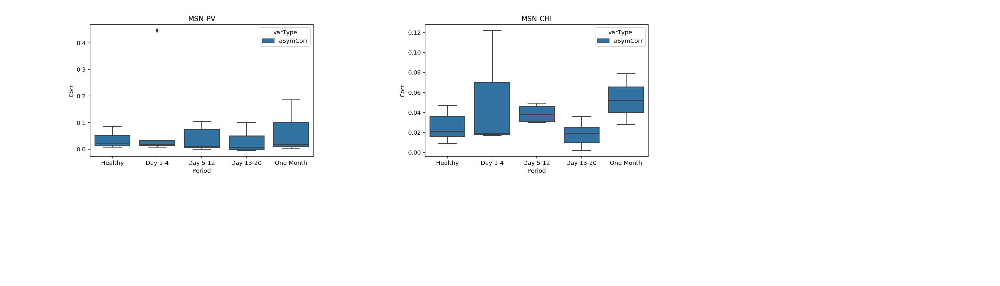

In [157]:
fig, ax = plt.subplots(1,2,figsize=(17.04,4.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24})
df = pd.read_csv('bySessCompareCorr2.csv')
df2 = df.melt(id_vars = ['Mouse','Period','population'],value_vars=['aSymCorr','personF','sASymCorr','sPersonF'],
                         var_name='varType', value_name='Corr').groupby(['Period','Mouse','population','varType']).mean()
df2.reset_index(inplace=True)

g = sns.boxplot(x="Period", y="Corr", hue="varType", data=df2[(df2.population=='MSN-PV')&(df2.varType=='aSymCorr')],
                order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'],ax=ax[0])
g = sns.boxplot(x="Period", y="Corr", hue="varType", data=df2[(df2.population=='MSN-CHI')&(df2.varType=='aSymCorr')],
                order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'],ax=ax[1])

#g = sns.boxplot(x="Period", y="Corr", hue="varType", data=df2[(df2.population=='MSN-MSN')&(df2.varType=='personF')], order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])
ax[0].set_title('MSN-PV')
ax[1].set_title('MSN-CHI')
fig.savefig(figFolder+'figure5a_Interneurons.png')

<IPython.core.display.Javascript object>


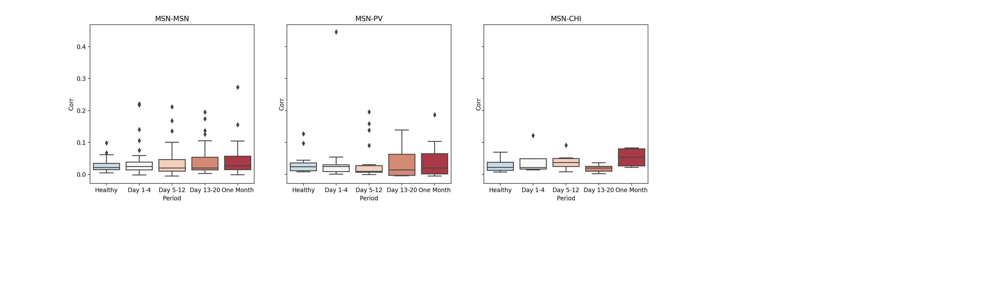

In [21]:

fig, ax = plt.subplots(1,3,figsize=(17.04,4.88), sharey=True)

df = pd.read_csv('bySessCompareCorr2.csv')
df2 = df.melt(id_vars = ['Sess','Period','population'],value_vars=['aSymCorr','personF','sASymCorr','sPersonF'],
                         var_name='varType', value_name='Corr').groupby(['Period','Sess','population','varType']).mean()
df2.reset_index(inplace=True)
with sns.color_palette(colorPallet3):
    g = sns.boxplot(x="Period", y="Corr", ax = ax[0], data=df2[(df2.population=='MSN-MSN')&(df2.varType=='aSymCorr')], order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])
    ax[0].set_title('MSN-MSN')
    g = sns.boxplot(x="Period", y="Corr", ax = ax[1], data=df2[(df2.population=='MSN-PV')&(df2.varType=='aSymCorr')], order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])
    ax[1].set_title('MSN-PV')
    g = sns.boxplot(x="Period", y="Corr", ax = ax[2], data=df2[(df2.population=='MSN-CHI')&(df2.varType=='aSymCorr')], order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])
    ax[2].set_title('MSN-CHI')
#g = sns.boxplot(x="Period", y="Corr", hue="varType", data=df2[(df2.population=='MSN-MSN')&(df2.varType=='personF')], order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])



In [158]:
MSN0 = getData(Files[1],['trace'],period ='Pre', red = False,day = lambda x: x==0)
MSN1 = getData(Files[1],['trace'],period ='Pre', red = False,day = lambda x: (x>0)& (x<5) )
MSN2 = getData(Files[1],['trace'],period ='Pre', red = False,day = lambda x: (x>4)& (x<13) )
MSN3 = getData(Files[1],['trace'],period ='Pre', red = False,day = lambda x: (x>12)& (x<21) )
MSN4 = getData(Files[1],['trace'],period ='Pre', red = False,day = lambda x: x>20 )

/home/dana_z/ssd_2TB/6OHDA/IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value


cleaning up trace data
cleaning up trace data
cleaning up trace data
cleaning up trace data
cleaning up trace data


<IPython.core.display.Javascript object>


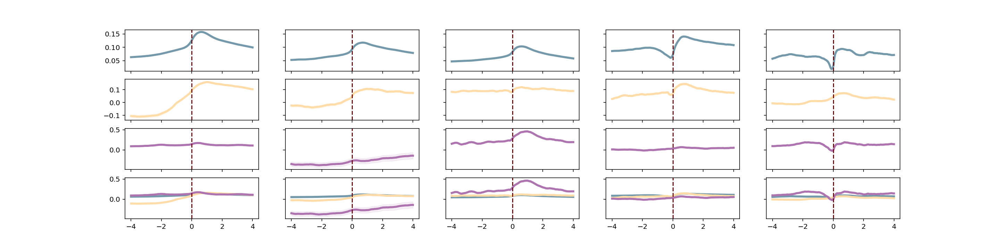

  0%|          | 0/5 [00:00<?, ?it/s]/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:99: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:101: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:102: RuntimeWarning: Mean of empty slice
/home/dana_z/a

In [ ]:
# chol/PV/MSN triggered MSNs 
fig, ax = plt.subplots(4,5,figsize=(20, 5),sharex='col',sharey='row')
#fig2, ax2 = plt.subplots(3,5,figsize=(20, 5),sharex='col',sharey='row')
Colors = CP('creType')

#cond = ['PVdataH','PVdataP','MSNdataH','MSNdataP','CHIdataH','CHIdataP']
cond = ['PV','CHI','MSN']
Period = {'Healthy':0,'Day 1-4':1,'Day 5-12':2,'Day 13-20':3,'One Month':4}

# set the time range to plot: (Assuming all data is in 20Hz, if dataset changes, change this!)
preS = 80 #2s
PostS = 80 # 2s
dt = 0.05

tPlot = np.linspace(-preS*dt,PostS*dt,preS+PostS)
quant = []

for p in tqdm(Period.keys()):
    data = eval('MSN'+str(Period[p]))
    for s in data.keys():
        m = s[:4]
        dff = data[s]['trace']['dff']
        if dff.shape[1] == 1:
            dff = dff.T
        # Z-score dff
        mu = np.mean(dff,axis=1)
        std = np.std(dff,axis=1)
        Zdff = (dff.T-mu.T)/std.T
        Zdff = Zdff.T  
        # Vectors are saved as column vectors so.. transposed to raw vector
        
        Ca = getOnsetOrPeriod(m,s,'Pre','caOnset_Hf')  
        cre = getCreType(Files[1],m)
        numRed = data[s]['trace']['numred']
        # calc MSNs
        for tr in range(numRed,Ca.shape[0]):
            sOnset = Ca[tr,:]==1       
            sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
            if dff.shape[0] ==1 and np.sum(sOnset)>0:
                try:
                    sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                except:
                    sA = np.reshape(sA,(sA.shape[0],1,1))

            if len(sA.shape) > 2:
                sA = np.mean(sA,2)
                if 'sAlignedMSN' not in locals():
    #               print(s+' :',sA.shape)
                    sAlignedMSN = sA
                else:
    #                print(s+' :',sA.shape,sAlignedMSN.shape)
                    sAlignedMSN = np.concatenate((sAlignedMSN,sA),axis=1)
        
        if cre == 'PV':
            for tr in range(0,numRed):
                sOnset = Ca[tr,:]==1       
                sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
                if dff.shape[0] ==1 and np.sum(sOnset)>0:
                    try:
                        sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                    except:
                        sA = np.reshape(sA,(sA.shape[0],1,1))

                if len(sA.shape) > 2:
                    sA = np.mean(sA,2)
                    if 'sAlignedPV' not in locals():
        #               print(s+' :',sA.shape)
                        sAlignedPV = sA
                    else:
        #                print(s+' :',sA.shape,sAlignedMSN.shape)
                        sAlignedPV = np.concatenate((sAlignedPV,sA),axis=1)
        if cre == 'CHI':
            for tr in range(0,numRed):
                sOnset = Ca[tr,:]==1       
                sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
                if dff.shape[0] ==1 and np.sum(sOnset)>0:
                    try:
                        sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                    except:
                        sA = np.reshape(sA,(sA.shape[0],1,1))

                if len(sA.shape) > 2:
                    sA = np.mean(sA,2)
                    if 'sAlignedCHI' not in locals():
        #               print(s+' :',sA.shape)
                        sAlignedCHI = sA
                    else:
        #                print(s+' :',sA.shape,sAlignedMSN.shape)
                        sAlignedCHI = np.concatenate((sAlignedCHI,sA),axis=1)
            
    
    PlotRelativeToOnset(ax[0,Period[p]],sAlignedMSN,tPlot,Color=Colors['MSN'],Label='MSN',mesErr=True) 
    PlotRelativeToOnset(ax[1,Period[p]],sAlignedPV,tPlot,Color=Colors['PV'],Label='PV',mesErr=True)
    PlotRelativeToOnset(ax[2,Period[p]],sAlignedCHI,tPlot,Color=Colors['CHI'],Label='CHI',mesErr=True)
    PlotRelativeToOnset(ax[3,Period[p]],sAlignedMSN,tPlot,Color=Colors['MSN'],Label='MSN',mesErr=True) 
    PlotRelativeToOnset(ax[3,Period[p]],sAlignedPV,tPlot,Color=Colors['PV'],Label='PV',mesErr=True)
    PlotRelativeToOnset(ax[3,Period[p]],sAlignedCHI,tPlot,Color=Colors['CHI'],Label='CHI',mesErr=True)
    
    quant.append({'pre':np.nanmean(sAlignedMSN[preS-10:preS+1,:],axis=0),
                      'post':np.nanmean(sAlignedMSN[preS+1:preS+11,:],axis=0),'cell':'MSN','period':p})
    quant.append({'pre':np.nanmean(sAlignedPV[preS-10:preS+1,:],axis=0),
                      'post':np.nanmean(sAlignedPV[preS+1:preS+11,:],axis=0),'cell':'PV','period':p})
    quant.append({'pre':np.nanmean(sAlignedCHI[preS-10:preS+1,:],axis=0),
                      'post':np.nanmean(sAlignedCHI[preS+1:preS+11,:],axis=0),'cell':'CHI','period':p})

    del sAlignedMSN, sAlignedPV, sAlignedCHI

fig.savefig(figFolder+'extra_MSNAlign2Cell.png',format='png')
fig.savefig(figFolder+'extra_MSNAlign2Cell.svg',format='svg')



In [217]:
qdf = pd.DataFrame(quant)
qdf2 = qdf.set_index(['cell', 'period'])
# the trick
unnested_lst = []
for col in qdf4.columns:
    unnested_lst.append(qdf2[col].apply(pd.Series).stack())
q2 = pd.concat(unnested_lst, axis=1, keys=qdf2.columns)

q2 = q2.reset_index()
q2['ratio'] = q2.apply(lambda x: np.abs((x.post-x.pre)/x.pre) if x.post > x.pre else np.nan, axis=1)
q2.head()

,cell,period,level_2,pre,post
0,MSN,Healthy,0,0.581397,5.322808
1,MSN,Healthy,1,-0.029315,0.115037
2,MSN,Healthy,2,0.102574,-0.161911
3,MSN,Healthy,3,-0.055970,0.257836
4,MSN,Healthy,4,0.436445,0.256154
...,...,...,...,...,...
6725347,CHI,One Month,601,1.001779,1.518988
6725348,CHI,One Month,602,0.379407,1.138219
6725349,CHI,One Month,603,0.536620,0.726151
6725350,CHI,One Month,604,0.267964,0.079515


In [234]:
g = sns.catplot(x="period", y="ratio", col="cell", kind="swarm", 
                data=q2,order =['Healthy','Day 1-4','Day 5-12','Day 13-20','One Month'])#,showfliers=False )
g.despine(left=True)


<IPython.core.display.Javascript object>

KeyboardInterrupt: 

In [162]:
a=1

In [5]:
#  for all mice - by period
PV0 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='PV',red = True,day = lambda x: x==0)
PV1 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='PV',red = True,day = lambda x: (x>0)& (x<5) )
PV2 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='PV',red = True,day = lambda x: (x>4)& (x<13) )
PV3 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='PV',red = True,day = lambda x: (x>12)& (x<21) )
PV4 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='PV',red = True,day = lambda x: x>20 )

CHI0 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='CHI',red = True,day = lambda x: x==0)
CHI1 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='CHI',red = True,day = lambda x: (x>0)& (x<5) )
CHI2 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='CHI',red = True,day = lambda x: (x>4)& (x<13) )
CHI3 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='CHI',red = True,day = lambda x: (x>12)& (x<21) )
CHI4 = getData(Files[1],['speed','rot','trace'],period ='Pre', cre='CHI',red = True,day = lambda x: x>20 )

MSN0 = getData(Files[1],['speed','rot','trace'],period ='Pre', red = False,day = lambda x: x==0)
MSN1 = getData(Files[1],['speed','rot','trace'],period ='Pre', red = False,day = lambda x: (x>0)& (x<5) )
MSN2 = getData(Files[1],['speed','rot','trace'],period ='Pre', red = False,day = lambda x: (x>4)& (x<13) )
MSN3 = getData(Files[1],['speed','rot','trace'],period ='Pre', red = False,day = lambda x: (x>12)& (x<21) )
MSN4 = getData(Files[1],['speed','rot','trace'],period ='Pre', red = False,day = lambda x: x>20 )

/home/dana_z/ssd_2TB/6OHDA/IO.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  dff = hf[m][s]['traces']['dff'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:245: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  rot = hf[m][s]['mvmt']['rotation'].value


cleaning up trace data
I deleted session: 7584_day0
I deleted session: 8430_BaselineA
cleaning up trace data
cleaning up speed data
cleaning up rot data
cleaning up trace data
I deleted session: 8430_day1
cleaning up trace data
cleaning up speed data
cleaning up rot data
cleaning up trace data
I deleted session: 4539_day11
I deleted session: 4539_day5
I deleted session: 8430_day9
I deleted session: 8803_day10
I deleted session: 8803_day12
I deleted session: 8803_day5
cleaning up trace data
cleaning up speed data
cleaning up rot data
cleaning up trace data
I deleted session: 1236_day19L
I deleted session: 8430_day15A
cleaning up trace data
cleaning up speed data
cleaning up rot data
cleaning up trace data
I deleted session: 7909_day30A
I deleted session: 8803_day30A
cleaning up trace data
cleaning up speed data
cleaning up rot data
cleaning up trace data
I deleted session: 1208_BaselineA
I deleted session: 1222_BaselineA
I deleted session: 1253_BaselineA
I deleted session: 1253_Baseline

<IPython.core.display.Javascript object>


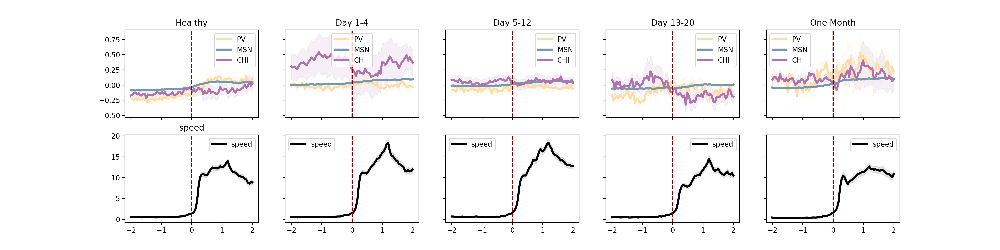

/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:65: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:66: RuntimeWarning: Mean of empty slice
/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] inste

In [8]:

fig, ax = plt.subplots(2,5,figsize=(20, 5),sharex=True,sharey='row')
Colors = CP('creType')

#cond = ['PVdataH','PVdataP','MSNdataH','MSNdataP','CHIdataH','CHIdataP']
cond = ['PV','MSN','CHI']
Period = {'Healthy':0,'Day 1-4':1,'Day 5-12':2,'Day 13-20':3,'One Month':4}

# set the time range to plot: (Assuming all data is in 20Hz, if dataset changes, change this!)
preS = 40 #2s
PostS = 40 # 2s
dt = 0.05

tPlot = np.linspace(-preS*dt,PostS*dt,preS+PostS)
quant = []

for p in Period.keys():
    for c in cond:
        data = eval(c+str(Period[p]))
        for s in data.keys():
            m = s[:4]
            speed = data[s]['speed']['speed'].T
            dff = data[s]['trace']['dff']
            # Vectors are saved as column vectors so.. transposed to raw vector
            if dff.shape[1] == 1:
                dff = dff.T
            # Z-score dff
            mu = np.mean(dff,axis=1)
            std = np.std(dff,axis=1)
            Zdff = (dff.T-mu.T)/std.T
            Zdff = Zdff.T  
#             Zdff = dff


    #         if m not in betaMice:
    #             continue

            sOnset = getOnsetOrPeriod(m,s,'Pre','mvmtOnset2')        
            sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
            if dff.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                except:
                    sA = np.reshape(sA,(sA.shape[0],1,1))

            if len(sA.shape) > 2:
                sA = np.mean(sA,2)
                if 'sAligned' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned = sA
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned = np.concatenate((sAligned,sA),axis=1)

            if c == 'MSN':
                    sS = alignToOnset(speed, sOnset, winPost=PostS,winPre=preS)
                    if sS.ndim > 1:
                        if 'sAlignedS' not in locals():
            #           print(s+' :',sA.shape)
                            sAlignedS = sS
                        else:
        #                print(s+' :',cAs.shape,caAlignedS.shape)
                            sAlignedS = np.concatenate((sAlignedS,sS),axis=1) 
        
        quant.append({'pre':np.nanmean(sAligned[:preS+1,:],axis=0),
                      'post':np.nanmean(sAligned[preS+1:,:],axis=0),'cre':c,'period':p})
#        sAligned = sAligned-np.mean(sAligned[:preS+1,:],axis=0)
        PlotRelativeToOnset(ax[0,Period[p]],sAligned,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        if c== 'MSN':
            PlotRelativeToOnset(ax[1,Period[p]],sAlignedS,tPlot,Color='black',Label='speed',mesErr=True)
            del sAlignedS
        del sAligned
    ax[0,Period[p]].set_title(p)
    ax[0,Period[p]].legend(fontsize=10)
    ax[1,Period[p]].legend(fontsize=10)
ax[1,0].set_title('speed')

fig.savefig(figFolder+'flourescent_aligned_to_Speed2_zScore.png',transparent=True,format='png')
# #fig2, ax2 = plt.subplots(1,2,sharex='col',sharey='row')


<IPython.core.display.Javascript object>


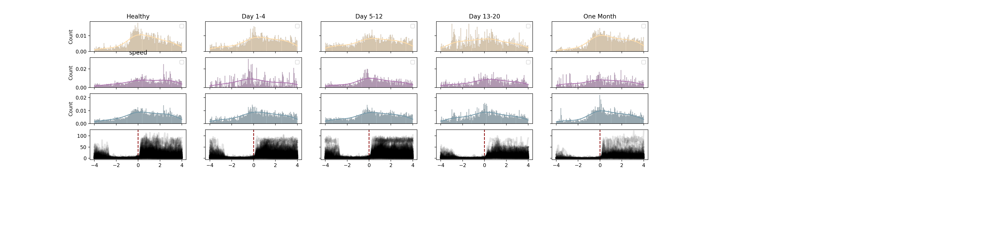

  0%|          | 0/5 [00:00<?, ?it/s]

PV Healthy 0.0
CHI Healthy 0.0


No handles with labels found to put in legend.
No handles with labels found to put in legend.
 20%|██        | 1/5 [00:03<00:12,  3.15s/it]

MSN Healthy 0.0
PV Day 1-4 0.0
CHI Day 1-4 0.0


No handles with labels found to put in legend.
No handles with labels found to put in legend.
 40%|████      | 2/5 [00:04<00:08,  2.70s/it]

MSN Day 1-4 0.08571428571428572
PV Day 5-12 0.10344827586206896
CHI Day 5-12 0.0
MSN Day 5-12 0.046153846153846156


No handles with labels found to put in legend.
No handles with labels found to put in legend.
 60%|██████    | 3/5 [00:07<00:05,  2.85s/it]

PV Day 13-20 0.3333333333333333
CHI Day 13-20 0.0


No handles with labels found to put in legend.
No handles with labels found to put in legend.
 80%|████████  | 4/5 [00:09<00:02,  2.54s/it]

MSN Day 13-20 0.10810810810810811
PV One Month 0.16666666666666666
CHI One Month 0.0


No handles with labels found to put in legend.
No handles with labels found to put in legend.
100%|██████████| 5/5 [00:11<00:00,  2.22s/it]

MSN One Month 0.08695652173913043


Text(0.5, 1.0, 'speed')

In [43]:
fig, ax = plt.subplots(4,5,figsize=(20, 5),sharex='col',sharey='row')
Colors = CP('creType')

#cond = ['PVdataH','PVdataP','MSNdataH','MSNdataP','CHIdataH','CHIdataP']
cond = ['PV','CHI','MSN']
Period = {'Healthy':0,'Day 1-4':1,'Day 5-12':2,'Day 13-20':3,'One Month':4}

# set the time range to plot: (Assuming all data is in 20Hz, if dataset changes, change this!)
preS = 80 #2s
PostS = 80 # 2s
dt = 0.05

tPlot = np.linspace(-preS*dt,PostS*dt,preS+PostS)
quant = []

for p in tqdm(Period.keys()):
    axInd = 0;
    for c in cond:
        data = eval(c+str(Period[p]))
        for s in data.keys():
            m = s[:4]
            Ca = getOnsetOrPeriod(m,s,'Pre','caOnset_Hf')
            dCa = Ca[:,1:]-Ca[:,:-1]
            dCa[dCa==-1] = 0;
            Zdff = np.sum(dCa,axis=0)
            speed = data[s]['speed']['speed'].T
            # calc MSNs
            sOnset = getOnsetOrPeriod(m,s,'Pre','mvmtOnset2')        
            sA = alignToOnset(Zdff, sOnset, winPost=PostS,winPre=preS)  
            if Zdff.shape[1] ==1 and np.sum(sOnset)>0:

                try:
                    sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                except:
                    sA = np.reshape(sA,(sA.shape[0],1,1))

            if len(sA.shape) > 2:
                sA = np.mean(sA,2)
                if 'sAligned' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned = sA
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned = np.concatenate((sAligned,sA),axis=1)

            if c == 'MSN':
                sS = alignToOnset(speed, sOnset, winPost=PostS,winPre=preS)
                if sS.ndim > 1:
                    if 'sAlignedS' not in locals():
        #           print(s+' :',sA.shape)
                        sAlignedS = sS
                    else:
    #                print(s+' :',cAs.shape,caAlignedS.shape)
                        sAlignedS = np.concatenate((sAlignedS,sS),axis=1) 
        
        quant.append({'pre':np.nanmean(sAligned[:preS+1,:],axis=0),
                      'post':np.nanmean(sAligned[preS+1:,:],axis=0),'cre':c,'period':p})
#        sAligned = sAligned-np.mean(sAligned[:preS+1,:],axis=0)
#        ax[axInd,Period[p]].hist(tPlot,bins = tPlot,weights = np.sum(sAligned,axis=1)/np.sum(sAligned),
#                                Color=Colors[c],Label=c)
        sns.histplot(x=tPlot,weights=np.sum(sAligned,axis=1)/np.sum(sAligned),ax=ax[axInd,Period[p]],color=Colors[c],kde=True,bins=len(tPlot))
#        print(np.max(np.sum(sAligned,axis=1))/np.sum(sAligned))
#        sw = sAligned
        axInd = axInd+1;
        print(c,p,np.sum(np.nansum(sAligned,axis=0)==0)/sAligned.shape[1])
        if c== 'MSN':
            PlotRelativeToOnset(ax[3,Period[p]],sAlignedS,tPlot,Color='black',Label='speed',mesErr=True)
            ax[3,Period[p]].plot(tPlot,sAlignedS,linewidth=3,color='black',label='speed',alpha = .1)
            del sAlignedS
        del sAligned
    ax[0,Period[p]].set_title(p)
    ax[0,Period[p]].legend(fontsize=10)
    ax[1,Period[p]].legend(fontsize=10)
ax[1,0].set_title('speed')

#fig.savefig(figFolder+'cells_aligned_to_Speed2_hist.png',transparent=True,format='png')

In [27]:
fig, ax = plt.subplots(4,5,figsize=(20, 5),sharex='col',sharey='row')
fig2, ax2 = plt.subplots(4,5,figsize=(20, 5),sharex='col',sharey='row')
Colors = CP('creType')

#cond = ['PVdataH','PVdataP','MSNdataH','MSNdataP','CHIdataH','CHIdataP']
cond = ['PV','MSN','CHI']
Period = {'Healthy':0,'Day 1-4':1,'Day 5-12':2,'Day 13-20':3,'One Month':4}

# set the time range to plot: (Assuming all data is in 20Hz, if dataset changes, change this!)
preS = 80 #2s
PostS = 80 # 2s
dt = 0.05

tPlot = np.linspace(-preS*dt,PostS*dt,preS+PostS)
quant = []

for p in Period.keys():
    axInd = 0;
    for c in cond:
        data = eval(c+str(Period[p]))
        for s in data.keys():
            m = s[:4]
            speed = data[s]['rot']['rot'].T
            Ca = getOnsetOrPeriod(m,s,'Pre','caOnset_Hf')
            dCa = Ca[:,1:]-Ca[:,:-1]
            dCa[dCa==-1] = 0;
            Zdff = np.sum(dCa,axis=0,keepdims=True)

            sOnset = getOnsetOrPeriod(m,s,'Pre','antiClockWiseOnset')        
            sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
            if Zdff.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                except:
                    sA = np.reshape(sA,(sA.shape[0],1,1))

            if len(sA.shape) > 2:
                sA = np.mean(sA,2)
                if 'sAligned' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned = sA
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned = np.concatenate((sAligned,sA),axis=1)
        
            sOnset2 = getOnsetOrPeriod(m,s,'Pre','clockWiseOnset')        
            sA2 = alignToOnset(Zdff.T, sOnset2, winPost=PostS,winPre=preS)  
            if Zdff.shape[0] ==1 and np.sum(sOnset2)>0:

                try:
                    sA2 = np.reshape(sA2,(sA2.shape[0],1,sA2.shape[1]))
                except:
                    sA2 = np.reshape(sA2,(sA2.shape[0],1,1))

            if len(sA2.shape) > 2:
                sA2 = np.mean(sA2,2)
                if 'sAligned2' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned2 = sA2
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned2 = np.concatenate((sAligned2,sA2),axis=1)

            if c == 'MSN':
                sS = alignToOnset(speed, sOnset, winPost=PostS,winPre=preS)
                if sS.ndim > 1:
                    if 'sAlignedS' not in locals():
        #           print(s+' :',sA.shape)
                        sAlignedS = sS
                    else:
    #                print(s+' :',cAs.shape,caAlignedS.shape)
                        sAlignedS = np.concatenate((sAlignedS,sS),axis=1) 
                sS2 = alignToOnset(speed, sOnset2, winPost=PostS,winPre=preS)
                if sS2.ndim > 1:
                    if 'sAlignedS2' not in locals():
        #           print(s+' :',sA.shape)
                        sAlignedS2 = sS2
                    else:
    #                print(s+' :',cAs.shape,caAlignedS.shape)
                        sAlignedS2 = np.concatenate((sAlignedS2,sS2),axis=1) 
        
        quant.append({'pre':np.nanmean(sAligned[:preS+1,:],axis=0),
                      'post':np.nanmean(sAligned[preS+1:,:],axis=0),'cre':c,'period':p,'dir':'antiClockwise'})
        quant.append({'pre':np.nanmean(sAligned2[:preS+1,:],axis=0),
                      'post':np.nanmean(sAligned2[preS+1:,:],axis=0),'cre':c,'period':p,'dir':'clockwise'})
        sns.histplot(x=tPlot,bins = len(tPlot),weights = np.nansum(sAligned2,axis=1)/np.nansum(sAligned2),
                        Color=Colors[c],Label=c,ax = ax2[axInd,Period[p]],kde=True)
        sns.histplot(x=tPlot,bins = len(tPlot),weights = np.nansum(sAligned,axis=1)/np.nansum(sAligned),
                        Color=Colors[c],Label=c,ax = ax[axInd,Period[p]],kde=True)
        axInd = axInd+1;
        print('contra: ',c,p,np.sum(np.nansum(sAligned2,axis=0)==0)/sAligned2.shape[1])
        print('ipsi: ',c,p,np.sum(np.nansum(sAligned,axis=0)==0)/sAligned.shape[1])
        if c== 'MSN':
            PlotRelativeToOnset(ax2[3,Period[p]],sAlignedS,tPlot,Color='black',Label='ipsileteral-rot',mesErr=True)
            PlotRelativeToOnset(ax[3,Period[p]],sAlignedS2,tPlot,Color='black',Label='contrlateral-rot',mesErr=True)
            del sAlignedS
            del sAlignedS2
        del sAligned
        del sAligned2
    ax[0,Period[p]].set_title(p)
    ax2[3,0].set_ylabel('ipsileteral')
    ax[3,0].set_ylabel('contralateral')
    #ax[0,0].legend(fontsize=10,loc='upper left')
#    ax[1,Period[p]].legend(fontsize=10)
ax[1,0].set_title('rot')

fig2.savefig(figFolder+'cells_aligned_to_ipsiRotation_hist.png',transparent=True,format='png')
fig.savefig(figFolder+'cells_aligned_to_contRotation_hist.png',transparent=True,format='png')

# #fig2, ax2 = plt.subplots(1,2,sharex='col',sharey='row')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases la

contra:  PV Healthy 0.0
ipsi:  PV Healthy 0.0


/home/dana_z/ssd_2TB/6OHDA/utils.py:245: UserWarning: data is shorter than onset. Trancuating onset vector
  warnings.warn("data is shorter than onset. Trancuating onset vector")
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/pytho

contra:  MSN Healthy 0.022727272727272728
ipsi:  MSN Healthy 0.0


/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases la

contra:  CHI Healthy 0.0
ipsi:  CHI Healthy 0.0


/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases la

contra:  PV Day 1-4 0.0
ipsi:  PV Day 1-4 0.0


/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases la

contra:  MSN Day 1-4 0.3
ipsi:  MSN Day 1-4 0.18181818181818182


/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/ssd_2TB/6OHDA/utils.py:245: UserWarning: data is shorter than onset. Trancuating onset vector
  warnings.warn("data is shorter than onset. Trancuating onset vector")
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were depre

contra:  CHI Day 1-4 0.2
ipsi:  CHI Day 1-4 0.0


/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/ssd_2TB/6OHDA/utils.py:245: UserWarning: data is shorter than onset. Trancuating onset vector
  warnings.warn("data is shorter than onset. Trancuating onset vector")
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were depre

contra:  PV Day 5-12 0.0
ipsi:  PV Day 5-12 0.0


/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases la

contra:  MSN Day 5-12 0.12903225806451613
ipsi:  MSN Day 5-12 0.05714285714285714


/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases la

contra:  CHI Day 5-12 0.09090909090909091
ipsi:  CHI Day 5-12 0.06666666666666667


/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/ssd_2TB/6OHDA/utils.py:245: UserWarning: data is shorter than onset. Trancuating onset vector
  warnings.warn("data is shorter than onset. Trancuating onset vector")
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were depre

contra:  PV Day 13-20 0.16666666666666666
ipsi:  PV Day 13-20 0.0


/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases la

contra:  MSN Day 13-20 0.09090909090909091
ipsi:  MSN Day 13-20 0.0


/home/dana_z/ssd_2TB/6OHDA/utils.py:245: UserWarning: data is shorter than onset. Trancuating onset vector
  warnings.warn("data is shorter than onset. Trancuating onset vector")
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/pytho

contra:  CHI Day 13-20 0.0
ipsi:  CHI Day 13-20 0.0


/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/ssd_2TB/6OHDA/utils.py:245: UserWarning: data is shorter than onset. Trancuating onset vector
  warnings.warn("data is shorter than onset. Trancuating onset vector")
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were depre

contra:  PV One Month 0.0
ipsi:  PV One Month 0.0


/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/ssd_2TB/6OHDA/utils.py:245: UserWarning: data is shorter than onset. Trancuating onset vector
  warnings.warn("data is shorter than onset. Trancuating onset vector")
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:83: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:84: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecatio

contra:  MSN One Month 0.0
ipsi:  MSN One Month 0.08695652173913043


/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/ssd_2TB/6OHDA/utils.py:245: UserWarning: data is shorter than onset. Trancuating onset vector
  warnings.warn("data is shorter than onset. Trancuating onset vector")
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], color=color, **plot_kws)
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:560: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  **artist_kws,
/home/dana_z/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:508: MatplotlibDeprecationWarning: Case-insensitive properties were depre

contra:  CHI One Month 0.0
ipsi:  CHI One Month 0.0


<IPython.core.display.Javascript object>


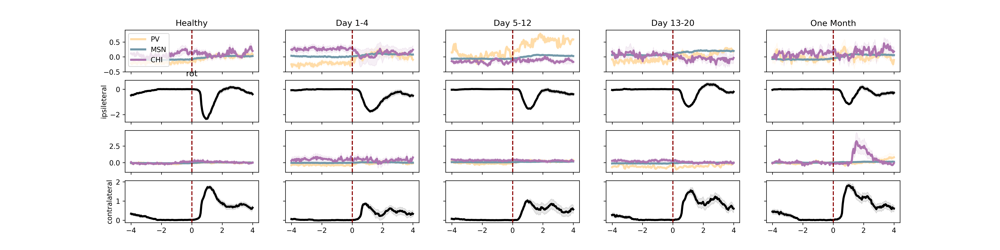

/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:154: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:91: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:92: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:93: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:94: RuntimeWarning: Mean of empty slice
/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/num

/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:91: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:92: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:93: RuntimeWarning: Mean of empty slice
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:94: RuntimeWarning: Mean of empty slice
/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:154: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipy

In [59]:
fig, ax = plt.subplots(4,5,figsize=(20, 5),sharex='col',sharey='row')
Colors = CP('creType')

#cond = ['PVdataH','PVdataP','MSNdataH','MSNdataP','CHIdataH','CHIdataP']
cond = ['PV','MSN','CHI']
Period = {'Healthy':0,'Day 1-4':1,'Day 5-12':2,'Day 13-20':3,'One Month':4}

# set the time range to plot: (Assuming all data is in 20Hz, if dataset changes, change this!)
preS = 80 #2s
PostS = 80 # 2s
dt = 0.05

tPlot = np.linspace(-preS*dt,PostS*dt,preS+PostS)
quant = []

for p in Period.keys():
    for c in cond:
        data = eval(c+str(Period[p]))
        for s in data.keys():
            m = s[:4]
            speed = data[s]['rot']['rot'].T
            dff = data[s]['trace']['dff']
            # Vectors are saved as column vectors so.. transposed to raw vector
            if dff.shape[1] == 1:
                dff = dff.T
            # Z-score dff
            mu = np.mean(dff,axis=1)
            std = np.std(dff,axis=1)
            Zdff = (dff.T-mu.T)/std.T
            Zdff = Zdff.T  
#            Zdff = dff


    #         if m not in betaMice:
    #             continue

            sOnset = getOnsetOrPeriod(m,s,'Pre','antiClockWiseOnset')        
            sA = alignToOnset(Zdff.T, sOnset, winPost=PostS,winPre=preS)  
            if dff.shape[0] ==1 and np.sum(sOnset)>0:

                try:
                    sA = np.reshape(sA,(sA.shape[0],1,sA.shape[1]))
                except:
                    sA = np.reshape(sA,(sA.shape[0],1,1))

            if len(sA.shape) > 2:
                sA = np.mean(sA,2)
                if 'sAligned' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned = sA
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned = np.concatenate((sAligned,sA),axis=1)
        
            sOnset2 = getOnsetOrPeriod(m,s,'Pre','clockWiseOnset')        
            sA2 = alignToOnset(Zdff.T, sOnset2, winPost=PostS,winPre=preS)  
            if dff.shape[0] ==1 and np.sum(sOnset2)>0:

                try:
                    sA2 = np.reshape(sA2,(sA2.shape[0],1,sA2.shape[1]))
                except:
                    sA2 = np.reshape(sA2,(sA2.shape[0],1,1))

            if len(sA2.shape) > 2:
                sA2 = np.mean(sA2,2)
                if 'sAligned2' not in locals():
    #               print(s+' :',sA.shape)
                    sAligned2 = sA2
                else:
    #                print(s+' :',sA.shape,sAligned.shape)
                    sAligned2 = np.concatenate((sAligned2,sA2),axis=1)

            if c == 'MSN':
                sS = alignToOnset(speed, sOnset, winPost=PostS,winPre=preS)
                if sS.ndim > 1:
                    if 'sAlignedS' not in locals():
        #           print(s+' :',sA.shape)
                        sAlignedS = sS
                    else:
    #                print(s+' :',cAs.shape,caAlignedS.shape)
                        sAlignedS = np.concatenate((sAlignedS,sS),axis=1) 
                sS2 = alignToOnset(speed, sOnset2, winPost=PostS,winPre=preS)
                if sS2.ndim > 1:
                    if 'sAlignedS2' not in locals():
        #           print(s+' :',sA.shape)
                        sAlignedS2 = sS2
                    else:
    #                print(s+' :',cAs.shape,caAlignedS.shape)
                        sAlignedS2 = np.concatenate((sAlignedS2,sS2),axis=1) 
        
        quant.append({'pre':np.nanmean(sAligned[:preS+1,:],axis=0),
                      'post':np.nanmean(sAligned[preS+1:,:],axis=0),'cre':c,'period':p,'dir':'antiClockwise'})
        quant.append({'pre':np.nanmean(sAligned2[:preS+1,:],axis=0),
                      'post':np.nanmean(sAligned2[preS+1:,:],axis=0),'cre':c,'period':p,'dir':'clockwise'})
#        sAligned = sAligned-np.mean(sAligned[:preS+1,:],axis=0)
#        sAligned2 = sAligned2-np.mean(sAligned2[:preS+1,:],axis=0)
        PlotRelativeToOnset(ax[0,Period[p]],sAligned,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        PlotRelativeToOnset(ax[2,Period[p]],sAligned2,tPlot,Color=Colors[c],Label=c,mesErr=True) 
        if c== 'MSN':
            PlotRelativeToOnset(ax[1,Period[p]],sAlignedS,tPlot,Color='black',Label='ipsileteral-rot',mesErr=True)
            PlotRelativeToOnset(ax[3,Period[p]],sAlignedS2,tPlot,Color='black',Label='contrlateral-rot',mesErr=True)
            del sAlignedS
            del sAlignedS2
        del sAligned
        del sAligned2
    ax[0,Period[p]].set_title(p)
    ax[1,0].set_ylabel('ipsileteral')
    ax[3,0].set_ylabel('contralateral')
    ax[0,0].legend(fontsize=10,loc='upper left')
#    ax[1,Period[p]].legend(fontsize=10)
ax[1,0].set_title('rot')

fig.savefig(figFolder+'flourescent_aligned_to_rotation_zScore.png',transparent=True,format='png')
# #fig2, ax2 = plt.subplots(1,2,sharex='col',sharey='row')


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:24: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.


<IPython.core.display.Javascript object>


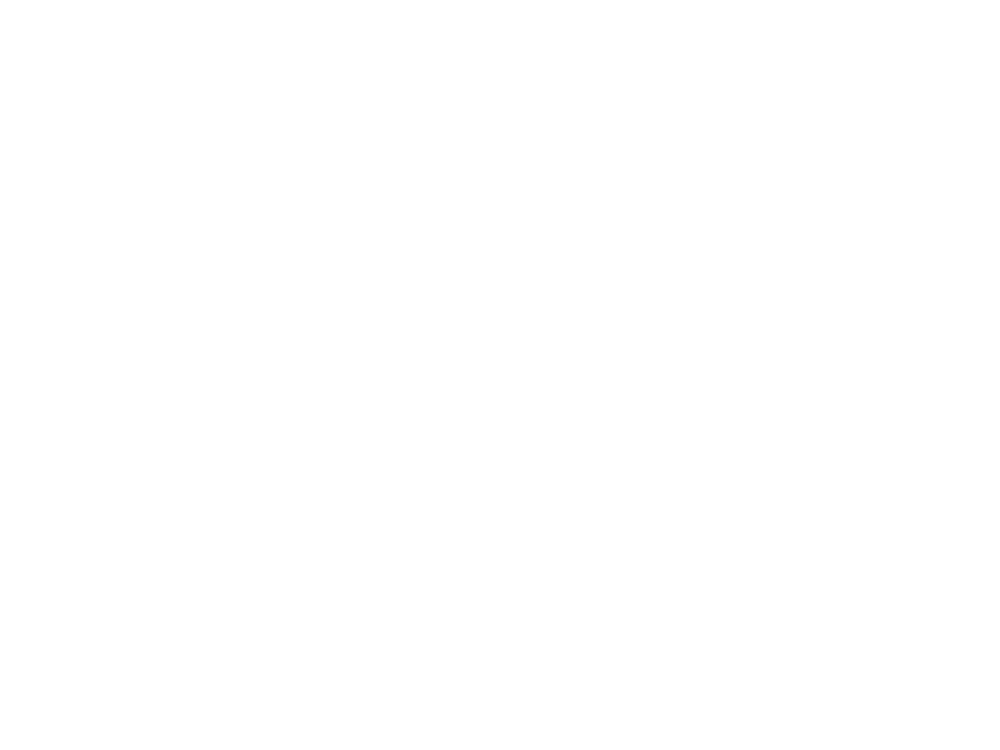

<IPython.core.display.Javascript object>


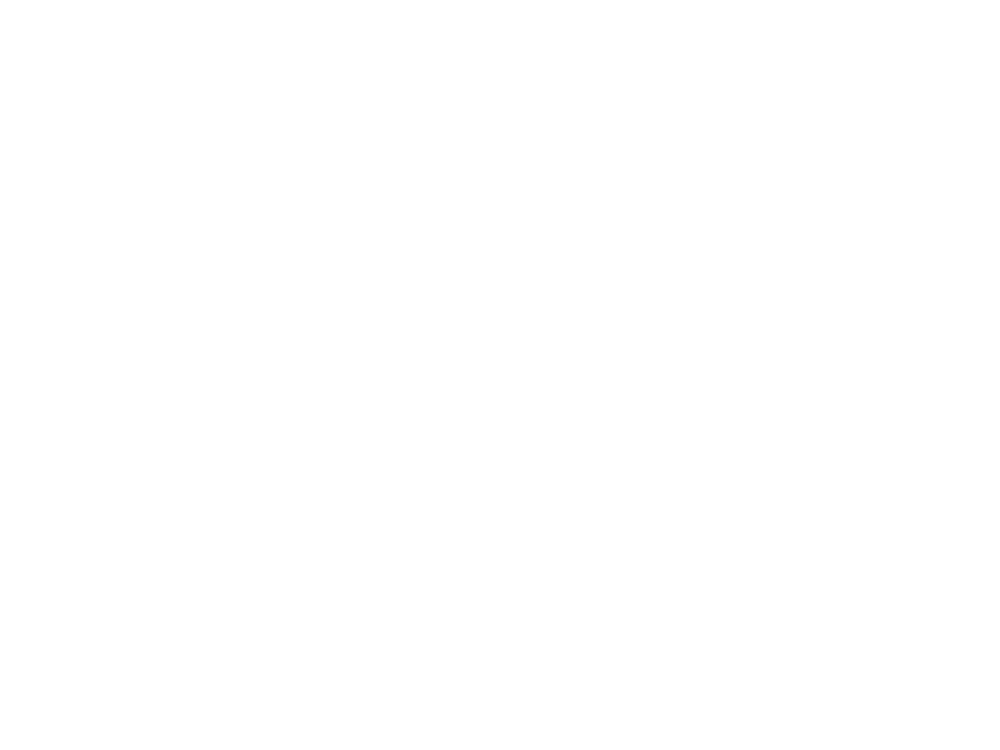

<IPython.core.display.Javascript object>


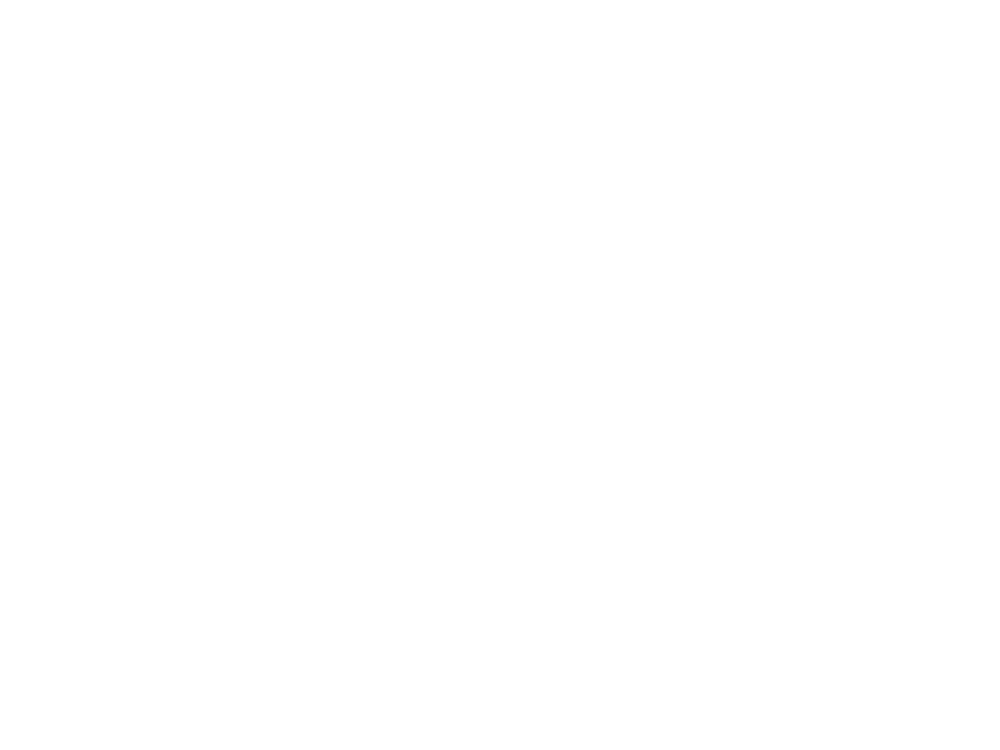

<IPython.core.display.Javascript object>


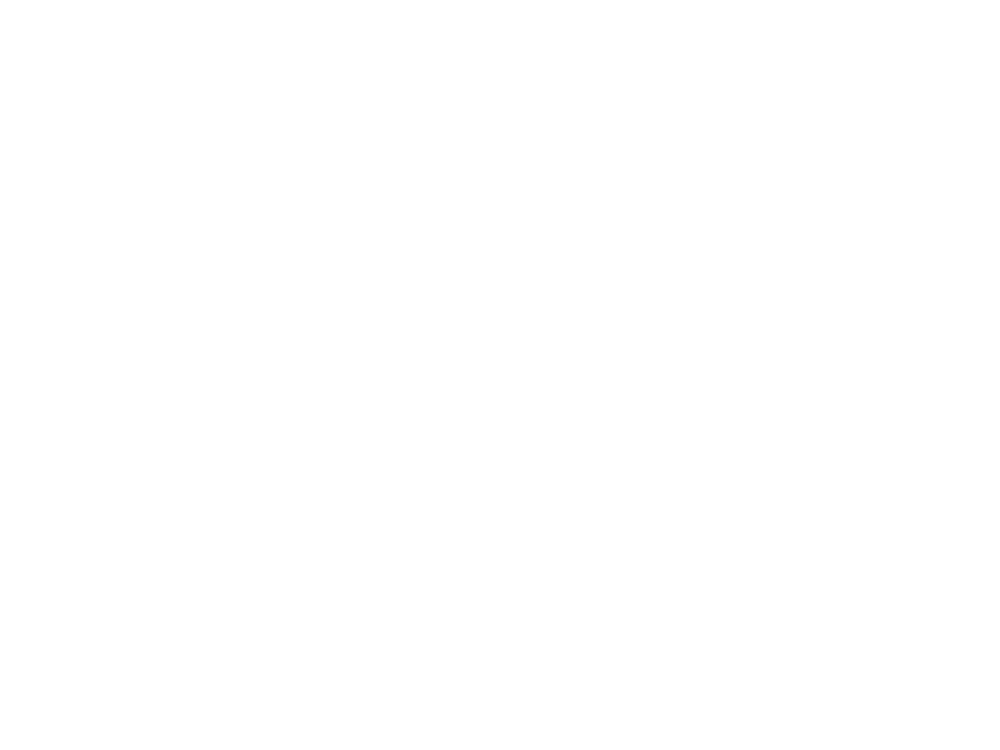

<IPython.core.display.Javascript object>


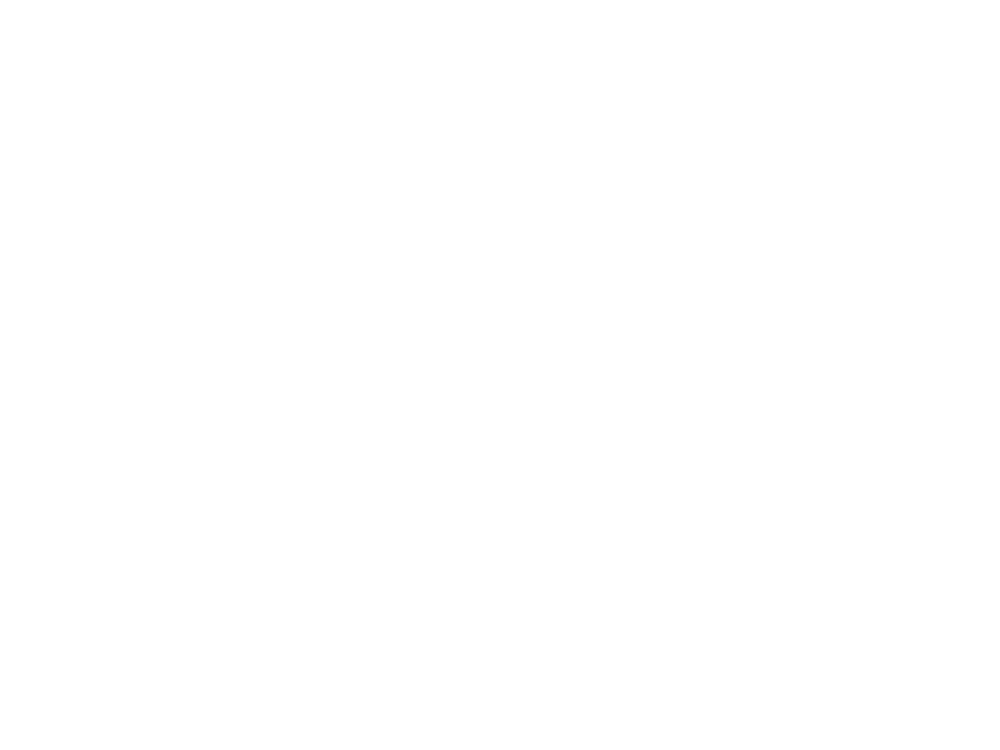

<IPython.core.display.Javascript object>


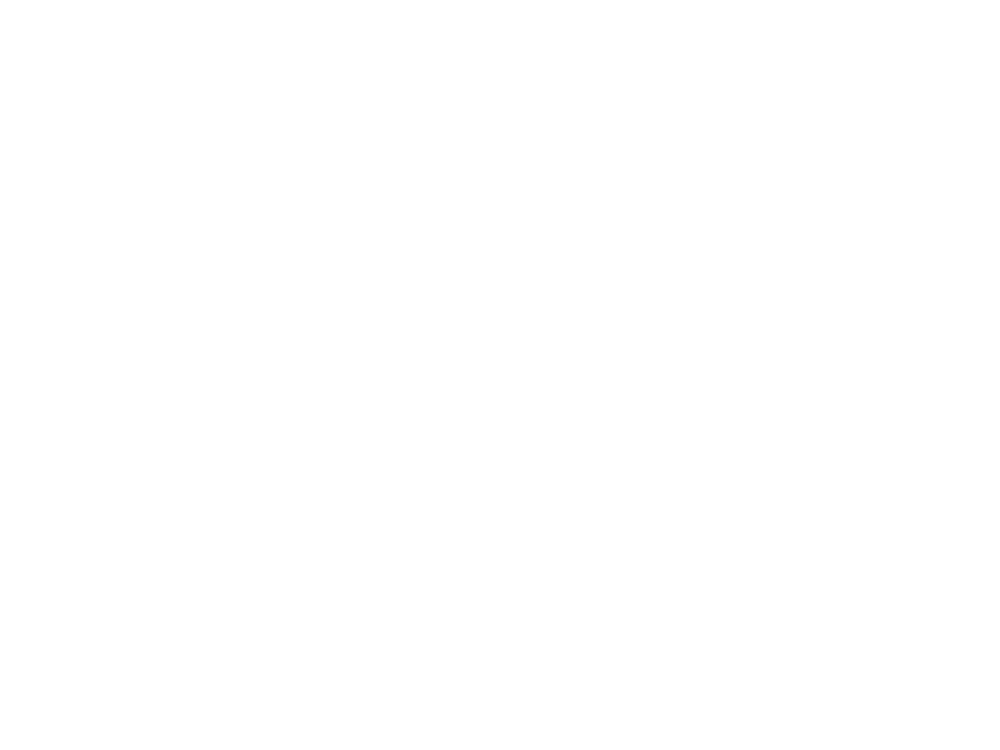

<IPython.core.display.Javascript object>


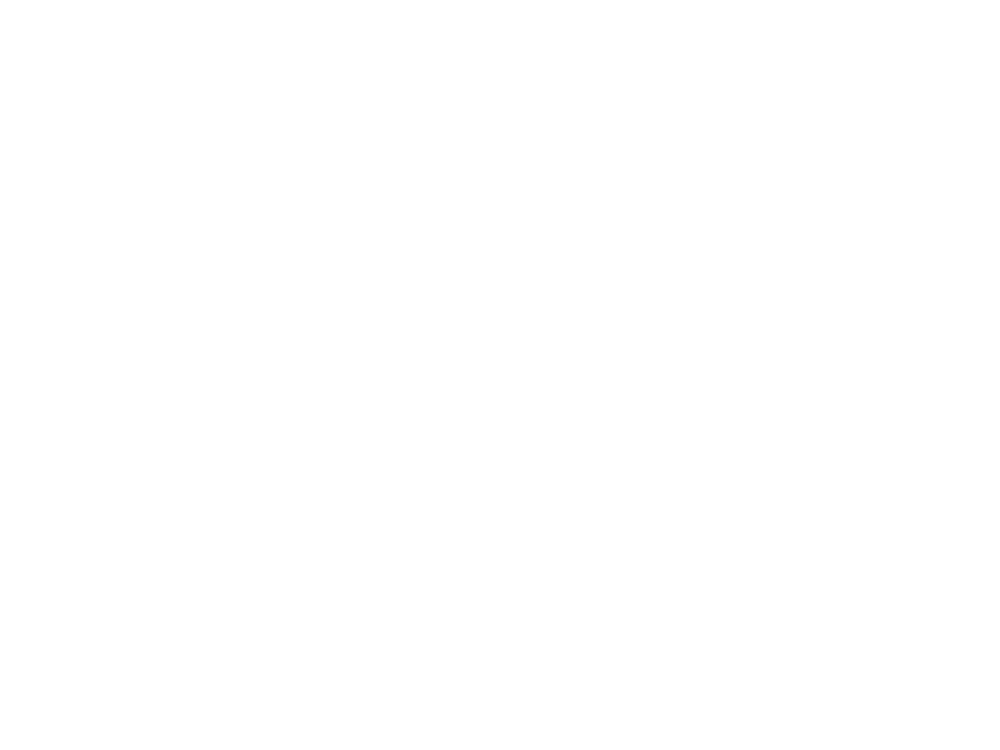

<IPython.core.display.Javascript object>


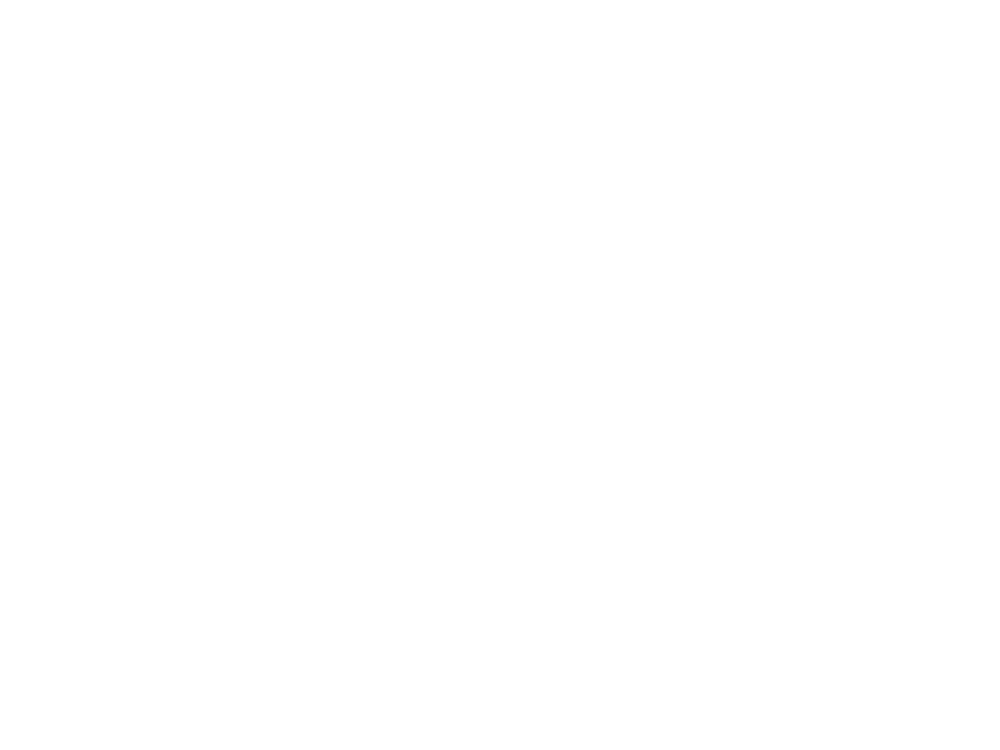

<IPython.core.display.Javascript object>


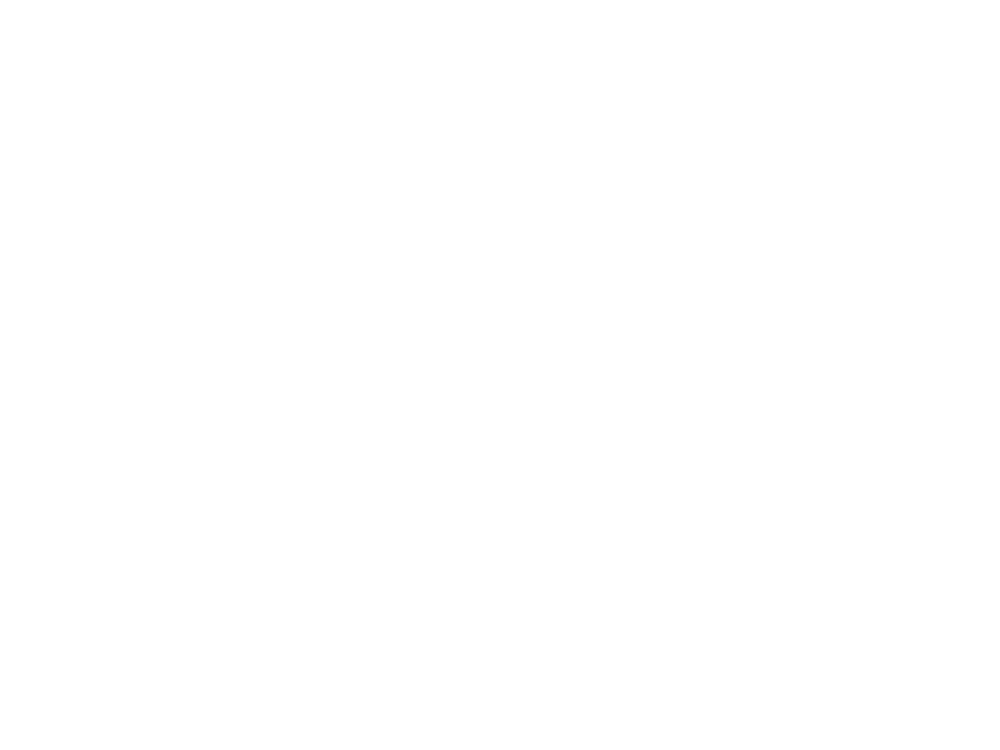

<IPython.core.display.Javascript object>


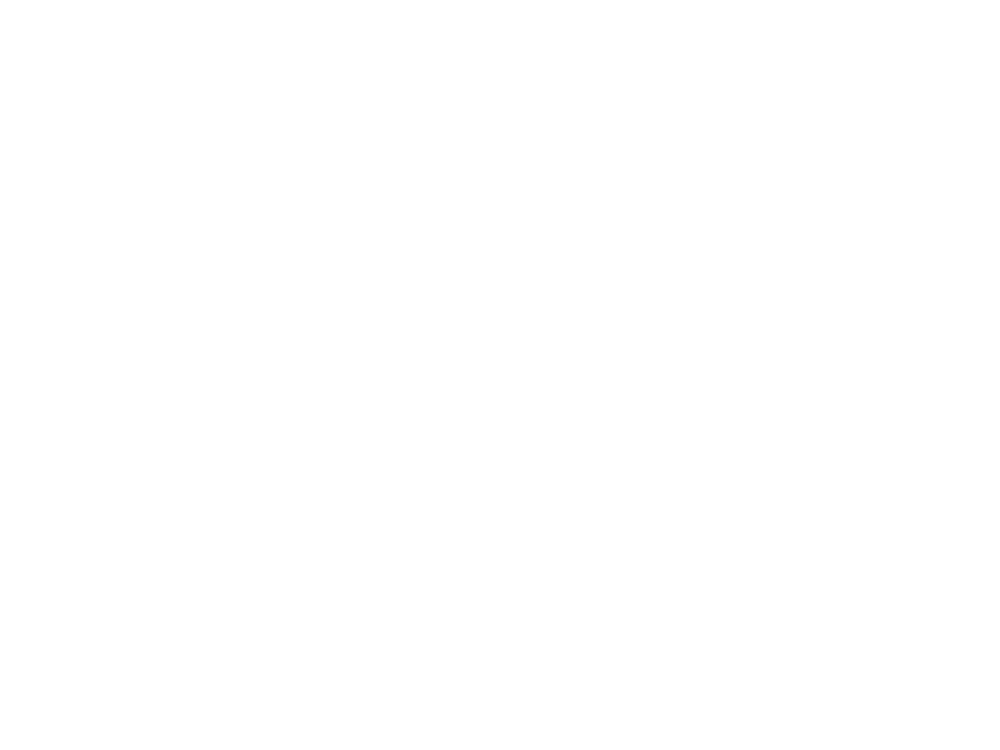

<IPython.core.display.Javascript object>


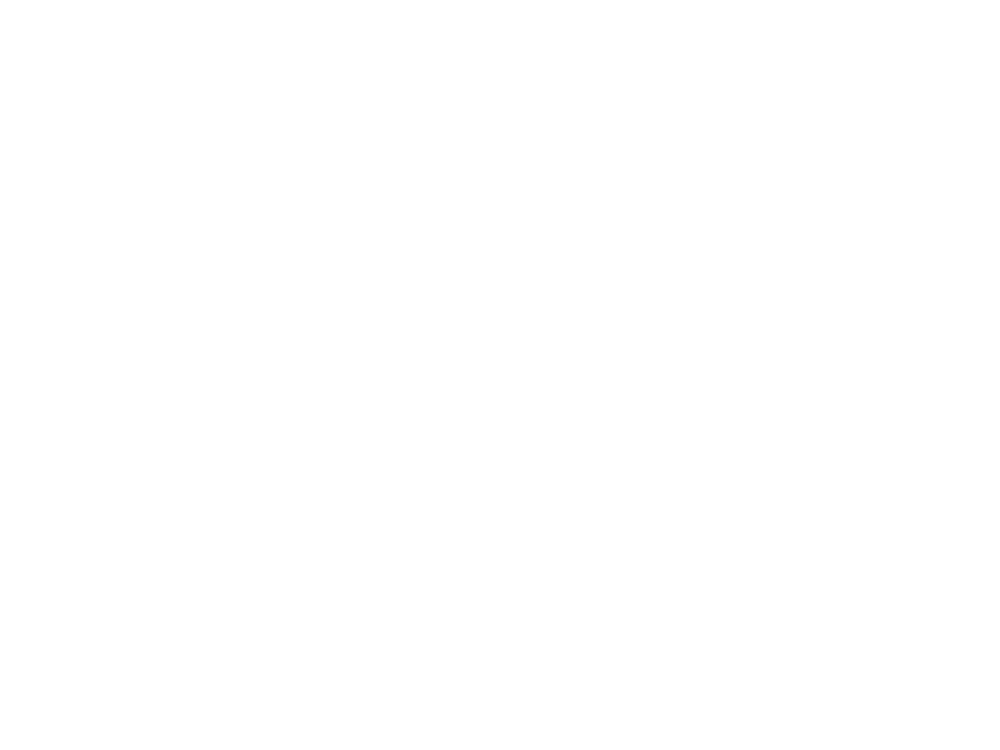

<IPython.core.display.Javascript object>


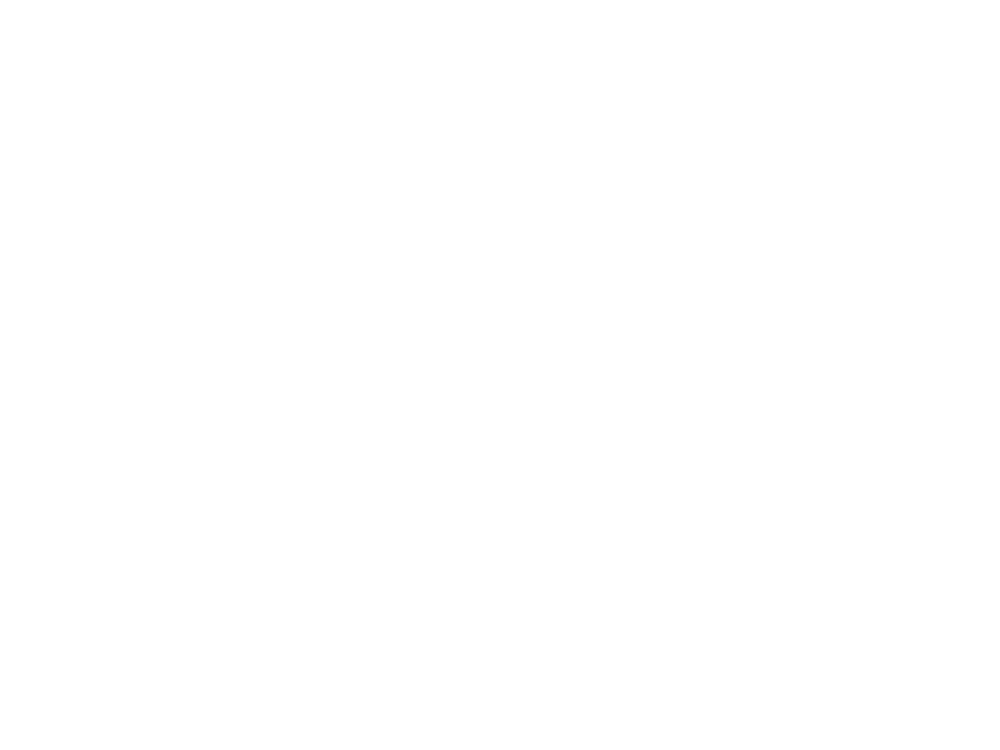

<IPython.core.display.Javascript object>


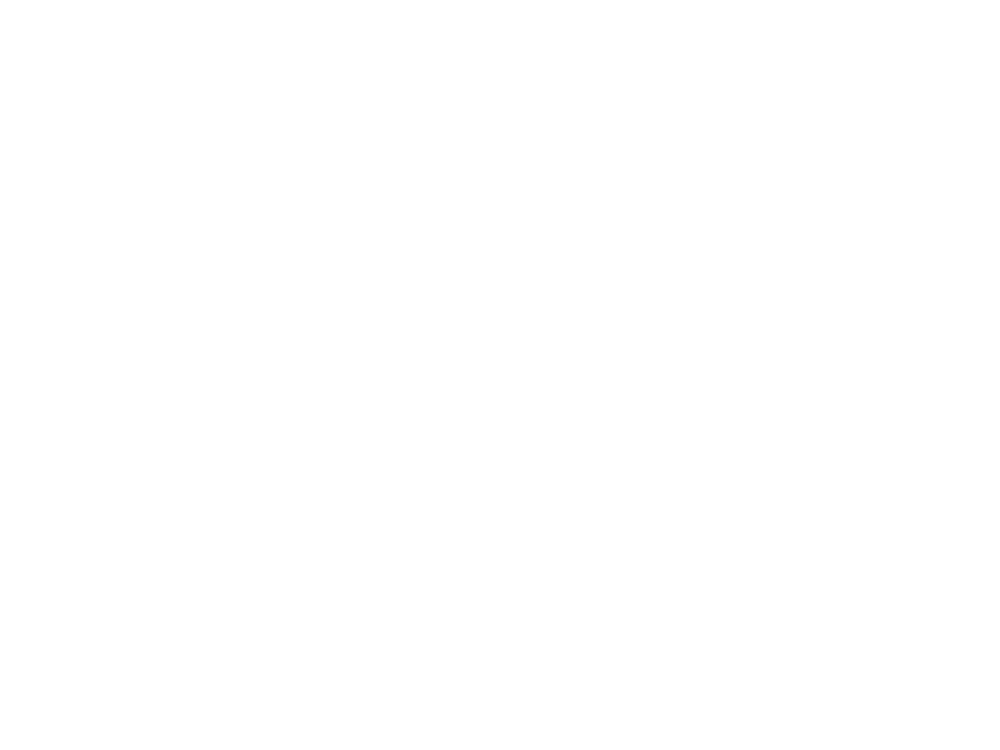

<IPython.core.display.Javascript object>


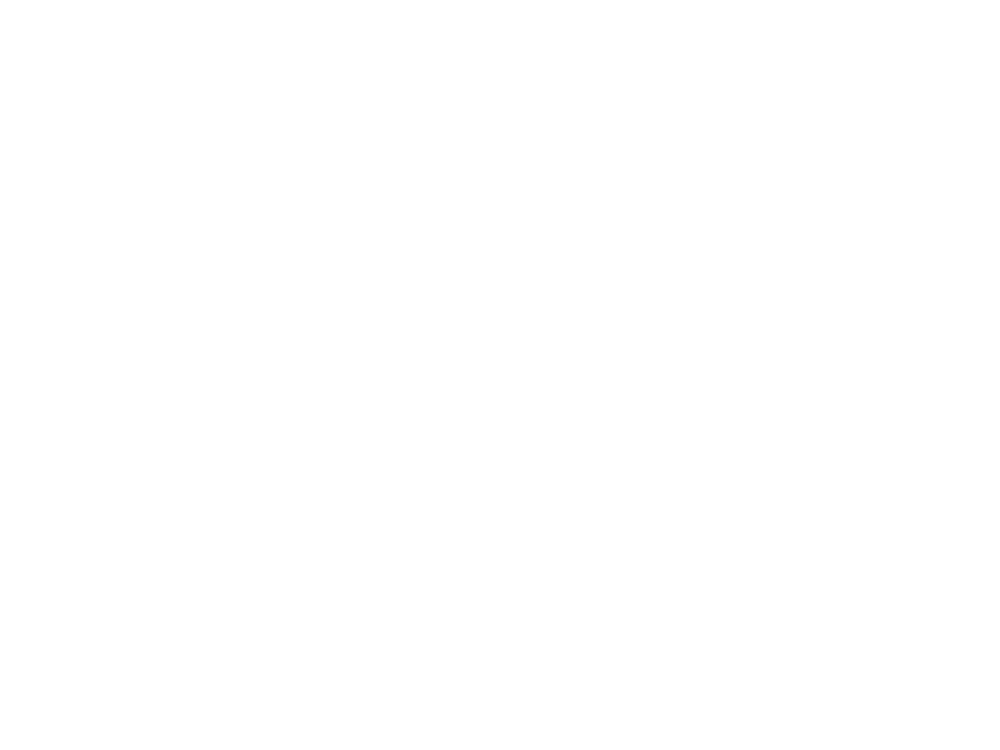

<IPython.core.display.Javascript object>


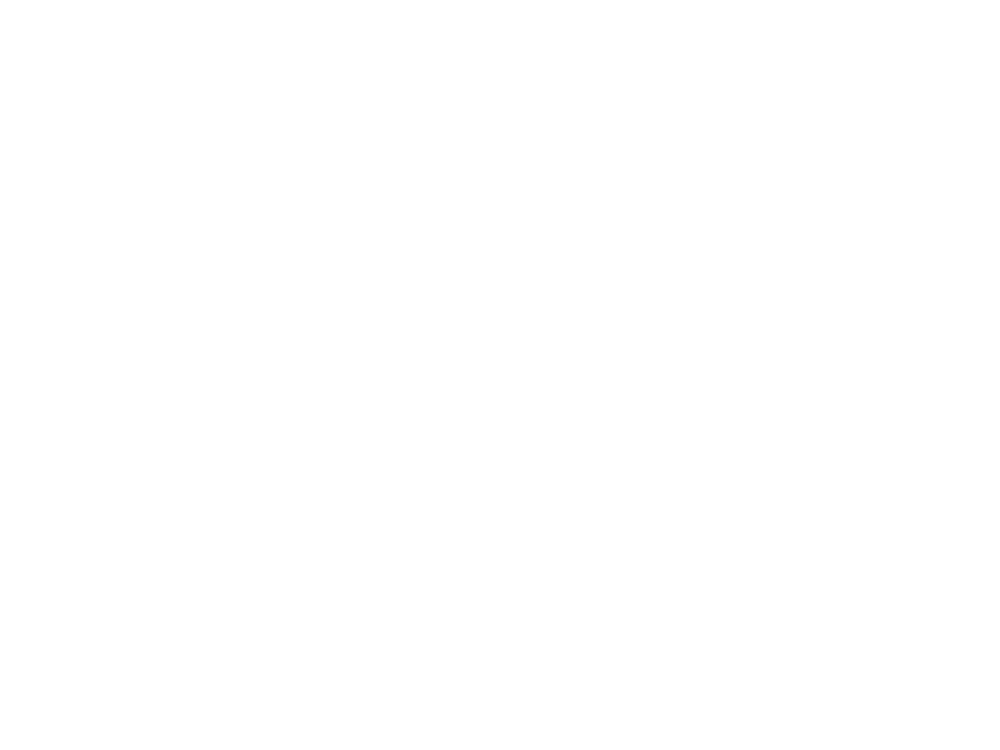

<IPython.core.display.Javascript object>


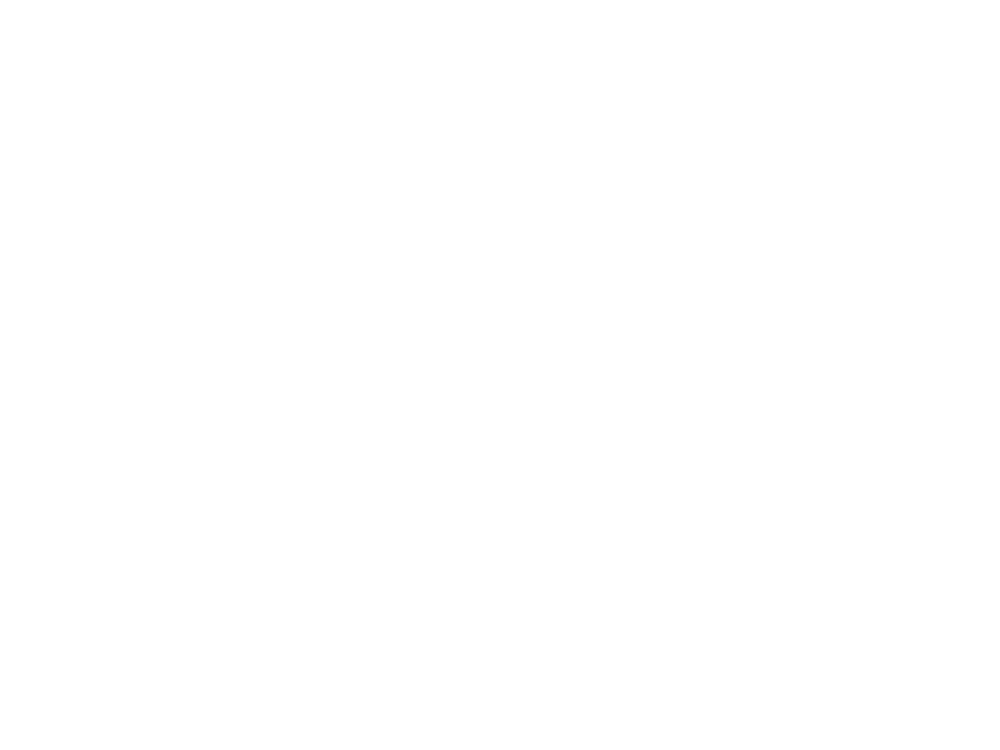

<IPython.core.display.Javascript object>


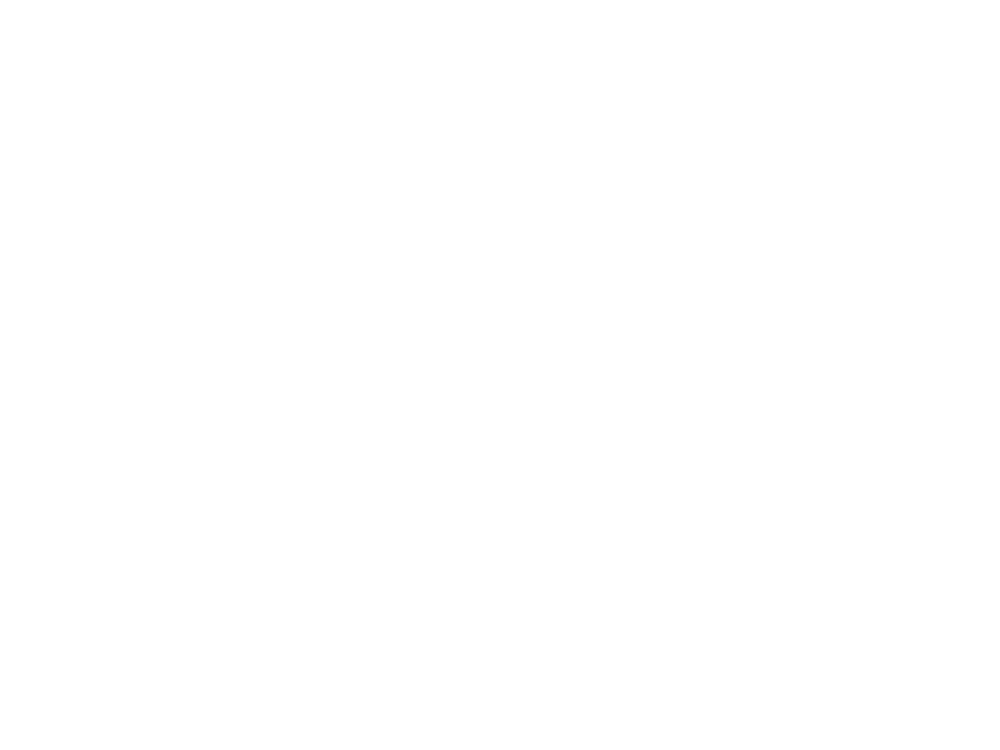

<IPython.core.display.Javascript object>


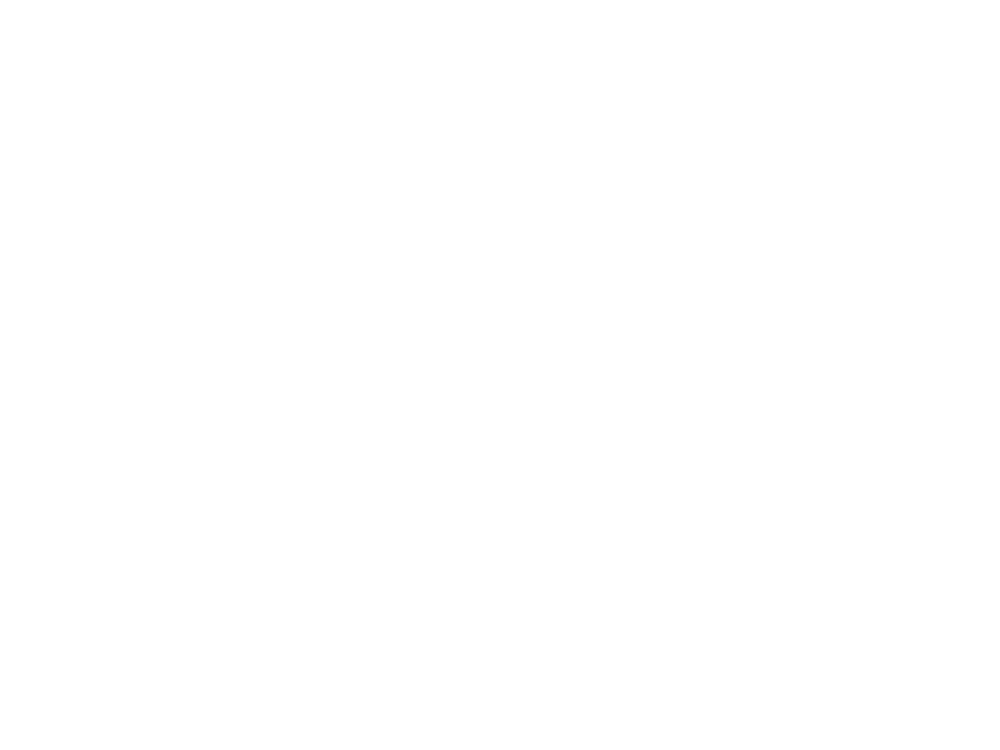

<IPython.core.display.Javascript object>


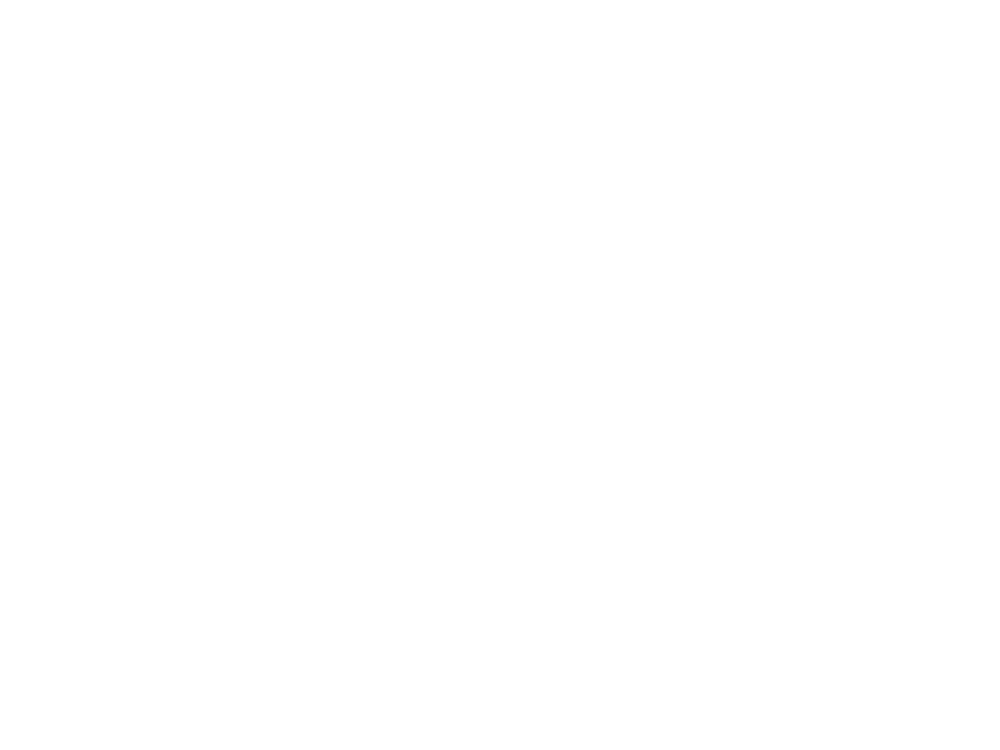

<IPython.core.display.Javascript object>


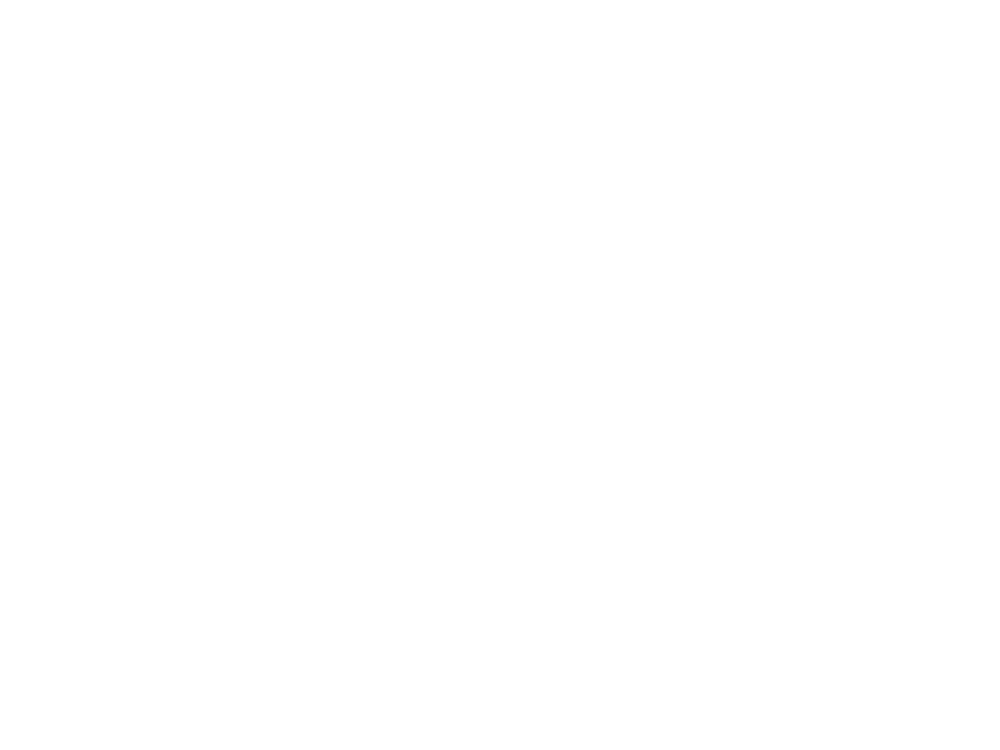

<IPython.core.display.Javascript object>


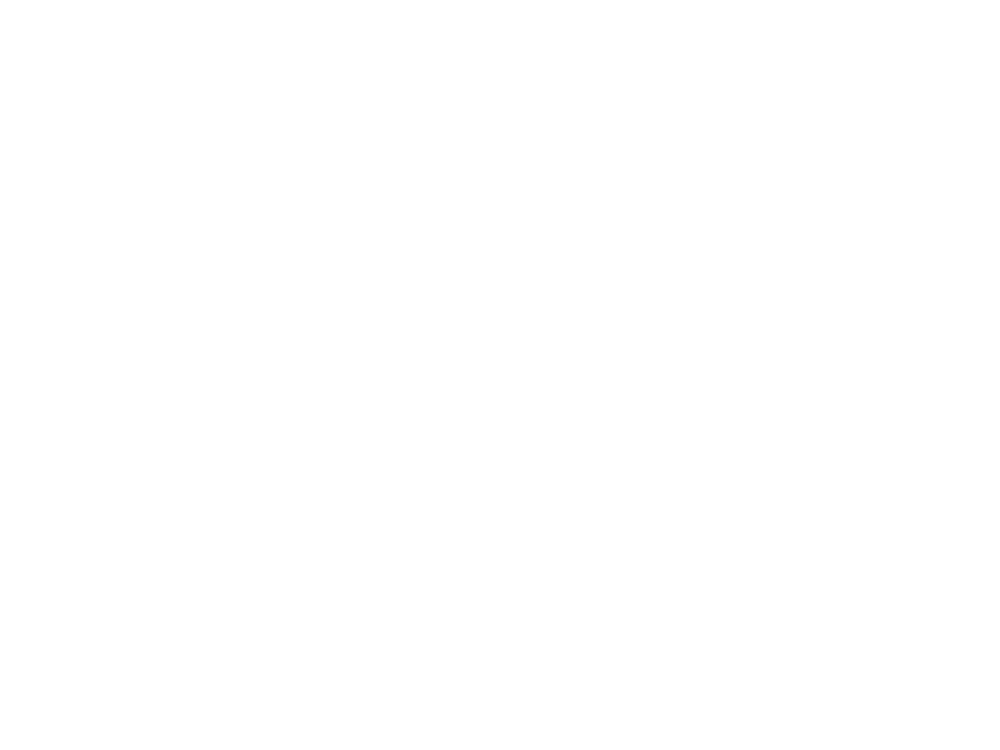

<IPython.core.display.Javascript object>


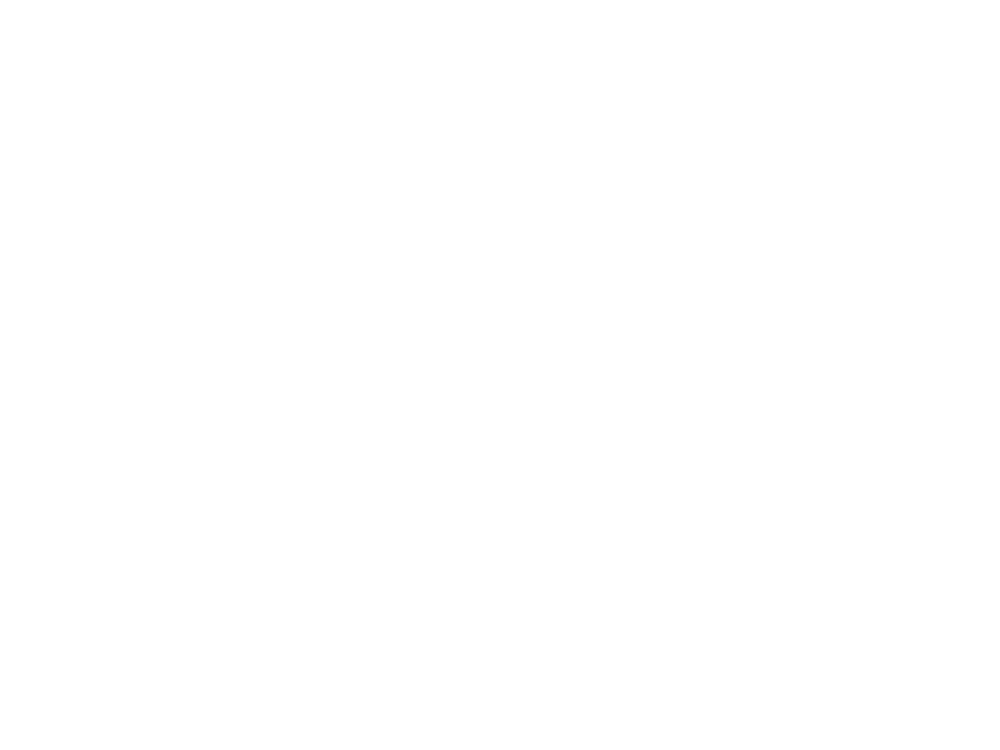

<IPython.core.display.Javascript object>


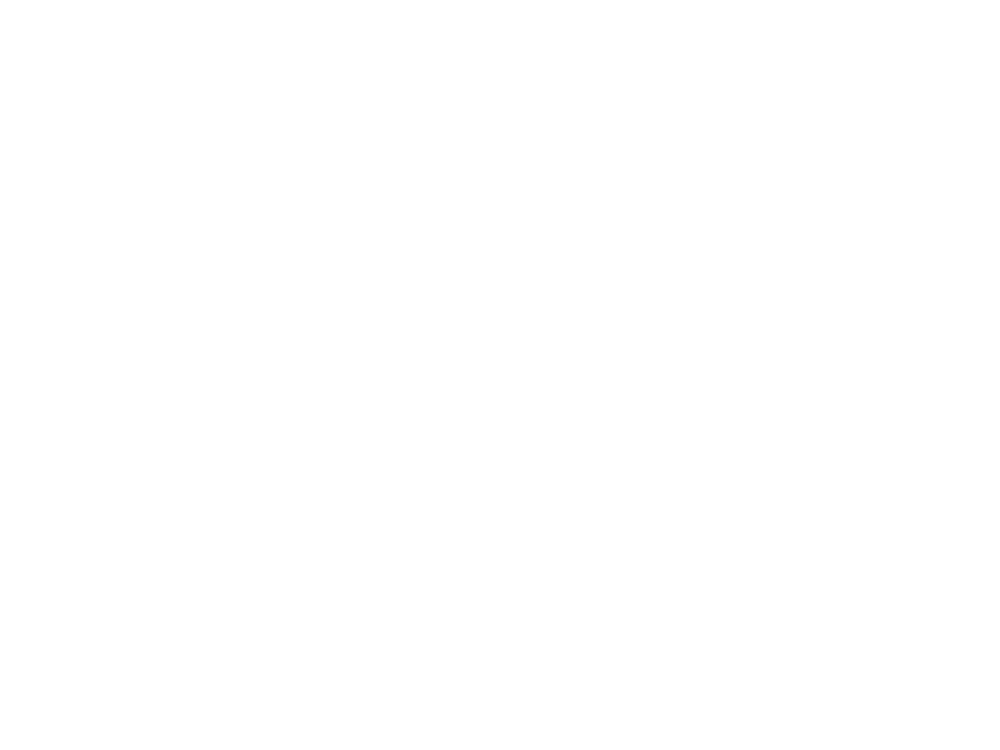

<IPython.core.display.Javascript object>


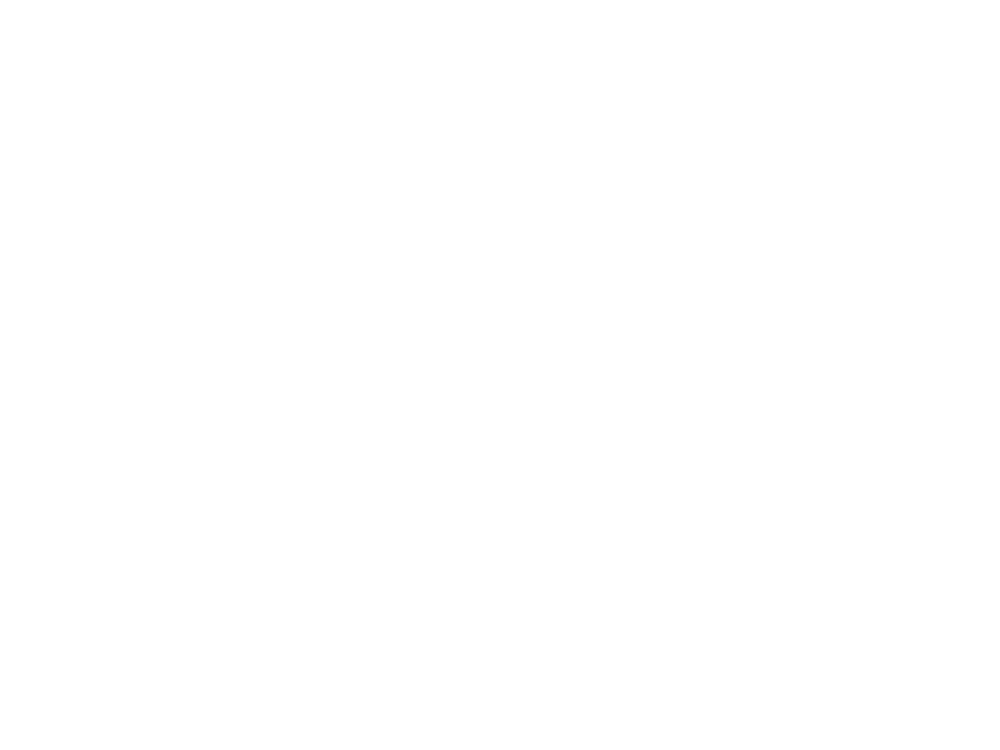

<IPython.core.display.Javascript object>


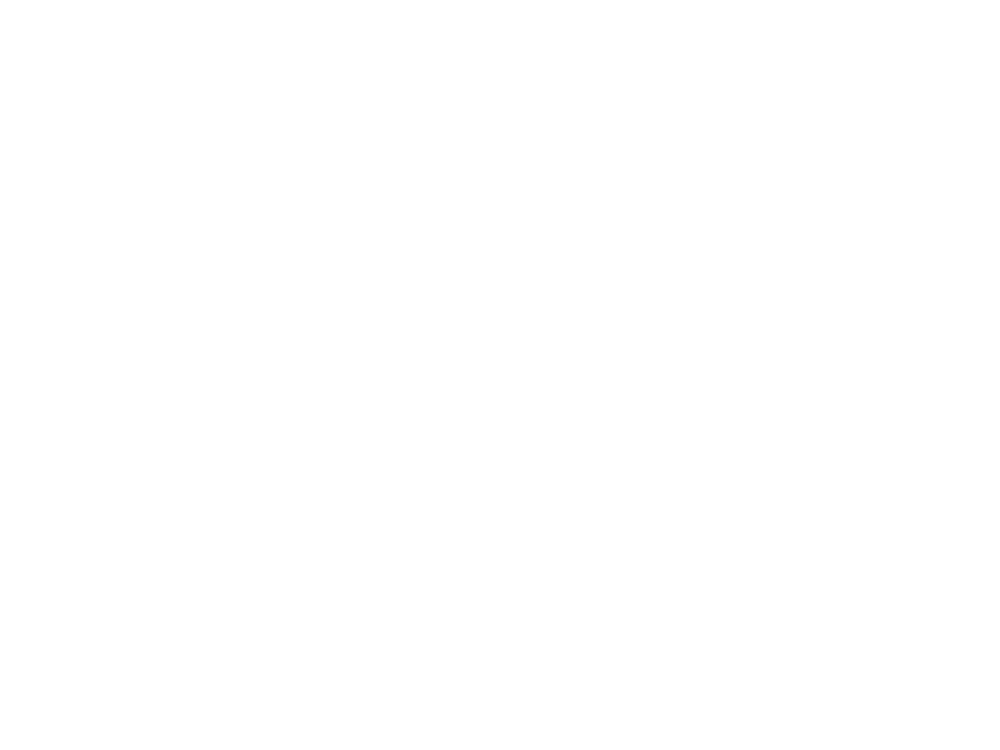

<IPython.core.display.Javascript object>


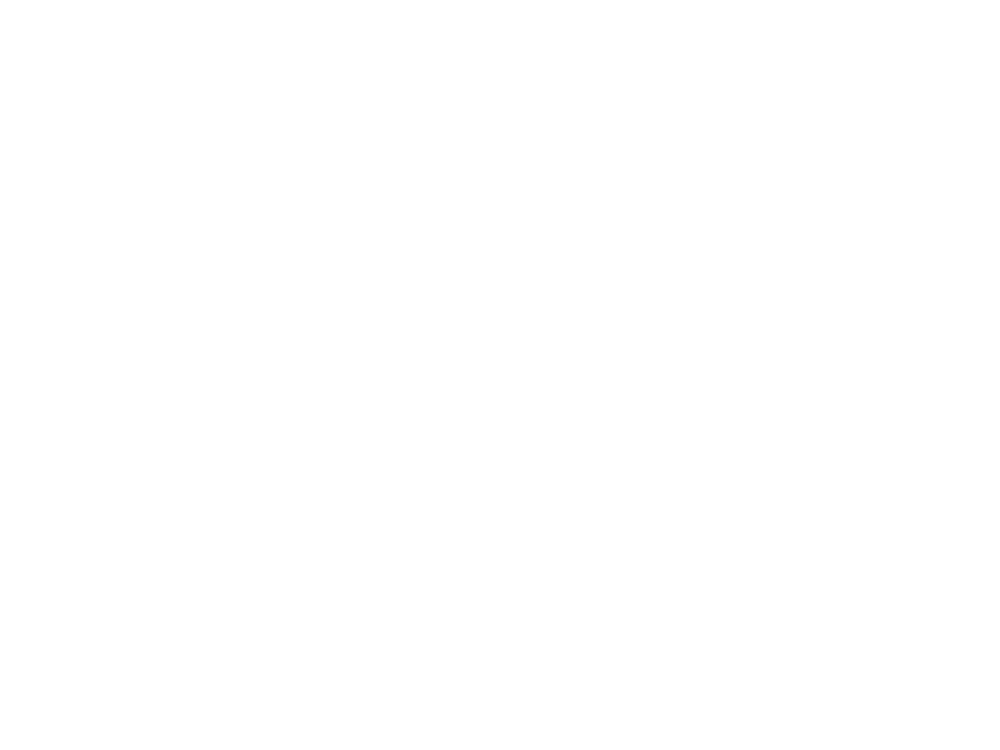

<IPython.core.display.Javascript object>


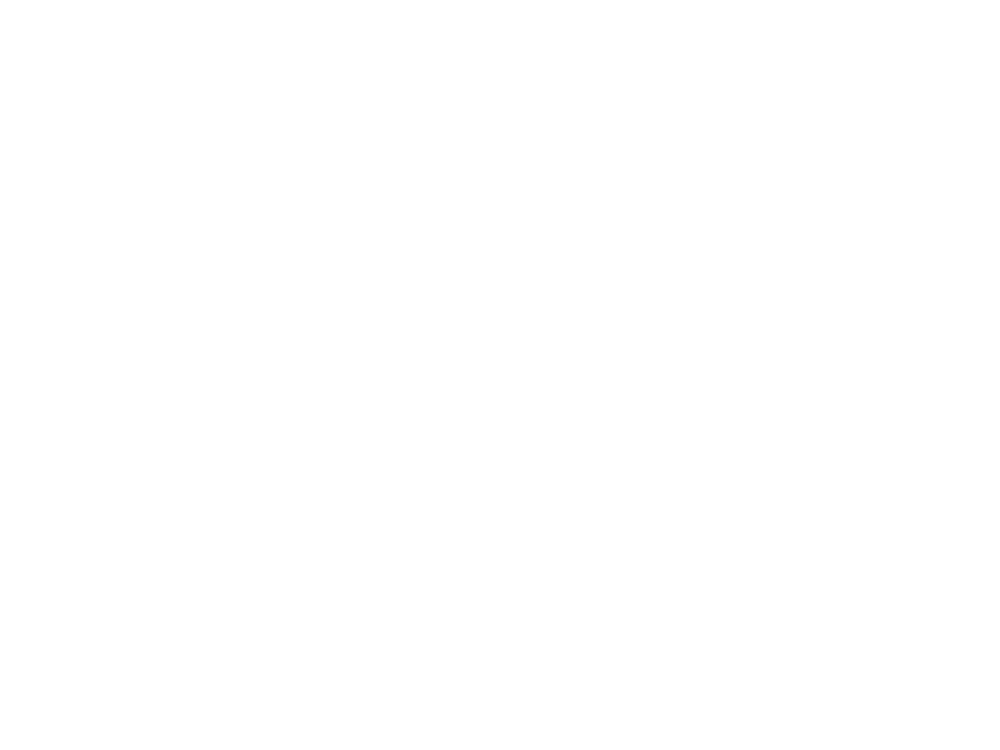

<IPython.core.display.Javascript object>


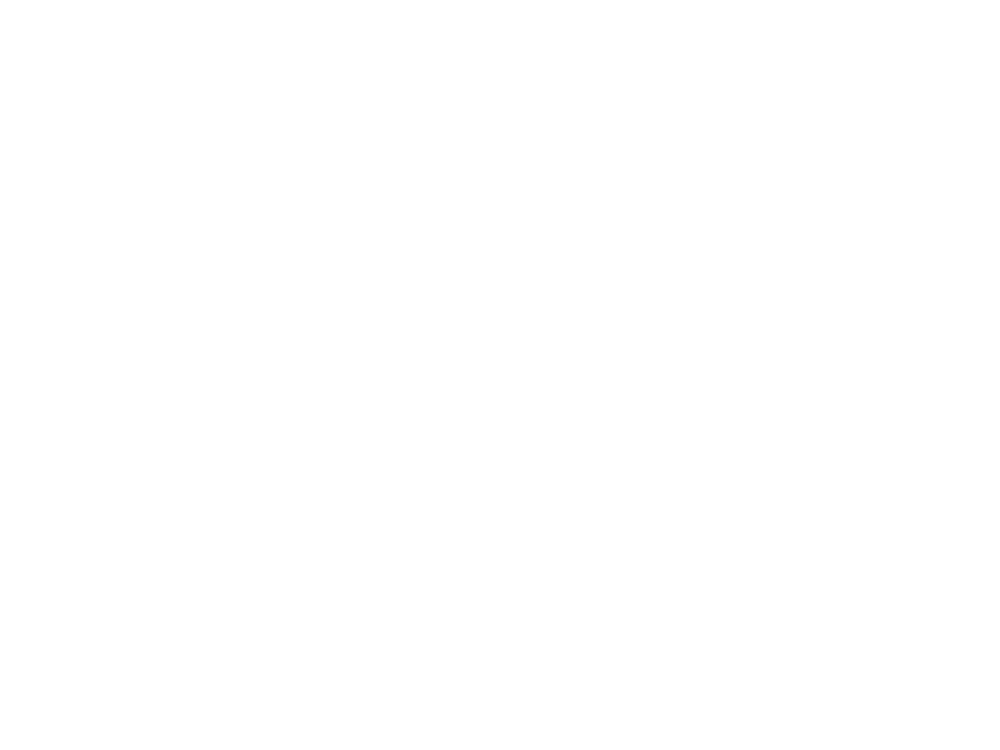

<IPython.core.display.Javascript object>


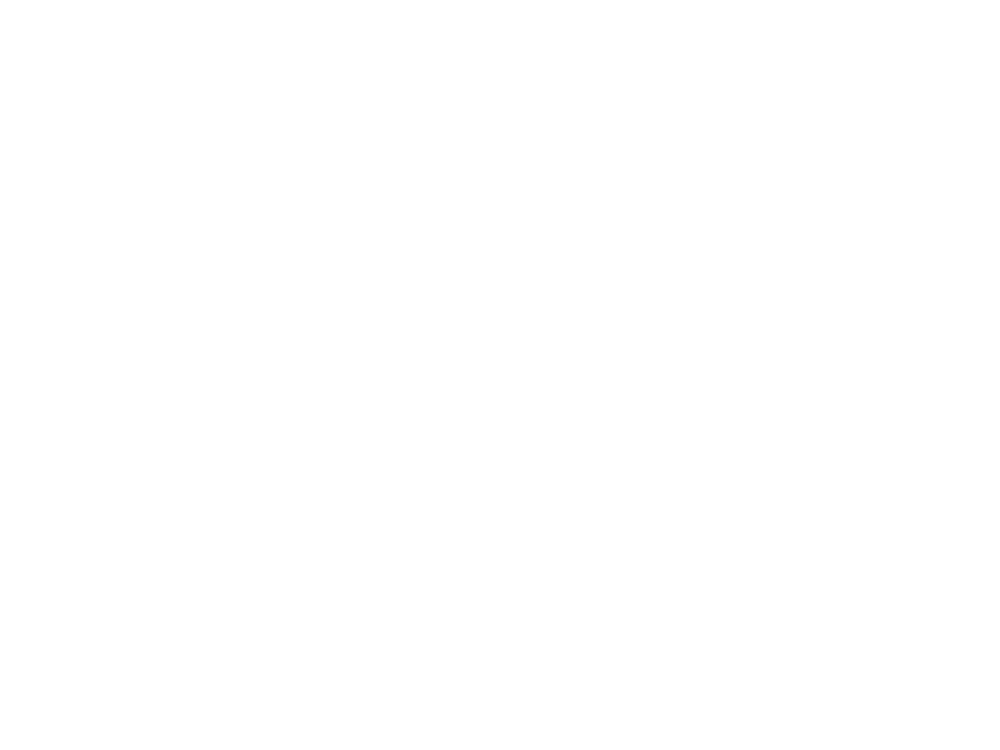

<IPython.core.display.Javascript object>


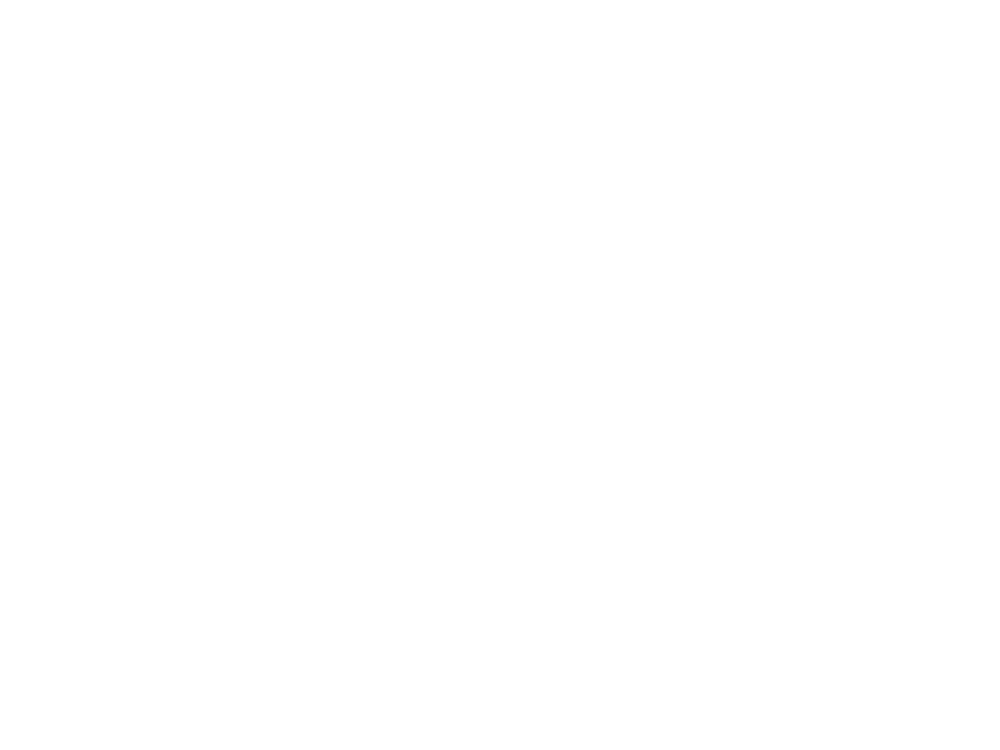

In [117]:
def plotAlignedLfp(tPlot,freq,b,per,saveName):
    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T)
    fig.colorbar(CS)
    ax.set_title(per,fontsize=20)
    fig.savefig(saveName,format='png')
    fig.clf()
    plt.close(fig)

    mu = np.mean(b[:int(b.shape[0]/2),:],axis=0)
    Std = np.std(b[:int(b.shape[0]/2),:],axis=0)
    b =(b-mu)/Std

    fig, ax = plt.subplots()
    CS=ax.pcolormesh(tPlot,freq,b.T,vmax=7,vmin=-4)
    fig.colorbar(CS)
    ax.set_title('Z-score'+' '+per)
    fig.savefig(saveName,format='png')
    fig.clf()
    plt.close(fig)

    
f = h5py.File('Spectograms.hdf5','r')
freq = f['0761']['freq'].value
f.close()
dtL = 0.00032768
tPlot = np.linspace(-2,2,int(4/dtL-1))
betaM = ['8430','4539','7584','7909','1222']
noBetaM = getMiceList(Files[1])
noBetaM = [m for m in noBetaM if m not in betaM ]
# paths = {'speed':'/home/dana_z/HD1/lfpAligned2mvmt/speed_axis1/',
#         'rot_Con':'/home/dana_z/HD1/lfpAligned2mvmt/rot_axis1_ac/',
#         'rot_Ips':'/home/dana_z/HD1/lfpAligned2mvmt/rot_axis1_c/'}
paths = {'rot_Ips':'/home/dana_z/HD1/lfpAligned2mvmt/rot_axis1_c/'}
for mv in paths.keys():
    for p in Period.keys(): 
        A,df2 = getAlignedLFP_mvmt(paths[mv],period = p)
        b  = np.nanmean(A,axis=2)
        plotAlignedLfp(tPlot,freq,b,p,figFolder+'lfp_aligned_to'+mv+'_'+p+'.png')
        del A,b
        A,df2 = getAlignedLFP_mvmt(paths[mv],period = p,mice = betaM)
        b  = np.nanmean(A,axis=2)
        plotAlignedLfp(tPlot,freq,b,p,figFolder+'lfp_aligned_to'+mv+'_'+p+'_Beta.png')
        del A,b
        A,df2 = getAlignedLFP_mvmt(paths[mv],period = p,mice = noBetaM)
        b  = np.nanmean(A,axis=2)
        plotAlignedLfp(tPlot,freq,b,p,figFolder+'lfp_aligned_to'+mv+'_'+p+'_noBeta.png')


        


    

Temp LFP stuff, move to different notebook if not intersting/not used 

In [16]:
# spectrom in high/low mvmt
f = h5py.File('Spectograms.hdf5','r')

miceList = getMiceList(Files[0])
specs = {}
for m in tqdm(miceList):  
    data =  getData(Files[0],['lfp','speed'],period ='Pre', mice=m)
    
    for sess in data:
        try:
            if sess[5] == 'B':
                day = 0
            else:
                day = int(re.findall(r'\d+',sess[5:])[0])

            # get data
            dtS = 1/data[sess]['speed']['Fs']
            dtL = 1/data[sess]['lfp']['FS']
            ts = np.arange(0, np.max(data[sess]['speed']['speed'].shape)) * dtS 
            tl = np.arange(0, np.max(data[sess]['lfp']['lfp'].shape)) * dtL


            highAC = getOnsetOrPeriod(m,sess,'Pre','hiACRotPeriods_vector')
            highC = getOnsetOrPeriod(m,sess,'Pre','hiCRotPeriods_vector')
            lowRot = getOnsetOrPeriod(m,sess,'Pre','loRotPeriods_vector')
            lowSpeed = getOnsetOrPeriod(m,sess,'Pre','LowMvmtPeriods_vector')
            hiSpeed = getOnsetOrPeriod(m,sess,'Pre','HighMvmtPeriods_vector')
            tempDict = {'mouse':m,'day':day,'period':periodCalc(day)}

            freq = f[m]['freq'].value
            coeff = np.abs(f[m][sess]['Pre']['coeff'].value)
            lfpOutliers = removeLFPOutliers(data[sess]['lfp']['lfp'], sess)
            coeff[:,(lfpOutliers[:,0]==1)] = np.nan
            coeff = coeff.T



            for mv in ['highAC','highC','lowRot','lowSpeed','hiSpeed']:
                Himvmt = np.full_like(tl,False)
                mVector = eval(mv)
                V = np.append(mVector[1:]*1-mVector[:-1]*1,0)
                HpStart = ts[V==1]
                HpEnd = ts[V==-1]
                if mVector[0] == 1:
                    HpStart = np.insert(HpStart,0,0)
                for segI, seg in enumerate(HpStart):
                    si = np.argmin(np.abs(tl-seg))
                    se = np.argmin(np.abs(tl-HpEnd[segI]))
                    Himvmt[si:se] = True

                #coeff = np.delete(coeff,(56), axis=1)
                sessH = (coeff[(Himvmt ==1),:])
                Hs = np.nansum(sessH, axis=1)
                Hs2 = sessH.T/Hs.T
                tempDict[mv] = np.nanmean(Hs2.T,axis=0, keepdims=True)
            specs[sess] = tempDict
        except:
            print(sess)
        

  0%|          | 0/16 [00:00<?, ?it/s]

cleaning up lfp data
cleaning up speed data


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:55: RuntimeWarning: Mean of empty slice
  6%|▋         | 1/16 [01:18<19:38, 78.57s/it]

cleaning up lfp data
I deleted session: 1208_day12
cleaning up speed data
found  17.0  outlier points


 12%|█▎        | 2/16 [02:37<18:20, 78.60s/it]

cleaning up lfp data
cleaning up speed data


 19%|█▉        | 3/16 [04:09<17:56, 82.79s/it]

cleaning up lfp data
cleaning up speed data


 25%|██▌       | 4/16 [04:29<12:47, 63.94s/it]

cleaning up lfp data
cleaning up speed data
found  1.0  outlier points
found  888231.0  outlier points
found  481139.0  outlier points


 31%|███▏      | 5/16 [06:09<13:40, 74.61s/it]

cleaning up lfp data
cleaning up speed data


 38%|███▊      | 6/16 [06:44<10:26, 62.69s/it]

cleaning up lfp data
cleaning up speed data


 44%|████▍     | 7/16 [09:30<14:04, 93.86s/it]

cleaning up lfp data
I deleted session: 2976_day4
cleaning up speed data
found  1.0  outlier points
found  3.0  outlier points


 50%|█████     | 8/16 [11:54<14:30, 108.79s/it]

cleaning up lfp data
cleaning up speed data


 56%|█████▋    | 9/16 [14:30<14:21, 123.10s/it]

cleaning up lfp data
cleaning up speed data
found  50.0  outlier points


 62%|██████▎   | 10/16 [17:12<13:27, 134.61s/it]

cleaning up lfp data
cleaning up speed data
found  29.0  outlier points


 69%|██████▉   | 11/16 [20:35<12:56, 155.26s/it]

cleaning up lfp data
cleaning up speed data


 75%|███████▌  | 12/16 [23:41<10:57, 164.41s/it]

cleaning up lfp data
cleaning up speed data


 81%|████████▏ | 13/16 [27:04<08:48, 176.09s/it]

cleaning up lfp data
cleaning up speed data


 88%|████████▊ | 14/16 [29:27<05:32, 166.02s/it]

cleaning up lfp data
cleaning up speed data
8803_day6


 94%|█████████▍| 15/16 [31:50<02:39, 159.24s/it]

cleaning up lfp data
cleaning up speed data
8815_day6


100%|██████████| 16/16 [34:14<00:00, 128.42s/it]


In [18]:
# all, and no 4539
periods = {'Healthy':{'axis':0},'Day 1-4':{'axis':1},'Day 5-12':{'axis':2},'Day 13-20':{'axis':3},'One Month':{'axis':4}}
conds = ['highAC','highC','lowRot','lowSpeed','hiSpeed']

for p in periods.keys():
    for c in conds:
        periods[p][c] = np.zeros((87,1))
for sess in specs.keys():
    for c in conds:
        periods[specs[sess]['period']][c] = np.concatenate((periods[specs[sess]['period']][c],
                                                                   specs[sess][c].T),axis=1)
for p in periods.keys():
    for c in conds:
        periods[p][c] = periods[p][c][:,1:]

In [58]:
specs['0761_BaselineA'].keys()

dict_keys(['mouse', 'day', 'period', 'highAC', 'highC', 'lowRot', 'lowSpeed', 'hiSpeed'])

<IPython.core.display.Javascript object>


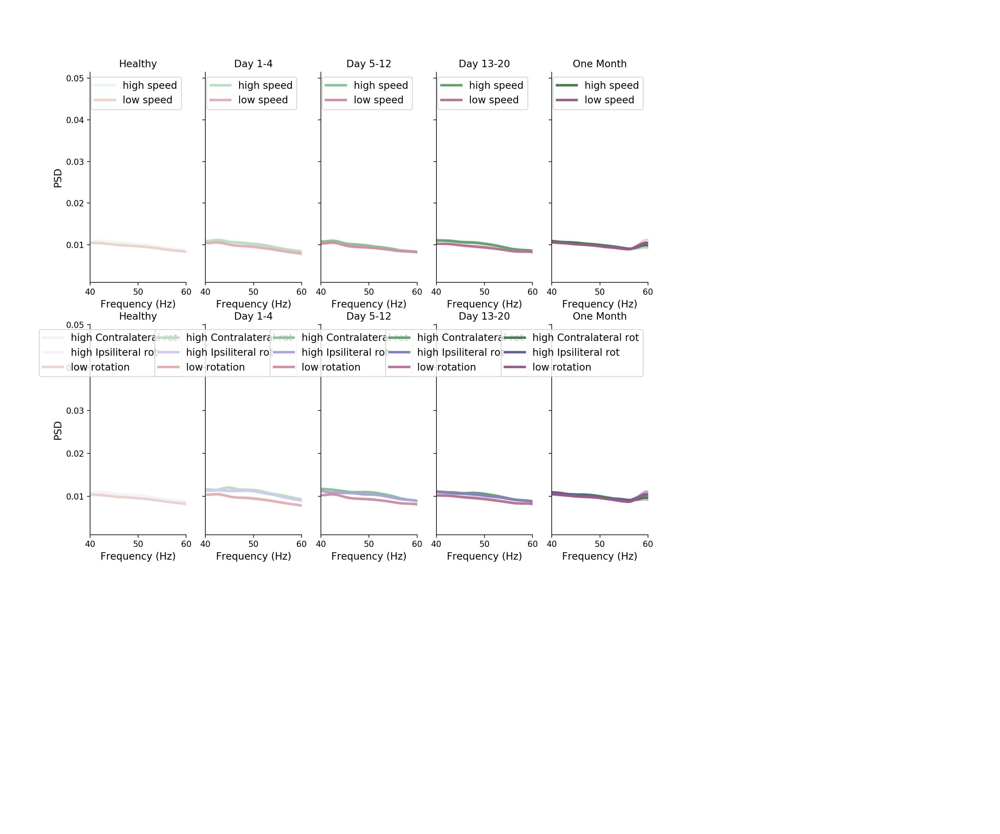

In [20]:
#periods = {'Healthy':{'axis':0},'Day 1-4':{'axis':1},'Day 5-12':{'axis':2},'Day 13-20':{'axis':3},'One Month':{'axis':4}}

colorsL = sns.cubehelix_palette(8)
colorsH = sns.cubehelix_palette(8, start=2, rot=0, dark=0, light=.95)
colorsH2 = sns.cubehelix_palette(8, start=3, rot=0, dark=0, light=.95)

fig, ax = plt.subplots(2,5,figsize=(12.15,10.15),sharey='row')
for ind, p in enumerate(periods.keys()):
    hC = np.nanmean(periods[p]['hiSpeed'],axis=1)
    hS2 = np.nanstd(periods[p]['hiSpeed'],axis=1)/np.sqrt(periods[p]['hiSpeed'].shape[1])
    lC = np.nanmean(periods[p]['lowSpeed'],axis=1)
    lS2 = np.nanstd(periods[p]['lowSpeed'],axis=1)/np.sqrt(periods[p]['lowSpeed'].shape[1])
       
    ax[0,ind].plot(freq,hC,color = colorsH[ind], label='high speed',linewidth=3.0)
    ax[0,ind].fill_between(freq, hC-hS2, hC+hS2,color=colorsH[ind],alpha=0.3)
    ax[0,ind].plot(freq,lC,color = colorsL[ind], label='low speed',linewidth=3.0)
    ax[0,ind].fill_between(freq, lC-lS2, lC+lS2,color=colorsL[ind],alpha=0.2)
    ax[0,ind].set_xlim(6,100)
    ax[0,ind].set_title(p)
#    ax[0,ind].set_xlim(9,15)
#    ax[0,ind].set_ylim(0.015,0.03)
    ax[0,0].set_ylabel('PSD',fontsize=12)
    #ax[0,ind].axes.get_yaxis().set_ticks([])
    ax[0,ind].set_xlabel('Frequency (Hz)',fontsize=12)
    ax[0,ind].spines['right'].set_visible(False)
    ax[0,ind].spines['top'].set_visible(False)
    ax[0,ind].legend(fontsize=12)
    
    hC = np.nanmean(periods[p]['highC'],axis=1)
    hS2 = np.nanstd(periods[p]['highC'],axis=1)/np.sqrt(periods[p]['highC'].shape[1])
    hAC = np.nanmean(periods[p]['highAC'],axis=1)
    hS2A = np.nanstd(periods[p]['highAC'],axis=1)/np.sqrt(periods[p]['highAC'].shape[1])
    lC = np.nanmean(periods[p]['lowRot'],axis=1)
    lS2 = np.nanstd(periods[p]['lowRot'],axis=1)/np.sqrt(periods[p]['lowRot'].shape[1])
       
    ax[1,ind].plot(freq,hC,color = colorsH[ind], label='high Contralateral rot',linewidth=3.0)
    ax[1,ind].fill_between(freq, hC-hS2, hC+hS2,color=colorsH[ind],alpha=0.3)
    ax[1,ind].plot(freq,hAC,color = colorsH2[ind], label='high Ipsiliteral rot',linewidth=3.0)
    ax[1,ind].fill_between(freq, hAC-hS2A, hAC+hS2A,color=colorsH2[ind],alpha=0.3)
    ax[1,ind].plot(freq,lC,color = colorsL[ind], label='low rotation',linewidth=3.0)
    ax[1,ind].fill_between(freq, lC-lS2, lC+lS2,color=colorsL[ind],alpha=0.2)
    ax[1,ind].set_xlim(6,100)
    ax[1,ind].set_title(p)
#    ax[0,ind].set_xlim(9,15)
#    ax[0,ind].set_ylim(0.015,0.03)
    ax[1,0].set_ylabel('PSD',fontsize=12)
    #ax[0,ind].axes.get_yaxis().set_ticks([])
    ax[1,ind].set_xlabel('Frequency (Hz)',fontsize=12)
    ax[1,ind].spines['right'].set_visible(False)
    ax[1,ind].spines['top'].set_visible(False)
    ax[1,ind].legend(fontsize=12)
fig.savefig(figFolder+'lfpSpectromPeriod.png',transparent=True,format='png')
fig.savefig(figFolder+'lfpSpectromPeriod.svg',transparent=True,format='svg')

# #fig2, ax2 = plt.subplots(1,2,sharex='col',sharey='row')
for ind, p in enumerate(periods.keys()):
    ax[0,ind].set_xlim(9,20)
    ax[1,ind].set_xlim(9,20)
fig.savefig(figFolder+'lfpSpectromPeriodZoomBeta.png',transparent=True,format='png')
fig.savefig(figFolder+'lfpSpectromPeriodZoomBeta.svg',transparent=True,format='svg')
for ind, p in enumerate(periods.keys()):
    ax[0,ind].set_xlim(40,60)
    ax[1,ind].set_xlim(40,60)
fig.savefig(figFolder+'lfpSpectromPeriodZoomGamma.png',transparent=True,format='png')
fig.savefig(figFolder+'lfpSpectromPeriodZoomGamma.svg',transparent=True,format='svg')



<IPython.core.display.Javascript object>


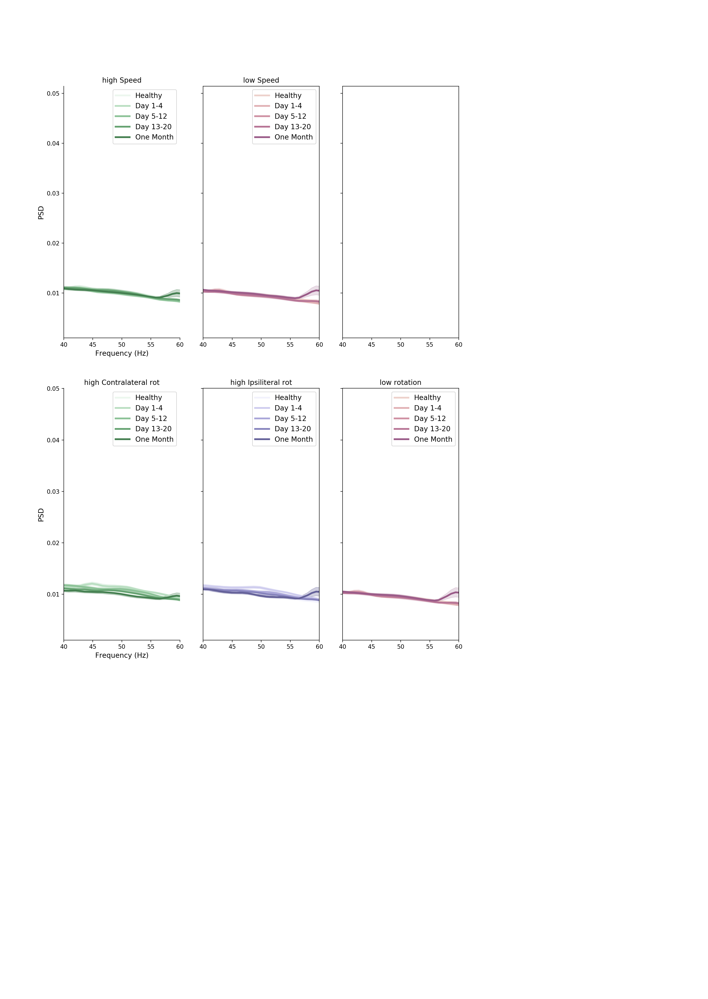

In [21]:
colorsL = sns.cubehelix_palette(8)
colorsH = sns.cubehelix_palette(8, start=2, rot=0, dark=0, light=.95)
colorsH2 = sns.cubehelix_palette(8, start=3, rot=0, dark=0, light=.95)

fig, ax = plt.subplots(2,3,figsize=(12.15,17.15),sharey='row')
for ind, p in enumerate(periods.keys()):
    hC = np.nanmean(periods[p]['hiSpeed'],axis=1)
    hS2 = np.nanstd(periods[p]['hiSpeed'],axis=1)/np.sqrt(periods[p]['hiSpeed'].shape[1])
    lC = np.nanmean(periods[p]['lowSpeed'],axis=1)
    lS2 = np.nanstd(periods[p]['lowSpeed'],axis=1)/np.sqrt(periods[p]['lowSpeed'].shape[1])
       
    ax[0,0].plot(freq,hC,color = colorsH[ind], label=p,linewidth=3.0)
    ax[0,0].fill_between(freq, hC-hS2, hC+hS2,color=colorsH[ind],alpha=0.3)
    ax[0,1].plot(freq,lC,color = colorsL[ind], label=p,linewidth=3.0)
    ax[0,1].fill_between(freq, lC-lS2, lC+lS2,color=colorsL[ind],alpha=0.2)
    ax[0,0].set_xlim(6,100)
    ax[0,0].set_title('high Speed')
    ax[0,1].set_title('low Speed')
#    ax[0,ind].set_xlim(9,15)
#    ax[0,ind].set_ylim(0.015,0.03)
    ax[0,0].set_ylabel('PSD',fontsize=12)
    #ax[0,ind].axes.get_yaxis().set_ticks([])
    ax[0,0].set_xlabel('Frequency (Hz)',fontsize=12)
    ax[0,0].spines['right'].set_visible(False)
    ax[0,0].spines['top'].set_visible(False)
    ax[0,0].legend(fontsize=12)
    ax[0,1].legend(fontsize=12)
    

    hC = np.nanmean(periods[p]['highC'],axis=1)
    hS2 = np.nanstd(periods[p]['highC'],axis=1)/np.sqrt(periods[p]['highC'].shape[1])
    hAC = np.nanmean(periods[p]['highAC'],axis=1)
    hS2A = np.nanstd(periods[p]['highAC'],axis=1)/np.sqrt(periods[p]['highAC'].shape[1])
    lC = np.nanmean(periods[p]['lowRot'],axis=1)
    lS2 = np.nanstd(periods[p]['lowRot'],axis=1)/np.sqrt(periods[p]['lowRot'].shape[1])
       
    ax[1,0].plot(freq,hC,color = colorsH[ind], label=p,linewidth=3.0)
    ax[1,0].fill_between(freq, hC-hS2, hC+hS2,color=colorsH[ind],alpha=0.3)
    ax[1,1].plot(freq,hAC,color = colorsH2[ind], label=p,linewidth=3.0)
    ax[1,1].fill_between(freq, hAC-hS2A, hAC+hS2A,color=colorsH2[ind],alpha=0.3)
    ax[1,2].plot(freq,lC,color = colorsL[ind], label=p,linewidth=3.0)
    ax[1,2].fill_between(freq, lC-lS2, lC+lS2,color=colorsL[ind],alpha=0.2)
    ax[1,0].set_xlim(6,100)
    ax[1,0].set_title('high Contralateral rot')
    ax[1,1].set_title('high Ipsiliteral rot')
    ax[1,2].set_title('low rotation')
#    ax[0,ind].set_xlim(9,15)
#    ax[0,ind].set_ylim(0.015,0.03)
    ax[1,0].set_ylabel('PSD',fontsize=12)
    #ax[0,ind].axes.get_yaxis().set_ticks([])
    ax[1,0].set_xlabel('Frequency (Hz)',fontsize=12)
    ax[1,0].spines['right'].set_visible(False)
    ax[1,0].spines['top'].set_visible(False)
    ax[1,0].legend(fontsize=12)
    ax[1,1].legend(fontsize=12)
    ax[1,2].legend(fontsize=12)
fig.savefig(figFolder+'lfpSpectrom.png',transparent=True,format='png')
fig.savefig(figFolder+'lfpSpectrom.svg',transparent=True,format='svg')

# #fig2, ax2 = plt.subplots(1,2,sharex='col',sharey='row')
for ind in range(0,3):
    ax[0,ind].set_xlim(9,20)
    ax[1,ind].set_xlim(9,20)
fig.savefig(figFolder+'lfpSpectromZoomBeta.png',transparent=True,format='png')
fig.savefig(figFolder+'lfpSpectromZoomBeta.svg',transparent=True,format='svg')
for ind in range(0,3):
    ax[0,ind].set_xlim(40,60)
    ax[1,ind].set_xlim(40,60)
fig.savefig(figFolder+'lfpSpectromZoomGamma.png',transparent=True,format='png')
fig.savefig(figFolder+'lfpSpectromZoomGamma.svg',transparent=True,format='svg')



In [22]:
colorsL = sns.cubehelix_palette(8)
colorsH = sns.cubehelix_palette(8, start=2, rot=0, dark=0, light=.95)
colorsH2 = sns.cubehelix_palette(8, start=3, rot=0, dark=0, light=.95)

beta = (freq>10)&(freq<16)
gamma =(freq>40)&(freq<60)
# print(periods[p]['hiSpeed'].shape,np.nanmean(periods[p]['hiSpeed'][beta],axis=0).shape)
df = pd.DataFrame(columns = ['period','Mouse','mvmt','beta','gamma'])
# # fig, ax = plt.subplots(2,3,figsize=(12.15,17.15),sharey='row')
for sess in specs.keys():
    for mv in ['highAC', 'highC', 'lowRot', 'lowSpeed', 'hiSpeed']:
        df2 = pd.DataFrame({'period':specs[sess]['period'],'Mouse':specs[sess]['mouse'],'mvmt':mv,
                            'beta':np.nanmean(specs[sess][mv][0,beta],axis=0),
                           'gamma':np.nanmean(specs[sess][mv][0,gamma],axis=0),
                           'betaSum':np.nansum(specs[sess][mv][0,beta],axis=0),
                           'gammaSum':np.nansum(specs[sess][mv][0,gamma],axis=0)},index=[0])
        df = pd.concat([df,df2])

df['ratio'] = df.apply(lambda x: x.beta/x.gamma, axis = 1)
df.to_csv(figFolder+'lfpForR.csv')
df.head()


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: Mean of empty slice
  del sys.path[0]
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: Mean of empty slice
  


,period,Mouse,mvmt,beta,gamma,betaSum,gammaSum,ratio
0,Healthy,0761,highAC,0.017404,0.010238,0.104427,0.204751,1.700066
0,Healthy,0761,highC,0.018106,0.009972,0.108634,0.199436,1.815678
0,Healthy,0761,lowRot,0.020411,0.009524,0.122468,0.190478,2.143162
0,Healthy,0761,lowSpeed,0.020209,0.009582,0.121251,0.191631,2.109109
0,Healthy,0761,hiSpeed,0.017196,0.010151,0.103175,0.203015,1.694052


<IPython.core.display.Javascript object>


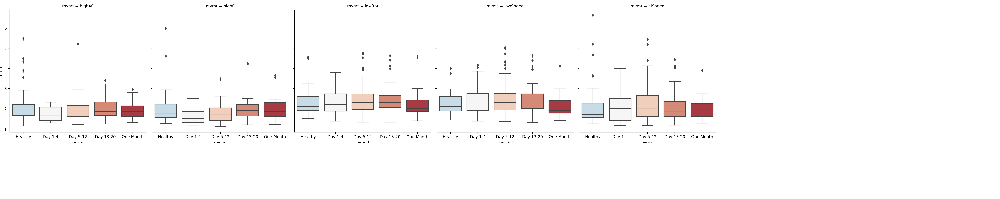

In [31]:
df = pd.read_csv(figFolder+'lfpForR.csv')
# fig, ax = plt.subplots(5,3,figsize=(17.04,4.88), sharey=True)
with sns.color_palette(colorPallet3):
    g = sns.catplot(x="period", y='ratio',col='mvmt',kind='box', data=df, order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])

<IPython.core.display.Javascript object>


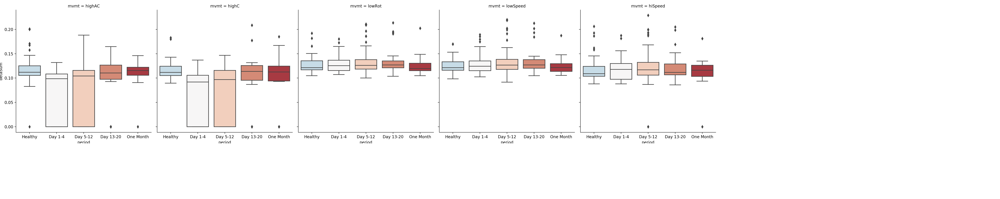

In [35]:
df = pd.read_csv(figFolder+'lfpForR.csv')
# fig, ax = plt.subplots(5,3,figsize=(17.04,4.88), sharey=True)
with sns.color_palette(colorPallet3):
    g = sns.catplot(x="period", y='betaSum',col='mvmt',kind='box', data=df, order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])

In [44]:
df = pd.DataFrame(columns = ['period','Mouse','mvmt','sess','beta','gamma'])
# # fig, ax = plt.subplots(2,3,figsize=(12.15,17.15),sharey='row')
for sess in specs.keys():
    lsBeta = np.nanmean(specs[sess]['lowSpeed'][0,beta],axis=0)
    hiBeta = np.nanmean(specs[sess]['hiSpeed'][0,beta],axis=0)
    if np.sum(np.isnan([lsBeta,hiBeta]))==0:
        df2 = pd.DataFrame({'period':specs[sess]['period'],'Mouse':specs[sess]['mouse'],'mvmt':mv,'sess':sess,
                            'beta':np.nanmean(specs[sess]['lowSpeed'][0,beta],axis=0)-np.nansum(specs[sess]['hiSpeed'][0,beta],axis=0),
                           'gamma':np.nanmean(specs[sess]['lowSpeed'][0,gamma],axis=0)-np.nansum(specs[sess]['hiSpeed'][0,gamma],axis=0)},index=[0])
        df = pd.concat([df,df2])

/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: Mean of empty slice
  """


<IPython.core.display.Javascript object>


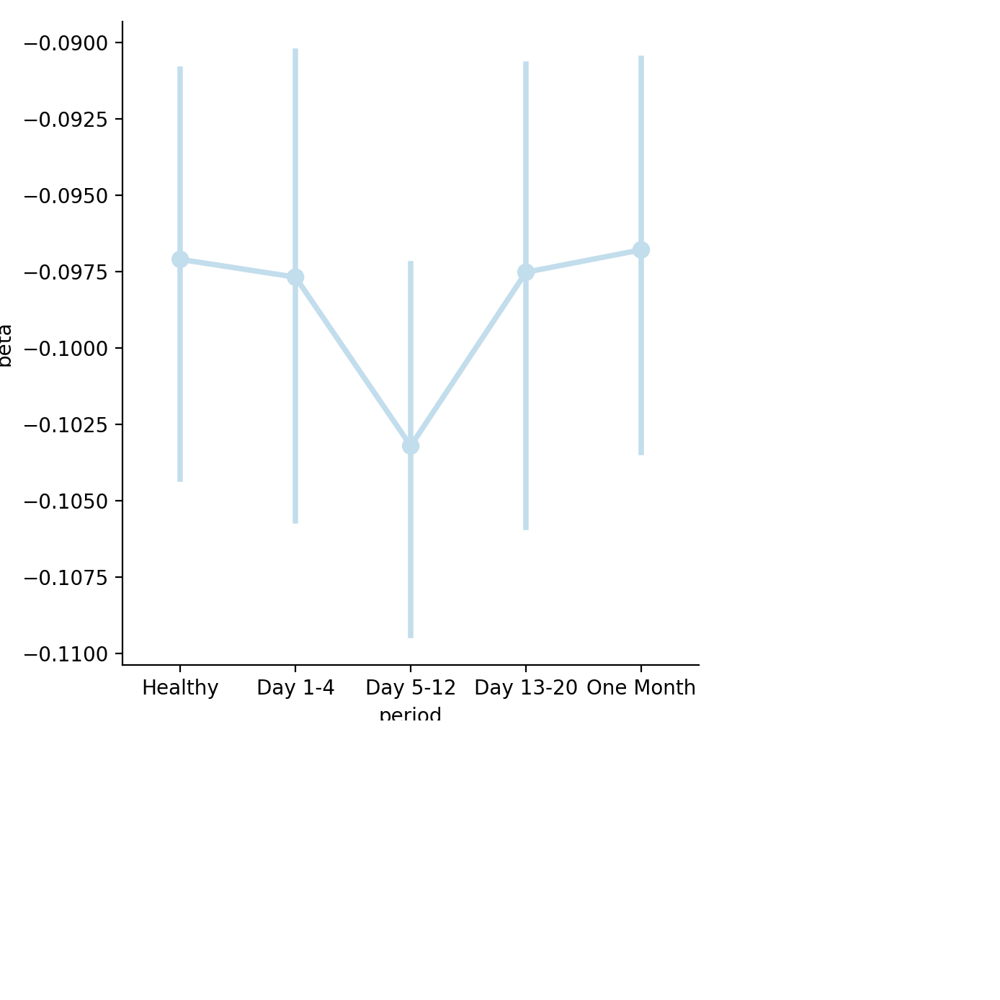

In [46]:

with sns.color_palette(colorPallet3):
    g = sns.catplot(x="period", y='beta',kind='point', data=df, order = ['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])

In [7]:
def circShiftRoll(shifts,data):
    return  np.array([np.roll(row, x) for row,x in zip(data, shifts)])

def perNeuronPerEvent(aDff,dff,onset,niter,PostS=40,preS=40):
    if np.min(dff.shape) ==1:
        aDff = np.reshape(aDff,(aDff.shape[0],1,aDff.shape[1]))
    if np.sum(onset) ==1:
        aDff = np.reshape(aDff,(aDff.shape[0],aDff.shape[1],1))
        
    nT,nN,nE = aDff.shape
    # if no event in session -> move on...
    if nE == 0:
        return None,None,None
    if onset.ndim ==1:
        onset = np.reshape(onset,(1,onset.shape[0]))
    
        
    Th = np.empty((nN,niter*nE))
#    print(nE, Th.shape,dff.shape,np.sum(onset))
#    print(nE, nN,nT)
    # calculate thersholds:
    for itr in range(0,niter):
        shifts = np.random.randint(size=1,low=0,high=onset.shape[1])
        Ons = circShiftRoll(shifts,onset)
        sdff = alignToOnset(dff.T, Ons, winPost=PostS,winPre=preS)
#         if sdff.size ==0 or sdff.ndim <2:
#             shifts = np.random.randint(size=1,low=0,high=onset.shape[1])
#             Ons = circShiftRoll(shifts,onset)
#             sdff = alignToOnset(dff.T, Ons, winPost=PostS,winPre=preS)            
#         if nN ==1:
#             sdff = np.reshape(sdff,(sdff.shape[0],1,sdff.shape[1]))
#         if nE ==1: 
#             sdff = np.reshape(sdff,(sdff.shape[0],sdff.shape[1],1))

            
        # when 1 or movement events -> could end up with no event 2 secounds in -> empty sdff
        while isinstance(sdff,int) or sdff.ndim <3:
            shifts = np.random.randint(size=1,low=0,high=onset.shape[1])
            Ons = circShiftRoll(shifts,onset)
            sdff = alignToOnset(dff.T, Ons, winPost=PostS,winPre=preS)
            try:
                if sdff.size ==0:
                    sdff = 0    
                    continue
                if nN ==1:
                    sdff = np.reshape(sdff,(sdff.shape[0],1,sdff.shape[1]))
                if nE ==1: 
                    sdff = np.reshape(sdff,(sdff.shape[0],sdff.shape[1],1))
            except: 
                sdff = 1;



        # if sdff contain negative value, shift entire session up
        mins = np.min(sdff,axis=0)
        sdff[:,mins<0] =sdff[:,mins<0]+np.abs(mins[mins<0])
        # calculate the means
#        print(sdff.shape)
        muPre = np.mean(sdff[:int(nT/2),:,:],axis=0)
        muPost = np.mean(sdff[int(nT/2):,:,:],axis=0)
        ra = muPost/muPre
        while ra.shape[1]<nE: # incase lose event cause too close to begining of time axis
             ra = np.concatenate((ra,np.mean(ra,axis=1,keepdims=True)),axis=1)    
        if ra.shape[1]>nE:
            ra = ra[:,:nE]
        Th[:,itr*nE:(itr+1)*nE] = ra

    Th = np.percentile(Th,95,axis=1)

    Th = (matlib.repmat(Th,nE,1).T)

    mins = np.min(aDff,axis=0)
    aDff[:,mins<0] =aDff[:,mins<0]+np.abs(mins[mins<0])

    prePoints = aDff[:int(nT/2),:,:]
    postPoints = aDff[int(nT/2):,:,:]

    muPre = np.mean(prePoints,axis=0)
    muPost = np.mean(postPoints,axis=0)
    results = muPost/muPre    
#    print(nE,nN,Th.shape,results.shape)
    return (results>Th),results,Th[:,0]

In [11]:
from numpy import matlib
niter = 1000
PostS=40
preS = 40
f = h5py.File('membership.hdf5','a')
miceList = getMiceList(Files[0])
faild = []
for m in miceList:
    data = getData(Files[1],['trace'],period ='Pre', mice=m)
    try:
        grp = f.create_group(m)
    except: 
        grp = f[m]
    
    for sess in tqdm(data.keys()):
        try: 
            sgrp = grp[sess]
        except: 
            sgrp = grp.create_group(sess)
        try: 
            subgroup = sgrp.create_group('mvmtOnset')
            subgroup2 = sgrp.create_group('ipsiOnset')
            subgroup3 = sgrp.create_group('contraOnset')
        except:
            subgroup = sgrp['mvmtOnset']
            subgroup2 = sgrp['ipsiOnset']
            subgroup3 = sgrp['contraOnset']

        dff = data[sess]['trace']['dff']
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','mvmtOnset2')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent(aDff,dff,onset,niter)
        if np.sum(onset) != 0:
            subgroup['result'] = result
            subgroup['rawResults'] = rawResults
            subgroup['Th'] = Th
        
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','clockWiseOnset')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent(aDff,dff,onset,niter)
        if np.sum(onset) != 0:
            subgroup3['result'] = result
            subgroup3['rawResults'] = rawResults
            subgroup3['Th'] = Th
        
        mvmtOnset = getOnsetOrPeriod(m,sess,'Pre','antiClockWiseOnset')
    #    print(mvmtOnset.shape)
        aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
        onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
    #    print(aDff.shape,onset.shape,mvmtOnset.shape)

        result,rawResults,Th = perNeuronPerEvent(aDff,dff,onset,niter)
        if np.sum(onset) != 0:
            subgroup2['result'] = result
            subgroup2['rawResults'] = rawResults
            subgroup2['Th'] = Th
#       except: 
        faild.append(sess)
#    print(result.shape)
f.close()

  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data


 14%|█▍        | 2/14 [00:05<00:31,  2.67s/it]/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/dana_z/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/3 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/17 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/19 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/13 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data


100%|██████████| 14/14 [00:41<00:00,  2.96s/it]


In [11]:
print(result)

None


In [ ]:
from numpy import matlib
niter = 1000
PostS=40
preS = 40
f = h5py.File('membership.hdf5','a')
miceList = getMiceList(Files[0])
faild = []
for m in miceList:
    data = getData(Files[1],['trace'],period ='Pre', mice=m) 
    try:
        grp = f.create_group(m)
    except: 
        grp = f[m]
    
    for sess in tqdm(data.keys()):
        try: 
            sgrp = grp[sess]
        except: 
            sgrp = grp.create_group(sess)
        try: 
            subgroup = sgrp.create_group('msnOnset')
            subgroup2 = sgrp.create_group('creOnset')
        except:
            subgroup = sgrp['msnOnset']
            subgroup2 = sgrp['creOnset']

        dff = data[sess]['trace']['dff']
        numRed = int(data[sess]['trace']['numred']) 
        Ca = getOnsetOrPeriod(m,sess,'Pre','caOnset_Hf')
        for tr in range(0,numRed):
            mvmtOnset = Ca[tr,:]==1
            if np.sum(mvmtOnset) == 0:
                continue
            aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
            onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
            result,rawResults,Th = perNeuronPerEvent(aDff,dff,onset,niter)
            if result is not None:
                if 'resultAll' not in locals():
                    resultAll = result
                    rawResultsAll = rawResults
                    ThAll = Th
                else:
                    resultAll = np.concatenate((resultAll,result),axis=1)
                    rawResultsAll = np.concatenate((rawResultsAll,rawResults),axis=1)
                    ThAll = np.concatenate((ThAll,Th),axis=0)
            
        if 'resultAll' in locals():
            try:
                subgroup2['result'] = resultAll
                subgroup2['rawResults'] = rawResultsAll
                subgroup2['Th'] = ThAll
            except:
                del subgroup2['result'],subgroup2['rawResults'],subgroup2['Th']
                subgroup2['result'] = resultAll
                subgroup2['rawResults'] = rawResultsAll
                subgroup2['Th'] = ThAll    
            del resultAll, rawResultsAll, ThAll
            
        for tr in range(numRed,Ca.shape[0]):
            mvmtOnset = Ca[tr,:]==1
            if np.sum(mvmtOnset) == 0:
                continue
            aDff = alignToOnset(dff.T, mvmtOnset, winPost=PostS,winPre=preS)
            onset = np.reshape(mvmtOnset,(1,np.max(mvmtOnset.shape)))
            result,rawResults,Th = perNeuronPerEvent(aDff,dff,onset,niter)
            if result is not None:
                if 'resultAll' not in locals():
                    resultAll = result
                    rawResultsAll = rawResults
                    ThAll = Th
                else:
                    resultAll = np.concatenate((resultAll,result),axis=1)
                    rawResultsAll = np.concatenate((rawResultsAll,rawResults),axis=1)
                    ThAll = np.concatenate((ThAll,Th),axis=0)
            
        if 'resultAll' in locals():
            try:
                subgroup['result'] = resultAll
                subgroup['rawResults'] = rawResultsAll
                subgroup['Th'] = ThAll
            except:
                del subgroup['result'],subgroup['rawResults'],subgroup['Th']
                subgroup['result'] = resultAll
                subgroup['rawResults'] = rawResultsAll
                subgroup['Th'] = ThAll 
            del resultAll, rawResultsAll, ThAll
        
#       except: 
        faild.append(sess)
#    print(result.shape)
f.close()

  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data


  0%|          | 0/14 [00:00<?, ?it/s]

cleaning up trace data


In [14]:
f = h5py.File('membership.hdf5','r')
miceList = getMiceList(Files[1])
col_names = ['Sess','Mouse','Period','Day','CellType']
df = pd.DataFrame(columns=col_names)
for m in miceList:
    grp = f[m]
    sessions = list(grp.keys())
    for sess in sessions:
        try:
            data = grp[sess]['mvmtOnset']['result'].value
            meanR_mvmtOnset = np.mean(data,axis=1)
        except:
            print(sess,'mvmt')
            meanR_mvmtOnset = np.nan
            
        try:
            data = grp[sess]['ipsiOnset']['result'].value
            meanR_ipsiOnset = np.mean(data,axis=1)
        except:
            print(sess,'ipsi')
            meanR_ipsiOnset = np.nan
            
        try:
            data = grp[sess]['contraOnset']['result'].value
            meanR_contraOnset = np.mean(data,axis=1)
        except:
            print(sess,'contra')
            meanR_contraOnset =np.nan
        
        if sess[5] == 'B':
                day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        cre = getCreType(Files[1],m)
        nRed = getNumRed(Files[1],m,sess[5:])
        try:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_ipsiOnset':meanR_ipsiOnset,
                                'meanR_contraOnset':meanR_contraOnset})
        except:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset,
                                'meanR_ipsiOnset':meanR_ipsiOnset,
                                'meanR_contraOnset':meanR_contraOnset},index = [0])
        df2.loc[:nRed-1,'CellType'] = cre
        df = pd.concat([df,df2],sort=True)

/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  # Remove the CWD from sys.path while we load stuff.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:24: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.


0761_day10 contra
0761_day12 contra
0761_day19L contra
0761_day2 contra
0761_day31A contra
0761_day35L mvmt
0761_day35L contra
0761_day6 contra
0761_day8 contra
1208_day15A contra
1208_day19L contra
1208_day2 contra
1208_day34L contra
1222_day11 ipsi
1222_day20L ipsi
1222_day36L contra
1222_day5 mvmt
1222_day5 ipsi
1231_BaselineL ipsi
1231_BaselineS ipsi
1236_day13 contra
1793_BaselineA contra
1793_day12 contra
1793_day14 contra
2976_BaselineA ipsi
2976_day14 contra
2976_day35L contra
2976_day8 ipsi
2976_day8 contra
2980_day14 contra
2980_day15A ipsi
2980_day19L contra
2980_day8 contra
2981_day10 ipsi
2981_day12 ipsi
2981_day15A contra
2981_day2 ipsi
2981_day6 ipsi
2981_day8 ipsi
4539_BaselineA ipsi
4539_day1 ipsi
4539_day1 contra
4539_day10 ipsi
4539_day10 contra
4539_day11 ipsi
4539_day11 contra
4539_day12 ipsi
4539_day12 contra
4539_day13 ipsi
4539_day13 contra
4539_day14 ipsi
4539_day14 contra
4539_day2 ipsi
4539_day2 contra
4539_day3 ipsi
4539_day3 contra
4539_day30A ipsi
4539_day

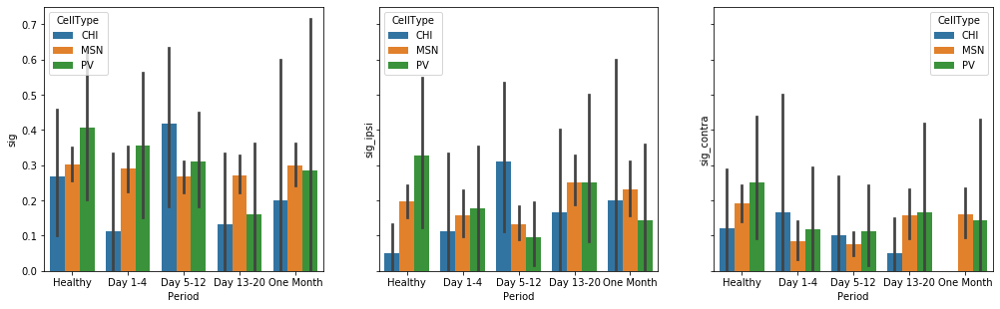

In [132]:
%matplotlib inline
df2 = df
df2['care'] = df2.meanR_mvmtOnset.apply(lambda x: x>0.05)
df2['sig'] = df2.meanR_mvmtOnset.apply(lambda x: x>0.15)

df2['care_ipsi'] = df2.meanR_ipsiOnset.apply(lambda x: x>0.05)
df2['sig_ipsi'] = df2.meanR_ipsiOnset.apply(lambda x: x>0.15)

df2['care_contra'] = df2.meanR_contraOnset.apply(lambda x: x>0.05)
df2['sig_contra'] = df2.meanR_contraOnset.apply(lambda x: x>0.15)

df2 = df2.groupby(['Sess','Period','CellType']).mean()
df2.reset_index(inplace=True)

fig, ax = plt.subplots(1,3,figsize=(17.04,4.88),sharey=True)
sns.barplot(x='Period',y='sig',hue='CellType',data=df2, ax = ax[0])
sns.barplot(x='Period',y='sig_ipsi',hue='CellType',data=df2, ax = ax[1])
sns.barplot(x='Period',y='sig_contra',hue='CellType',data=df2, ax = ax[2])



<IPython.core.display.Javascript object>


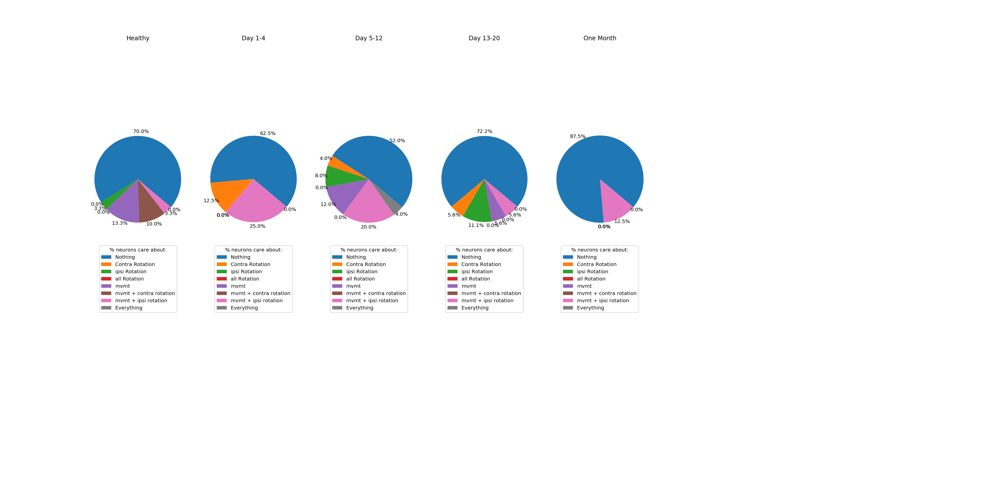

sig CHI Healthy
1.0 False
sig CHI Day 5-12
0.561646192289054 False
sig CHI Day 13-20
0.28155330659235744 False
sig CHI One Month
0.6503169957679098 False
sig CHI Day 1-4
1.0 False
sig_ipsi CHI Healthy
1.0 False
sig_ipsi CHI Day 5-12
0.0315490430492672 False
sig_ipsi CHI Day 13-20
0.34914010596249306 False
sig_ipsi CHI One Month
0.5187292555713613 False
sig_ipsi CHI Day 1-4
0.18871503082029395 False
sig_contra CHI Healthy
1.0 False
sig_contra CHI Day 5-12
1.0 False
sig_contra CHI Day 13-20
1.0 False
sig_contra CHI One Month
1.0 False
sig_contra CHI Day 1-4
1.0 False


<IPython.core.display.Javascript object>


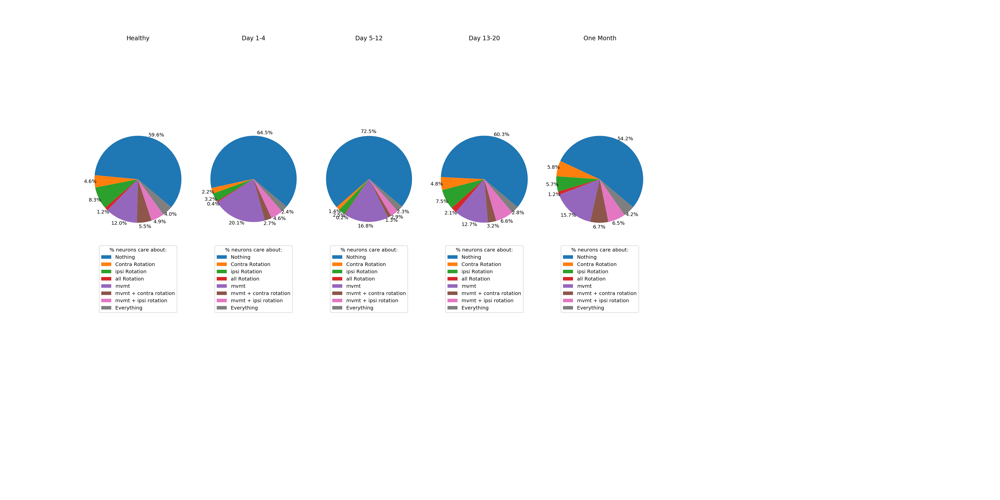

sig MSN Healthy
1.0 False
sig MSN Day 1-4
2.6137846540734915e-05 True
sig MSN Day 5-12
3.253375258044111e-06 True
sig MSN Day 13-20
0.15983431246082058 False
sig MSN One Month
9.846970065651429e-14 True
sig_ipsi MSN Healthy
1.0 False
sig_ipsi MSN Day 1-4
2.689714044725155e-32 True
sig_ipsi MSN Day 5-12
6.701557185936019e-104 True
sig_ipsi MSN Day 13-20
0.3298492761473246 False
sig_ipsi MSN One Month
0.3082598216821215 False
sig_contra MSN Healthy
1.0 False
sig_contra MSN Day 1-4
9.276436212613224e-37 True
sig_contra MSN Day 5-12
6.049269395320141e-122 True
sig_contra MSN Day 13-20
7.794091924017672e-05 True
sig_contra MSN One Month
0.00022932345489296545 True


<IPython.core.display.Javascript object>


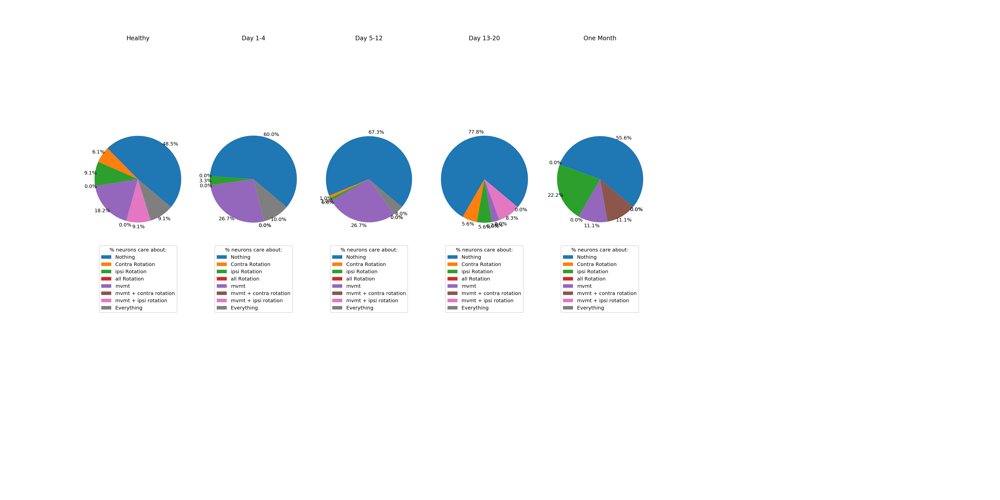

sig PV Healthy
1.0 False
sig PV Day 1-4
1.0 False
sig PV Day 5-12
0.6679001428814498 False
sig PV Day 13-20
0.021090414690959146 False
sig PV One Month
0.6924514940070305 False
sig_ipsi PV Healthy
1.0 False
sig_ipsi PV Day 1-4
0.2205990606539367 False
sig_ipsi PV Day 5-12
0.0010144847794942534 True
sig_ipsi PV Day 13-20
0.2331060383788323 False
sig_ipsi PV One Month
1.0 False
sig_contra PV Healthy
1.0 False
sig_contra PV Day 1-4
0.7104458840906086 False
sig_contra PV Day 5-12
0.06611219983284598 False
sig_contra PV Day 13-20
0.2468177507113256 False
sig_contra PV One Month
1.0 False


In [149]:
%matplotlib notebook
# N = 5
# for sig in ['sig','sig_ipsi','sig_contra']:
#     for cell in df.CellType.unique():
#         df3 = df[(df.CellType ==cell)]
#         dfHealthy = df3[df3.Period == 'Healthy']
#         yesVals = []
#         noValse = []
#         for period in df3.Period.unique():
#             dfComp = df3[df3.Period == period]
#             print(sig,cell,period)
#             oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True].sig.count(), dfHealthy[dfHealthy[sig] == False].sig.count()], [dfComp[dfComp[sig] == True].sig.count(), dfComp[dfComp[sig] == False].sig.count()]])
#             print(pvalue, pvalue<0.05/(N-1))
   
a = df.groupby(['sig','sig_ipsi','sig_contra']).Day.count()
levels = [a.index.levels[0].values, a.index.levels[1].values,a.index.levels[2].values]
new_index = pd.MultiIndex.from_product(levels, names=a.index.names)

my_labels = ['Nothing','Contra Rotation','ipsi Rotation','all Rotation','mvmt','mvmt + contra rotation',
                 'mvmt + ipsi rotation','Everything']
# fig, ax  = plt.subplots(1,5,figsize=(10, 10))
for cell in df.CellType.unique():
    inds = 0;
    fig, ax  = plt.subplots(1,5,figsize=(20, 10))
    for period in df.Period.unique():

        dfPlot = df[(df.CellType == cell)&(df.Period == period)].groupby(['sig','sig_ipsi','sig_contra']).Day.count()
        dfPlot = dfPlot.reindex(new_index, fill_value=0)

        wedges, texts, autotexts =ax[inds].pie(dfPlot,startangle=-40,autopct='%1.1f%%',pctdistance=1.1)


    #           bbox_to_anchor=(1, 0, 0.5, 1))
    #     plt.setp(texts, fontsize=25)
        ax[inds].set_title(period)
        ax[inds].axis('equal')

        
        ax[inds].legend(wedges, my_labels,
                  title="% neurons care about:",
                  loc="lower center")
        inds = inds+1
    fig.savefig(figFolder+'pieCharts_'+cell+'.png',transparent=True,format='png')
    for sig in ['sig','sig_ipsi','sig_contra']:
        df3 = df[(df.CellType ==cell)]
        dfHealthy = df3[df3.Period == 'Healthy']
        yesVals = []
        noValse = []
        for period in df3.Period.unique():
            dfComp = df3[df3.Period == period]
            print(sig,cell,period)
            oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True].sig.count(), dfHealthy[dfHealthy[sig] == False].sig.count()], [dfComp[dfComp[sig] == True].sig.count(), dfComp[dfComp[sig] == False].sig.count()]])
            print(pvalue, pvalue<0.05/(N-1))
#df.groupby(['CellType','Period','sig','sig_ipsi','sig_contra']).count()

<IPython.core.display.Javascript object>


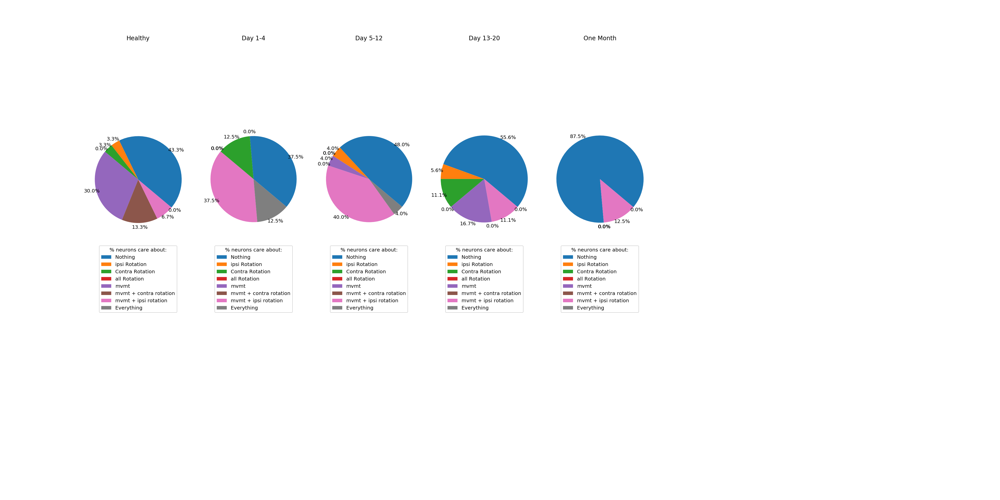

<IPython.core.display.Javascript object>


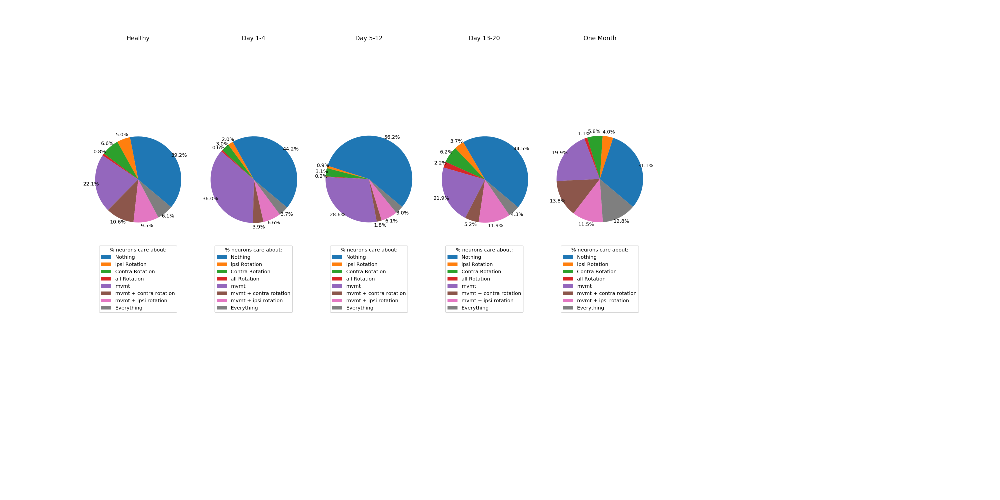

care MSN Healthy
1.0 False
healthy: 4301 8898 0.48336704877500564
vs.  4301 8898 0.48336704877500564
care MSN Day 1-4
0.039277830582900304 False
healthy: 4301 8898 0.48336704877500564
vs.  2163 4304 0.5025557620817844
care MSN Day 5-12
2.804226795480804e-34 True
healthy: 4301 8898 0.48336704877500564
vs.  4187 10567 0.3962335573010315
care MSN Day 13-20
3.9912617350288075e-09 True
healthy: 4301 8898 0.48336704877500564
vs.  2523 5815 0.43387790197764403
care MSN One Month
4.308800397783833e-22 True
healthy: 4301 8898 0.48336704877500564
vs.  1979 3408 0.5806924882629108
care_ipsi MSN Healthy
1.0 False
healthy: 2059 8898 0.23140031467745562
vs.  2059 8898 0.23140031467745562
care_ipsi MSN Day 1-4
4.7827955687886255e-37 True
healthy: 2059 8898 0.23140031467745562
vs.  598 4304 0.13894052044609664
care_ipsi MSN Day 5-12
9.009545725802025e-86 True
healthy: 2059 8898 0.23140031467745562
vs.  1315 10567 0.12444402384782814
care_ipsi MSN Day 13-20
0.03568022457451808 False
healthy: 2059 8898 

<IPython.core.display.Javascript object>


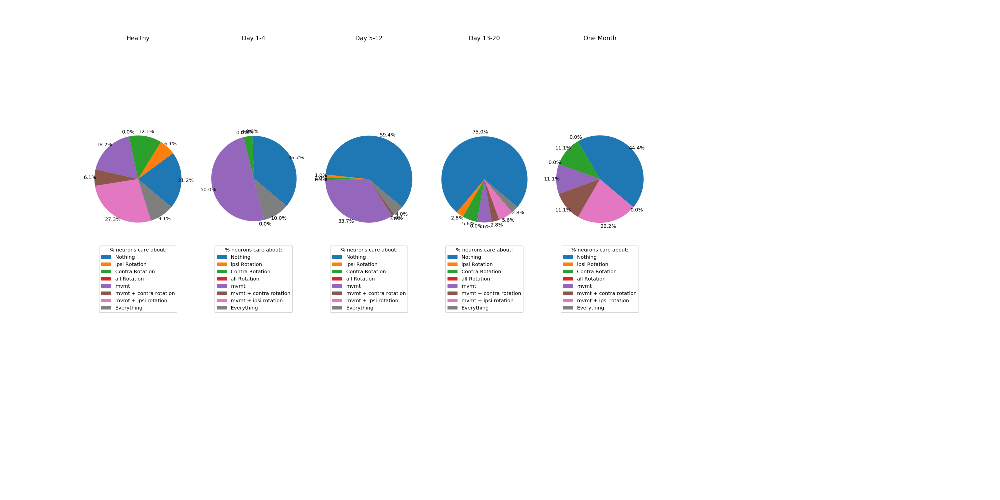

In [154]:
%matplotlib notebook
# N = 5
# for sig in ['sig','sig_ipsi','sig_contra']:
#     for cell in df.CellType.unique():
#         df3 = df[(df.CellType ==cell)]
#         dfHealthy = df3[df3.Period == 'Healthy']
#         yesVals = []
#         noValse = []
#         for period in df3.Period.unique():
#             dfComp = df3[df3.Period == period]
#             print(sig,cell,period)
#             oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True].sig.count(), dfHealthy[dfHealthy[sig] == False].sig.count()], [dfComp[dfComp[sig] == True].sig.count(), dfComp[dfComp[sig] == False].sig.count()]])
#             print(pvalue, pvalue<0.05/(N-1))
     
a = df.groupby(['care','care_ipsi','care_contra']).Day.count()
levels = [a.index.levels[0].values, a.index.levels[1].values,a.index.levels[2].values]
new_index = pd.MultiIndex.from_product(levels, names=a.index.names)

my_labels = ['Nothing','ipsi Rotation','Contra Rotation','all Rotation','mvmt','mvmt + contra rotation',
                 'mvmt + ipsi rotation','Everything']
# fig, ax  = plt.subplots(1,5,figsize=(10, 10))
for cell in df.CellType.unique():
    inds = 0;
    fig, ax  = plt.subplots(1,5,figsize=(20, 10))
    for period in df.Period.unique():

        dfPlot = df[(df.CellType == cell)&(df.Period == period)].groupby(['care','care_ipsi','care_contra']).Day.count()
        dfPlot = dfPlot.reindex(new_index, fill_value=0)

        wedges, texts, autotexts =ax[inds].pie(dfPlot,startangle=-40,autopct='%1.1f%%',pctdistance=1.1)


    #           bbox_to_anchor=(1, 0, 0.5, 1))
    #     plt.setp(texts, fontsize=25)
        ax[inds].set_title(period)
        ax[inds].axis('equal')

        
        ax[inds].legend(wedges, my_labels,
                  title="% neurons care about:",
                  loc="lower center")
        inds = inds+1
    fig.savefig(figFolder+'pieCharts_lessStrict_'+cell+'.png',transparent=True,format='png')
    for sig in ['care','care_ipsi','care_contra']:
        df3 = df[(df.CellType ==cell)]
        dfHealthy = df3[df3.Period == 'Healthy']
        yesVals = []
        noValse = []
        for period in df3.Period.unique():
            dfComp = df3[df3.Period == period]
           
            oddsratio, pvalue = sci.stats.fisher_exact([[dfHealthy[dfHealthy[sig] == True].sig.count(), dfHealthy[dfHealthy[sig] == False].sig.count()], [dfComp[dfComp[sig] == True].sig.count(), dfComp[dfComp[sig] == False].sig.count()]])
            if cell == 'MSN':
                print(sig,cell,period)
                print(pvalue, pvalue<0.05/(N-1))
                print('healthy:', dfHealthy[dfHealthy[sig] == True].sig.count(),dfHealthy.sig.count(),dfHealthy[dfHealthy[sig] == True].sig.count()/dfHealthy.sig.count())
                print('vs. ', dfComp[dfComp[sig] == True].sig.count(), dfComp.sig.count(),dfComp[dfComp[sig] == True].sig.count()/dfComp.sig.count())
            
#df.groupby(['CellType','Period','sig','sig_ipsi','sig_contra']).count()

In [148]:
dfPlot = df[(df.CellType == cell)&(df.Period == period)].groupby(['care','care_ipsi','care_contra']).Day.count()
dfPlot = dfPlot.reindex(new_index, fill_value=0)
print(dfPlot)
dfPlot = df[(df.CellType == cell)&(df.Period == period)].groupby(['care','care_ipsi','care_contra']).Day.count()
dfPlot

care   care_ipsi  care_contra
False  False      False          13
                  True            1
       True       False           1
                  True            0
True   False      False           9
                  True            4
       True       False           2
                  True            0
Name: Day, dtype: int64


care   care_ipsi  care_contra
False  False      False          13
                  True            1
       True       False           1
True   False      False           9
                  True            4
       True       False           2
Name: Day, dtype: int64

In [63]:
# repeat only movement: 
f = h5py.File('membership.hdf5','r')
miceList = getMiceList(Files[1])
col_names = ['Sess','Mouse','Period','Day','CellType']
df = pd.DataFrame(columns=col_names)
for m in miceList:
    grp = f[m]
    sessions = list(grp.keys())
    for sess in sessions:
        try:
            data = grp[sess]['mvmtOnset']['result'].value
            meanR_mvmtOnset = np.mean(data,axis=1)
        except:
            print(sess,'mvmt')
            meanR_mvmtOnset = np.nan
        
        if sess[5] == 'B':
                day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        cre = getCreType(Files[1],m)
        nRed = getNumRed(Files[1],m,sess[5:])
        try:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset})
        except:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_mvmtOnset':meanR_mvmtOnset},index = [0])
        df2.loc[:nRed-1,'CellType'] = cre
        df = pd.concat([df,df2],sort=True)

/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  # This is added back by InteractiveShellApp.init_path()


0761_day35L mvmt
1222_day5 mvmt
7909_day11 mvmt
7909_day7 mvmt
8430_BaselineA mvmt
8430_day30A mvmt
8803_day12 mvmt


<IPython.core.display.Javascript object>


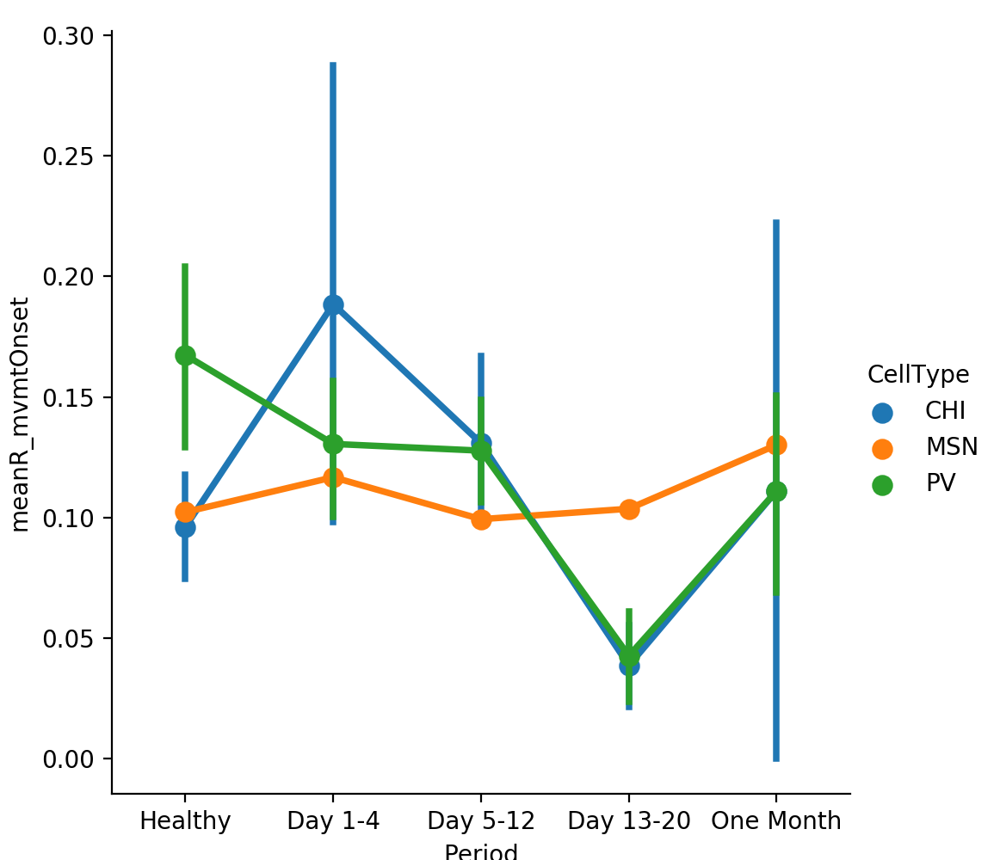

In [11]:
sns.catplot(x="Period", y="meanR_mvmtOnset", hue="CellType", kind="point",ci=68, data=df)


<IPython.core.display.Javascript object>


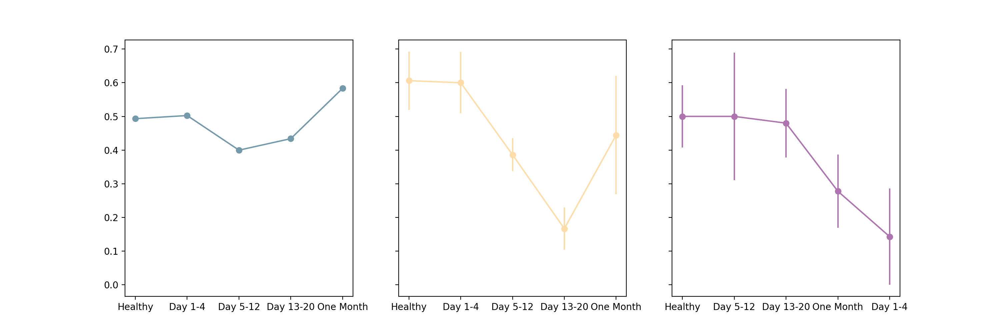

In [65]:
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])
df['care'] = df.meanR_mvmtOnset.apply(lambda x: x>0.05)

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['Period'] = df[df.CellType == cond[idx]].Period.unique()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').care.count()
    df2['SEM'] = df[df.CellType == cond[idx]].groupby('Period').care.std()/np.sqrt(df2['count'])
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o', color = Colors[cond[idx]])
    del df2
# fig.savefig(figFolder+'figure1a_Ca_'+str(egSess[0])+"_"+str(egSess[1][5:])+'.png')


In [60]:
del df2
df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
df2['Period'] = df[df.CellType == cond[idx]].Period.unique()
df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').mean()
df2['std']  = df[df.CellType == cond[idx]].groupby('Period').std()
df2['count']  = df[df.CellType == cond[idx]].groupby('Period').meanR_mvmtOnset.count()
df2['SEM'] = df[df.CellType == cond[idx]].groupby('Period').meanR_mvmtOnset.std()/np.sqrt(df2['count'])
df2

,meanR_mvmtOnset,Period,mean,std,count,SEM
Period,,,,,,
Healthy,0.096090,Healthy,0.096090,0.127579,30,0.023293
Day 1-4,0.188520,Day 5-12,0.188520,0.282198,8,0.099772
Day 5-12,0.130844,Day 13-20,0.130844,0.168069,25,0.033614
Day 13-20,0.038645,One Month,0.038645,0.076080,18,0.017932
One Month,0.111111,Day 1-4,0.111111,0.272166,6,0.111111


In [66]:
f = h5py.File('membership.hdf5','r')
miceList = getMiceList(Files[1])
col_names = ['Sess','Mouse','Period','Day','CellType']
df = pd.DataFrame(columns=col_names)
for m in miceList:
    grp = f[m]
    sessions = list(grp.keys())
    for sess in sessions:
        try:
            data = grp[sess]['ipsiOnset']['result'].value
            meanR_ipsiOnset = np.mean(data,axis=1)
        except:
            print(sess,'ipsi')
            meanR_ipsiOnset = np.nan
            
        try:
            data = grp[sess]['contraOnset']['result'].value
            meanR_contraOnset = np.mean(data,axis=1)
        except:
            print(sess,'contra')
            meanR_contraOnset =np.nan
        
        if sess[5] == 'B':
                day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        cre = getCreType(Files[1],m)
        nRed = getNumRed(Files[1],m,sess[5:])
        try:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_ipsiOnset':meanR_ipsiOnset,
                                'meanR_contraOnset':meanR_contraOnset})
        except:
            df2 = pd.DataFrame({'Sess':sess,'Mouse':m,'Period':periodCalc(day),
                                'Day':day,'CellType':'MSN',
                                'meanR_ipsiOnset':meanR_ipsiOnset,
                                'meanR_contraOnset':meanR_contraOnset},index = [0])
        df2.loc[:nRed-1,'CellType'] = cre
        df = pd.concat([df,df2],sort=True)

df['care_ipsi'] = df.meanR_ipsiOnset.apply(lambda x: x>0.05)
df['care_contra'] = df.meanR_contraOnset.apply(lambda x: x>0.05)


/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  # Remove the CWD from sys.path while we load stuff.
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.


0761_day10 contra
0761_day12 contra
0761_day19L contra
0761_day2 contra
0761_day31A contra
0761_day35L contra
0761_day6 contra
0761_day8 contra
1208_day15A contra
1208_day19L contra
1208_day2 contra
1208_day34L contra
1222_day11 ipsi
1222_day20L ipsi
1222_day36L contra
1222_day5 ipsi
1231_BaselineL ipsi
1231_BaselineS ipsi
1236_day13 contra
1793_BaselineA contra
1793_day12 contra
1793_day14 contra
2976_BaselineA ipsi
2976_day14 contra
2976_day35L contra
2976_day8 ipsi
2976_day8 contra
2980_day14 contra
2980_day15A ipsi
2980_day19L contra
2980_day8 contra
2981_day10 ipsi
2981_day12 ipsi
2981_day15A contra
2981_day2 ipsi
2981_day6 ipsi
2981_day8 ipsi
4539_BaselineA ipsi
4539_day1 ipsi
4539_day1 contra
4539_day10 ipsi
4539_day10 contra
4539_day11 ipsi
4539_day11 contra
4539_day12 ipsi
4539_day12 contra
4539_day13 ipsi
4539_day13 contra
4539_day14 ipsi
4539_day14 contra
4539_day2 ipsi
4539_day2 contra
4539_day3 ipsi
4539_day3 contra
4539_day30A ipsi
4539_day4 ipsi
4539_day4 contra
4539_day

<IPython.core.display.Javascript object>


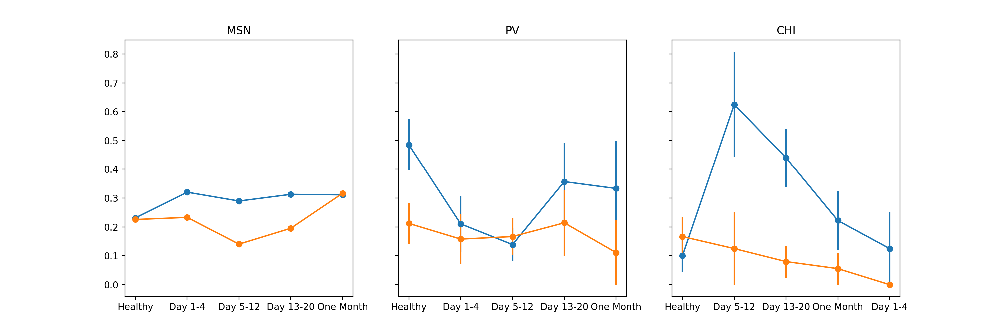

In [74]:
df.Period = df.Period.astype("category")
df.Period = df.Period.cat.reorder_categories(['Healthy', 'Day 1-4', 'Day 5-12', 'Day 13-20', 'One Month'])

fig, ax = plt.subplots(1,3,figsize=(15,5),sharey=True)
Colors = CP('creType')
cond = ['MSN','PV','CHI']
for idx in range(0,3):
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['Period'] = df[df.CellType == cond[idx]].Period.unique()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care_ipsi.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care_ipsi.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').care_ipsi.count()
    df2['SEM'] = df[df.CellType == cond[idx]].groupby('Period').care_ipsi.std()/np.sqrt(df2['count'])
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o',label="ipsileteral")
    
    del df2
    df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
    df2['Period'] = df[df.CellType == cond[idx]].Period.unique()
    df2['mean'] = df[df.CellType == cond[idx]].groupby('Period').care_contra.mean()
    df2['std']  = df[df.CellType == cond[idx]].groupby('Period').care_contra.std()
    df2['count']  = df[df.CellType == cond[idx]].groupby('Period').care_contra.count()
    df2['SEM'] = df[df.CellType == cond[idx]].groupby('Period').care_contra.std()/np.sqrt(df2['count'])
    ax[idx].errorbar(df2.Period, df2['mean'], yerr=df2.SEM, fmt='-o',label="contrlateral")
    
    ax[idx].set_title(cond[idx])
    
    del df2
# fig.savefig(figFolder+'figure1a_Ca_'+str(egSess[0])+"_"+str(egSess[1][5:])+'.png')


In [72]:
df2 = df[df.CellType == cond[idx]].groupby('Period').mean()
df2['Period'] = df[df.CellType == cond[idx]].Period.unique()
df2

,meanR_contraOnset,meanR_ipsiOnset,care_ipsi,care_contra,Period
Period,,,,,
Healthy,0.072807,0.087954,0.231400,0.225781,Healthy
Day 1-4,0.084306,0.112352,0.320472,0.233119,Day 1-4
Day 5-12,0.075598,0.104454,0.289839,0.140401,Day 5-12
Day 13-20,0.107951,0.106436,0.313032,0.195372,Day 13-20
One Month,0.077947,0.079504,0.311326,0.316608,One Month


In [90]:
speedData = []

miceList = getMiceList(Files[1])
for m in miceList:
    data = getData(Files[1],['speed'],period ='Post', mice=m,drug=b'Amphetamin')
    
    # calculte % high speed + % low speed
    for sess in data:
        # find the day of the session
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        
        row = {'Mouse':m,'Session':sess,'Day':day}
        Hp = getOnsetOrPeriod(m,sess,'Post','HighMvmtPeriods_vector')
        Lp = getOnsetOrPeriod(m,sess,'Post','LowMvmtPeriods_vector')
        comb = Hp*1+((Lp*1)-1)*-1
                
        row['percent_low'] = np.sum(Lp*1)/len(Lp)
        row['percent_high'] = np.sum(Hp*1)/len(Hp)
        row['percent_medium'] = np.sum(comb==1)/len(comb)
        
        trans = comb[1:]-comb[:-1]
        
        row['tran_all'] = np.sum(np.abs(trans!=0))
        row['tran_low2any'] = np.sum(np.abs(Lp[1:]*1-Lp[:-1]*1))
        row['tran_high2any'] = np.sum(np.abs(Hp[1:]*1-Hp[:-1]*1))
        
        row['MvmtOnset'] = np.sum(getOnsetOrPeriod(m,sess,'Post','mvmtOnset'))        
        speedData.append(row)
          
df = pd.DataFrame(speedData)        
df['Period'] =  df.apply (lambda row: periodCalc(row.Day) , axis=1)

cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data


/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value


<IPython.core.display.Javascript object>


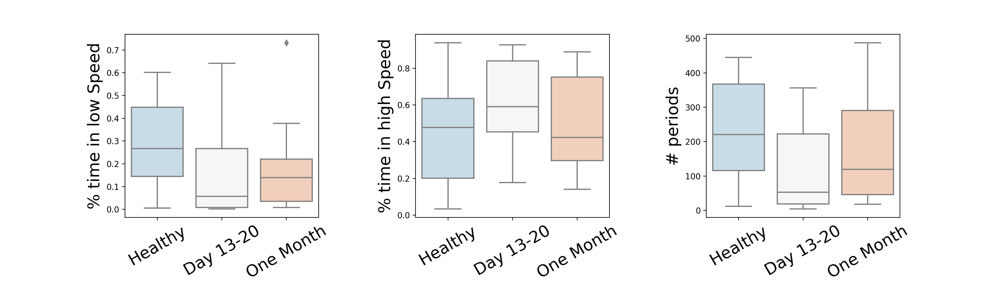

In [91]:
df.to_csv(figFolder+'postAmphSpeed2R.csv')
df2 = df.groupby(['Mouse','Period']).mean()
df2.reset_index(inplace=True)

fig, ax = plt.subplots(1,3,figsize=(17.04,4.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24})
pOrder = ['Healthy','Day 13-20','One Month']
with sns.color_palette(colorPallet3):#sns.color_palette("PuBuGn_d"):
    columns = ['percent_low','percent_high','tran_low2any'] 
    labels = ['% time in low Speed','% time in high Speed','# periods']
    for ind in range(len(columns)):
        sns.boxplot(x="Period", y=columns[ind], data=df2,ax =ax[ind],order = pOrder)
        #sns.scatterplot(x="Period", y=columns[ind], data=df2,ax =ax[ind])
        ax[ind].set_xticklabels(ax[ind].get_xticklabels(),rotation=30,fontsize=20)
        ax[ind].set_ylabel(labels[ind],fontsize=20)
        ax[ind].set_xlabel("")
        
        
fig.savefig(figFolder+'figure2_post_abc.png',transparent=False,format='png')
fig.savefig(figFolder+'figure2_post_abc.svg',transparent=True,format='svg')


<IPython.core.display.Javascript object>


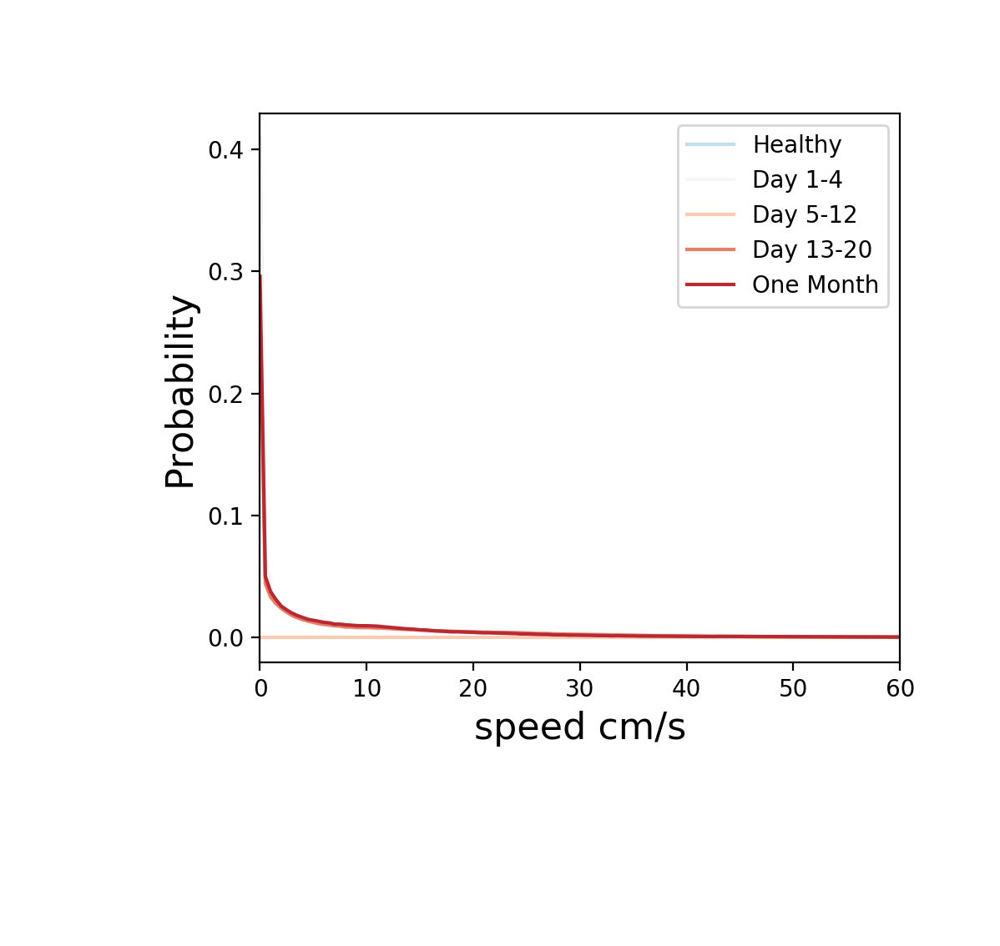

/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value


cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
I deleted session: 4539_day0
cleaning up speed data
I deleted session: 7584_Baseline0
I deleted session: 7584_day0
cleaning up speed data
I deleted session: 7909_day0
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
I deleted session: 0761_day1
I deleted session: 0761_day2
I deleted session: 0761_day4
cleaning up speed data
I deleted session: 1208_day2
I deleted session: 1208_day4
cleaning up speed data
I deleted session: 1222_day2
I deleted session: 1222_day3
cleaning up speed data
cleaning up speed data
I deleted session: 1236_day1
I deleted session: 1236_day3
cleaning up speed data
cleaning up speed data
I deleted session: 1793_day2
I deleted session: 1793_day4
cleaning up speed data
I delete

/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


I deleted session: 4539_day12
I deleted session: 4539_day5
I deleted session: 4539_day6
I deleted session: 4539_day7
I deleted session: 4539_day8
I deleted session: 4539_day9
cleaning up speed data
I deleted session: 7584_day10
I deleted session: 7584_day11
I deleted session: 7584_day12
I deleted session: 7584_day5
I deleted session: 7584_day6
I deleted session: 7584_day7
I deleted session: 7584_day8
I deleted session: 7584_day9
cleaning up speed data
I deleted session: 7909_day10
I deleted session: 7909_day11
I deleted session: 7909_day12
I deleted session: 7909_day5
I deleted session: 7909_day6
I deleted session: 7909_day7
I deleted session: 7909_day8
I deleted session: 7909_day9
cleaning up speed data
I deleted session: 8430_day11
I deleted session: 8430_day5
I deleted session: 8430_day7
I deleted session: 8430_day9
cleaning up speed data
I deleted session: 8803_day10
I deleted session: 8803_day12
I deleted session: 8803_day5
I deleted session: 8803_day6
I deleted session: 8803_day8

/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/home/dana_z/ssd_2TB/6OHDA/IO.py:152: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  speed = hf[m][s]['mvmt']['speed'].value
/home/dana_z/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data
cleaning up speed data


In [80]:
periods = {'Healthy':lambda x: x==0,
           'Day 1-4':lambda x: x<5,
           'Day 5-12':lambda x: (x>4) & (x<13),
           'Day 13-20':lambda x: (x>12) & (x<21),
           'One Month':lambda x: x>21}

fig, ax = plt.subplots(1,1,figsize=(5.99,5.67),gridspec_kw = {'hspace':.1,'bottom':0.3,'left':.26})
for indP,p in enumerate(periods.keys()):
    #to make sure mice are equally represented in each period
    weightsH = np.zeros((199,))
    for m in miceList:
        dataH = getData(Files[1],['speed'],period ='Post', day = periods[p],mice = m)
        speedM = np.empty((1,0))
        for sess in dataH:
            speedM = np.concatenate((speedM, dataH[sess]['speed']['speed']), axis=1)
        hist, bin_edges = np.histogram(speedM, bins=np.arange(0,200)*0.5)
        hist  = hist/np.nansum(hist) # normalize per mouse
        weightsH = np.nansum((weightsH, hist),axis=0)

    ax.plot(np.arange(0,199)*0.5,weightsH/16,label=p,color=a3[indP+2,:])    
ax.set_xlim(0,60)
ax.set_xlabel('speed cm/s',fontsize=16)
ax.set_ylabel('Probability',fontsize=16)
ax.legend(fontsize=10)
fig.savefig(figFolder+'figure2_post_d.png',transparent=False,format='png')
fig.savefig(figFolder+'figure2_post_d.svg',transparent=True,format='svg')

<IPython.core.display.Javascript object>


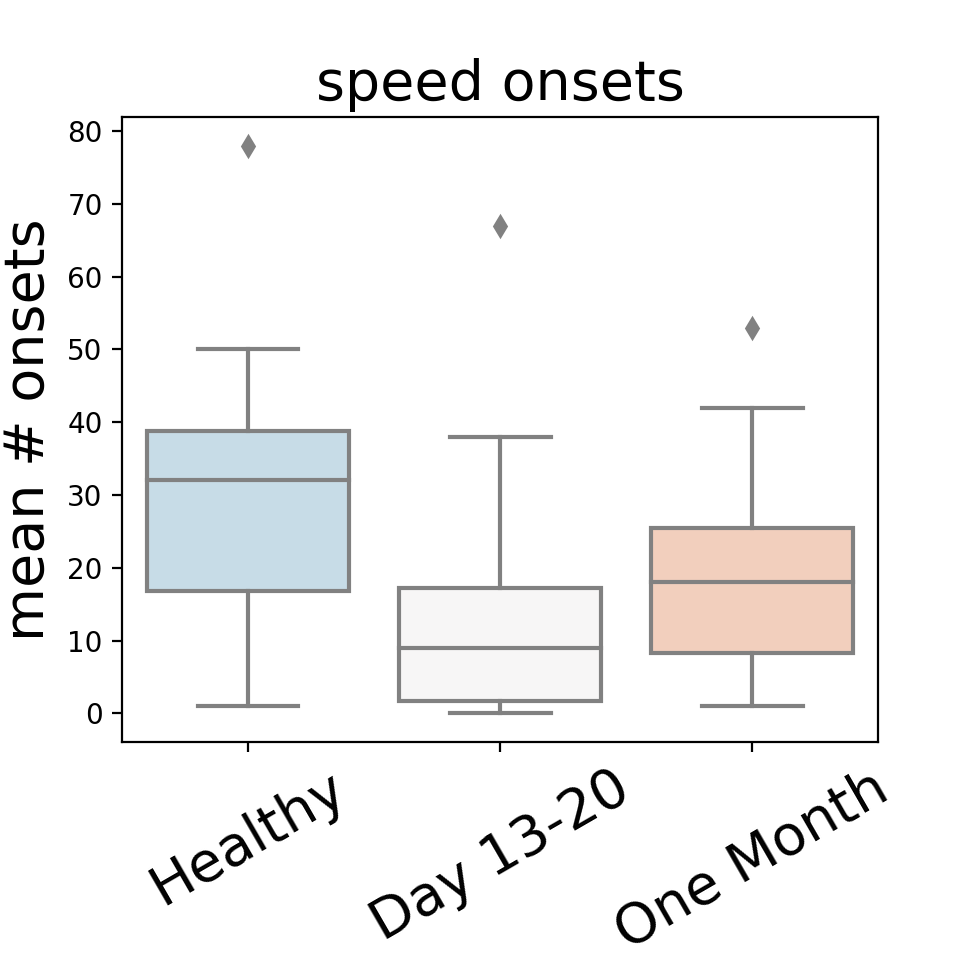

In [81]:
df2 = df.groupby(['Mouse','Period']).mean()
df2.reset_index(inplace=True)

fig, ax = plt.subplots(1,1,figsize=(4.88,4.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24})
pOrder = ['Healthy','Day 13-20','One Month']
with sns.color_palette(colorPallet3):#sns.color_palette("PuBuGn_d"):
    columns = ['MvmtOnset'] 
    labels = ['speed onsets']
    for ind in range(len(columns)):
        sns.boxplot(x="Period", y=columns[ind], data=df2,ax =ax,order = pOrder)
        #sns.scatterplot(x="Period", y=columns[ind], data=df2,ax =ax[ind])
        ax.set_xticklabels(ax.get_xticklabels(),rotation=30,fontsize=20)
        ax.set_ylabel("mean # onsets",fontsize=20)
        ax.set_xlabel("")
        ax.set_title(labels[ind],fontsize=20)
        
fig.savefig(figFolder+'figure2_post_e.png',transparent=False,format='png')
fig.savefig(figFolder+'figure2_post_e.svg',transparent=True,format='svg')


<h3> Figure 3 </h3>

In [85]:
rotData = []

miceList = getMiceList(Files[1])
for m in miceList:
    data = getData(Files[1],['rot'],period ='Post', mice=m, drug = b'Amphetamin')
    
    # calculte % high rot + % low rot
    for sess in data:
        # find the day of the session
        if sess[5] == 'B':
            day = 0
        else:
            day = int(re.findall(r'\d+',sess[5:])[0])
        
        row = {'Mouse':m,'Session':sess,'Day':day}
        hACp = getOnsetOrPeriod(m,sess,'Post','hiACRotPeriods_vector')
        hCp = getOnsetOrPeriod(m,sess,'Post','hiCRotPeriods_vector')
        Lp = getOnsetOrPeriod(m,sess,'Post','loRotPeriods_vector')
        comb = hACp*8+Lp*5+hCp*7
                
        row['percent_low'] = np.sum(Lp*1)/len(Lp)
        row['percent_high_AC'] = np.sum(hACp*1)/len(hACp)
        row['percent_high_C'] = np.sum(hCp*1)/len(hCp)
        row['percent_non'] = np.sum(comb==0)/len(comb)
        
        trans = comb[1:]-comb[:-1]
        
        row['trans'] = np.sum(trans!=0)
        row['tran_low2high'] = np.sum(trans>0)
        row['tran_high2low'] = np.sum(trans<0)
        row['rotOnset'] = np.sum(getOnsetOrPeriod(m,sess,'Post','rotOnset')) 
        row['cRotOnset'] = np.sum(getOnsetOrPeriod(m,sess,'Post','clockWiseOnset'))
        row['acRotOnset'] = np.sum(getOnsetOrPeriod(m,sess,'Post','antiClockWiseOnset'))
        
        rotData.append(row)
          
dfRot = pd.DataFrame(rotData)        
dfRot['Period'] =  dfRot.apply (lambda row: periodCalc(row.Day) , axis=1)

/home/dana_z/ssd_2TB/6OHDA/IO.py:245: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  rot = hf[m][s]['mvmt']['rotation'].value
/home/dana_z/ssd_2TB/6OHDA/IO.py:563: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  return hf[m][s][period][OPtype].value


cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data
cleaning up rot data


<IPython.core.display.Javascript object>


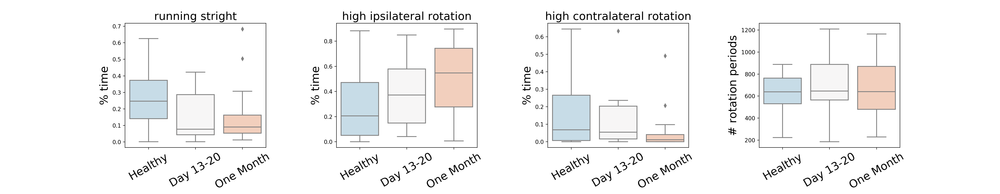

In [89]:
# repeat with paired t-test
# sns.set_style("white")
df2Rot = dfRot.groupby(['Mouse','Period']).mean()
df2Rot.reset_index(inplace=True)
#dfRot.to_csv(figFolder+'postAmphRot2R.csv')

fig, ax = plt.subplots(1,4,figsize=(25.04,4.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24})
pOrder = ['Healthy','Day 13-20','One Month']
with sns.color_palette(colorPallet3):#sns.color_palette("PuBuGn_d"):
    columns = ['percent_low','percent_high_AC','percent_high_C','trans'] 
    labels = ['running stright','high ipsilateral rotation',
              'high contralateral rotation','']
    Ylabels = ['% time','% time','% time','# rotation periods']
    for ind in range(len(columns)):
        sns.boxplot(x="Period", y=columns[ind], data=df2Rot,ax =ax[ind],order = pOrder)
        #sns.scatterplot(x="Period", y=columns[ind], data=df2Rot,ax =ax[ind])
        ax[ind].set_xticklabels(ax[ind].get_xticklabels(),rotation=30,fontsize=20)
        ax[ind].set_ylabel(Ylabels[ind],fontsize=20)
        ax[ind].set_xlabel("")  
        ax[ind].set_title(labels[ind],fontsize=20)      
        
fig.savefig(figFolder+'figure3_post_abcd.png',transparent=False,format='png')
fig.savefig(figFolder+'figure3_post_abcd.svg',transparent=True,format='svg')


<IPython.core.display.Javascript object>


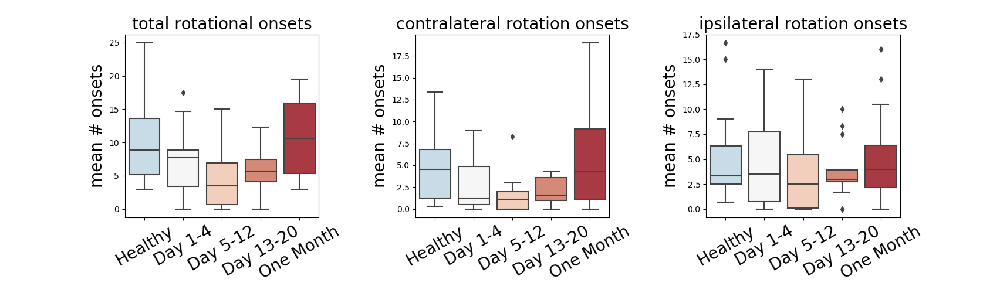

In [52]:
df2Rot = dfRot.groupby(['Mouse','Period']).mean()
df2Rot.reset_index(inplace=True)
df2Rot

fig, ax = plt.subplots(1,3,figsize=(17.04,4.88),gridspec_kw = {'hspace':.1,'wspace':.5,'bottom':0.24})
pOrder = ['Healthy','Day 1-4','Day 5-12','Day 13-20','One Month']
with sns.color_palette(colorPallet3):#sns.color_palette("PuBuGn_d"):
    columns = ['rotOnset','cRotOnset','acRotOnset'] 
    labels = ['total rotational onsets','contralateral rotation onsets','ipsilateral rotation onsets']
    for ind in range(len(columns)):
        sns.boxplot(x="Period", y=columns[ind], data=df2Rot,ax =ax[ind],order = pOrder)
        #sns.scatterplot(x="Period", y=columns[ind], data=df2Rot,ax =ax[ind])
        ax[ind].set_xticklabels(ax[ind].get_xticklabels(),rotation=30,fontsize=20)
        ax[ind].set_ylabel("mean # onsets",fontsize=20)
        ax[ind].set_xlabel("")
        ax[ind].set_title(labels[ind],fontsize=20)

fig.savefig(figFolder+'figure3_post_efg.png',transparent=False,format='png')
fig.savefig(figFolder+'figure3_oost_efg.svg',transparent=True,format='svg')
